In [17]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn import  linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import make_pipeline
from sklearn.utils import resample
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from sklearn.model_selection import GridSearchCV
import math as ma
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import autograd.numpy as np

# To do elementwise differentiation:
from autograd import elementwise_grad as egrad 
from autograd import grad

In [18]:
#Functions for R2 and MSE
def R2(y_data, y_model):
    return 1 - np.sum((y_data - y_model) ** 2) / np.sum((y_data - np.mean(y_data)) ** 2)
def MSE(y_data,y_model):
    n = np.size(y_model)
    return np.sum((y_data-y_model)**2)/n

In [19]:
def noiseGeneration(z_input, scaling = 0.1):
    
    nosyZ= z_input + np.random.randn(*z_input.shape) * scaling
    return nosyZ

In [20]:
def X_generator(x, y, n):
    if len(x.shape) > 1:
        x = np.ravel(x)
        y = np.ravel(y)

    N = len(x)
    l = int((n+1)*(n+2)/2)  # Number of elements in beta
    X = np.ones((N,l))

    for i in range(1,n+1):
        q = int((i)*(i+1)/2)
        for k in range(i+1):
            X[:,q+k] = (x**(i-k))*(y**k)

    return X

In [21]:
# Franke Function
def FrankeFunction(x,y):
    term1 = 0.75*np.exp(-(0.25*(9*x-2)**2) - 0.25*((9*y-2)**2))
    term2 = 0.75*np.exp(-((9*x+1)**2)/49.0 - 0.1*(9*y+1))
    term3 = 0.5*np.exp(-(9*x-7)**2/4.0 - 0.25*((9*y-3)**2))
    term4 = -0.2*np.exp(-(9*x-4)**2 - (9*y-7)**2)
    return term1 + term2 + term3 + term4

In [22]:
# split in training and test data
def traningDataGenerator(X,z):
    X_train, X_test, y_train, y_test = train_test_split(X,z,test_size=0.2, random_state= 11)
    return X_train, X_test, y_train, y_test

In [23]:
#Scaling function for the feature matrix
def scale(X_train,X_test,y_train,y_test):
    scaler = StandardScaler(with_std=True)
    scaler_x = scaler.fit(X_train) # Scaling x-data
    X_train_scaled = scaler_x.transform(X_train)
    X_test_scaled = scaler_x.transform(X_test)
    
    
    #scaler_y = np.mean(y_train)
    #y_train_scaled = y_train - scaler_y
    #y_test_scaled = y_test - scaler_y
    scaler_y = scaler.fit(y_train.reshape(-1,1))
    y_train_scaled = scaler_y.transform(y_train.reshape(-1,1)).ravel()
    y_test_scaled = scaler_y.transform(y_test.reshape(-1,1)).ravel()
    return X_train_scaled,X_test_scaled,y_train_scaled,y_test_scaled

In [24]:
def plot_z(x,y,z,title):
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib import cm
    from matplotlib.ticker import LinearLocator, FormatStrFormatter
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(x_mesh, y_mesh, z, cmap=cm.coolwarm,linewidth=0, antialiased=False)
    # Customize the z axis.
    ax.set_zlim(-0.10, 1.40)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)
    plt.title("{}".format(title))
    plt.show()

# Initializing start Data

In [25]:
x = np.linspace(0,1,10)
y = np.linspace(0,1,10)
x_mesh,y_mesh = np.meshgrid(x,y)
x_flat = x_mesh.ravel()
y_flat = y_mesh.ravel()

z = FrankeFunction(x_flat,y_flat)

# Defining standard gradient descent for Ridge

In [26]:
def Hessian_eta_Ridge(X_train,lmb,n):
    XT_X = X_train.T @ X_train
    Id = n*lmb* np.eye(XT_X.shape[0])


    H = (2.0/n)* XT_X+2*lmb* np.eye(XT_X.shape[0])
    EigValues, EigVectors = np.linalg.eig(H)
    eta = 1.0/np.max(EigValues)
    eta = 1.0/np.max(EigValues)
 
    return eta

In [34]:
def grad_descent_ridge(X_train,y_train,eta,lmb):
    
    np.random.seed(644)
    converge_criteria = 10 # some initial value
    cond = 0
    gradient_n = 0
    beta = np.random.randn(X_train.shape[1]) -0.5 # Picking out initial beta values. 
    while converge_criteria > 1e-8:
        dc_db = (2.0/len(X_train))*X_train.T @ (X_train @ (beta)- y_train) + 2*lmb*beta # derivative of the cost function
        converge_criteria = np.linalg.norm(dc_db-gradient_n)
        gradient_n = dc_db #gradient n-1
        beta = beta - eta*dc_db
        cond += 1 
        if cond > 20000:
            converge_criteria = 0
    theta_gd = beta
    return theta_gd , cond

In [37]:
def grad_descent_ridge_momentum(X_train,y_train,eta,lmb,gamma=0.9):
    np.random.seed(644)
    v_initial  = 0 #start the velocity term at zero
    beta = np.random.randn(X_train.shape[1]) - 0.5 # Picking out initial beta values.
    itter = 0 # number of itterations needed to converge
    converge_criteria = 20 # some inital value
    while converge_criteria > 1e-8:
        dc_db = (2.0/len(X_train))*X_train.T @ (X_train @ (beta)- y_train) + 2*lmb*beta # derivative of the cost function
        
        v_vector = gamma*v_initial + eta*dc_db
        beta = beta - v_vector
        converge_criteria = np.linalg.norm(v_vector-v_initial)
        v_initial = v_vector
        itter += 1
        if itter > 20000:
            converge_criteria = 0
    theta_moment = beta
    return theta_moment,itter

# Own written grid search algorithm for oprimal lambda eta combo

In [38]:
def optimal_eta_lambda_combo_GD(X_train,y_train,algo = "velo"):
    np.random.seed(644)
    x = X_train
    y = y_train
    numberOfLambdas = 20
    theta_j = 0
    itter_j = 0
    numberOfEtas = 5
    etas = np.logspace(-5,-1,numberOfEtas)
    lambdas = np.logspace(-4,4,numberOfLambdas)
    bestLambda_index = 0
    bestEta_index = 0
    mse_eta_train_ridg = np.zeros((numberOfLambdas,len(etas)))
    for i in range(numberOfLambdas):
        lmb = lambdas[i]
        for j in range(numberOfEtas):
            eta = etas[j]
            if algo == "velo":
                theta_j,itter_j = grad_descent_ridge_momentum(x,y,eta,lmb)
            elif algo == "plain":
                theta_j,itter_j = grad_descent_ridge(x,y,eta,lmb)
            else:
                return print("this is not a valid choice, Pick momentum or plain")
            z_tilde_ols = x @ theta_j
            mse_eta_train_ridg[i,j] = MSE(z_train,z_tilde_ols)
           
            if mse_eta_train_ridg[i,j] < mse_eta_train_ridg[i,bestEta_index]:
                    bestEta_index = j
        if mse_eta_train_ridg[i,bestEta_index] < mse_eta_train_ridg[bestLambda_index,bestEta_index]:
            bestLambda_index = i
        
    return lambdas[bestLambda_index], etas[bestEta_index]#, Best lambda and eta based on 

In [39]:
def optimal_eta_lambda_combo_pandas(X_train,y_train,algo = "velo"):
    np.random.seed(644)
    x = X_train
    y = y_train
    numberOfLambdas = 20
    theta_j = 0
    itter_j = 0
    numberOfEtas = 5
    etas = np.logspace(-5,-1,numberOfEtas)
    lambdas = np.logspace(-4,4,numberOfLambdas)
    bestLambda_index = 0
    bestEta_index = 0
    mse_eta_train_ridg = np.zeros((numberOfLambdas,len(etas)))
    for i in range(numberOfLambdas):
        lmb = lambdas[i]
        for j in range(numberOfEtas):
            eta = etas[j]
            if algo == "velo":
                theta_j,itter_j = grad_descent_ridge_momentum(x,y,eta,lmb)
            elif algo == "plain":
                theta_j,itter_j = grad_descent_ridge(x,y,eta,lmb)
            else:
                return print("this is not a valid choice, Pick momentum or plain")
            z_tilde_ols = x @ theta_j
            mse_eta_train_ridg[i,j] = MSE(z_train,z_tilde_ols)
    df_grid_lambdas = pd.DataFrame(mse_eta_train_ridg, index = lambdas,columns = etas)
    return df_grid_lambdas.idxmin()
            

# Running tests on gradient descent methods

# Grid searching For otimal eta lambda combo. 

In [40]:
def Cost_ridge(y,X,theta,lmb):
    return np.sum((y- X @ theta)**2 + lmb* (theta @ theta.T))

In [41]:
grad_ridge = grad(Cost_ridge,2)

In [74]:

max_degree = 10

df_min_velo = np.zeros(max_degree + 1)
df_min_plain = np.zeros(max_degree +1)

lambda_opti_m = np.zeros(max_degree + 1)
eta_opti_m = np.zeros(max_degree +1)


for i in range(0, max_degree + 1):
    poly.append(i)
    X = X_generator(x_flat,y_flat,i)
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    a = optimal_eta_lambda_combo_pandas(X_train,z_train)
    b = optimal_eta_lambda_combo_GD(X_train,z_train,algo="plain")
    

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/1918429747.py:10: RuntimeWarning: invalid value encountered in add
  v_vector = gamma*v_initial + eta*dc_db
C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/3382762045.py:12: RuntimeWarning: invalid value encountered in subtract
  beta = beta - eta*dc_db


KeyboardInterrupt: 

In [42]:
poly = []
eta_ij = 0
lmb_ij = 0
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)

max_degree = 10

lambda_opti = np.zeros(max_degree + 1)
eta_opti = np.zeros(max_degree +1)

lambda_opti_m = np.zeros(max_degree + 1)
eta_opti_m = np.zeros(max_degree +1)


for i in range(0, max_degree + 1):
    poly.append(i)
    X = X_generator(x_flat,y_flat,i)
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    lambda_opti_m[i],eta_opti_m[i] = optimal_eta_lambda_combo_GD(X_train,z_train)
    lambda_opti[i],eta_opti[i] = optimal_eta_lambda_combo_GD(X_train,z_train,algo="plain")
    

C:\Users\Lasse\AppData\Local\Temp/ipykernel_3076/3834031156.py:8: RuntimeWarning: overflow encountered in multiply
  dc_db = (2.0/len(X_train))*X_train.T @ (X_train @ (beta)- y_train) + 2*lmb*beta # derivative of the cost function
C:\Users\Lasse\AppData\Local\Temp/ipykernel_3076/3834031156.py:10: RuntimeWarning: invalid value encountered in add
  v_vector = gamma*v_initial + eta*dc_db
C:\Users\Lasse\AppData\Local\Temp/ipykernel_3076/3123216096.py:10: RuntimeWarning: overflow encountered in subtract
  converge_criteria = np.linalg.norm(dc_db-gradient_n)
C:\Users\Lasse\AppData\Local\Temp/ipykernel_3076/3123216096.py:9: RuntimeWarning: overflow encountered in multiply
  dc_db = (2.0/len(X_train))*X_train.T @ (X_train @ (beta)- y_train) + 2*lmb*beta # derivative of the cost function
C:\Users\Lasse\AppData\Local\Temp/ipykernel_3076/3123216096.py:12: RuntimeWarning: invalid value encountered in subtract
  beta = beta - eta*dc_db
C:\Users\Lasse\AppData\Local\Temp/ipykernel_3076/3834031156.py:

KeyboardInterrupt: 

In [47]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV

ridge_params = {'alpha':np.logspace(-5,5,100)}
max_degree = 10
for i in range(0, max_degree + 1):
    poly.append(i)
    X = X_generator(x_flat,y_flat,i)
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    model = Ridge()
    rsearch = RandomizedSearchCV(estimator=model, param_distributions=ridge_params, n_iter=100)
    rsearch.fit(X_train,z_train)
    print("best score:",rsearch.best_score_)
    print("best lambda value of degree {}:".format(i),rsearch.best_estimator_.alpha)
    


best score: -0.011166339542602311
best lambda value of degree 0: 1e-05
best score: 0.6333310263949667
best lambda value of degree 1: 0.7054802310718645
best score: 0.6928635910071737
best lambda value of degree 2: 0.10974987654930568
best score: 0.7846949253936034
best lambda value of degree 3: 0.006734150657750821
best score: 0.8131135124376101
best lambda value of degree 4: 0.00016297508346206434
best score: 0.8405482382350188
best lambda value of degree 5: 2.0092330025650458e-05
best score: 0.8406979424003399
best lambda value of degree 6: 1e-05
best score: 0.839910332339653
best lambda value of degree 7: 1.2618568830660211e-05
best score: 0.8389725776719061
best lambda value of degree 8: 2.0092330025650458e-05
best score: 0.8404803500679943
best lambda value of degree 9: 1e-05
best score: 0.8454773663611338
best lambda value of degree 10: 1e-05


# Comparing optimal Eta to Hessian For each plynomial

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


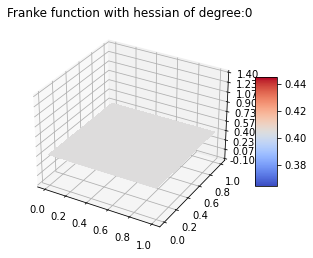

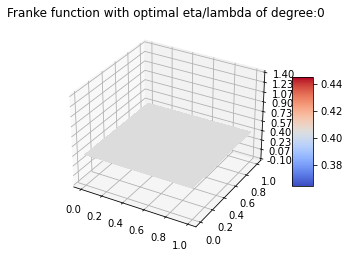

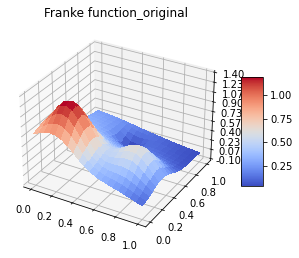

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


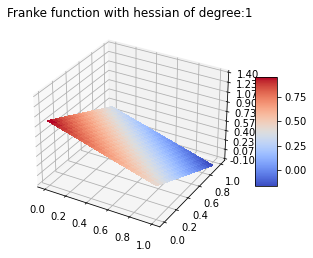

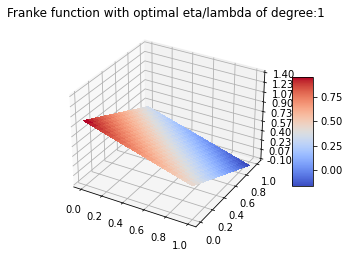

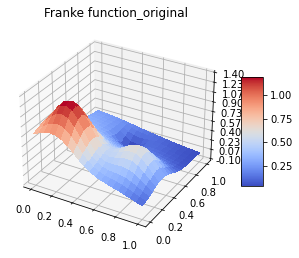

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


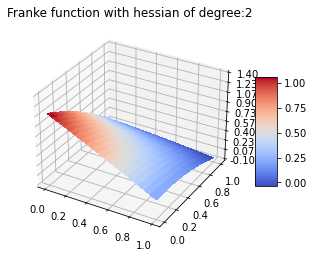

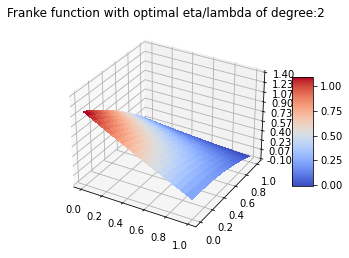

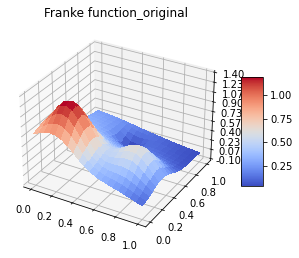

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


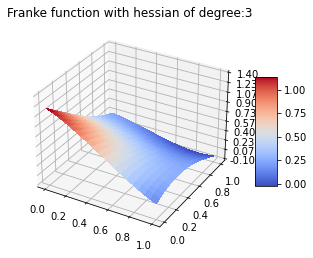

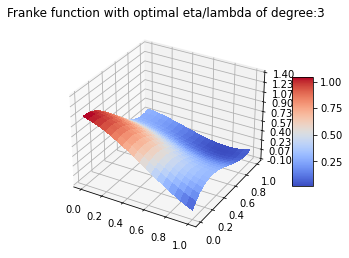

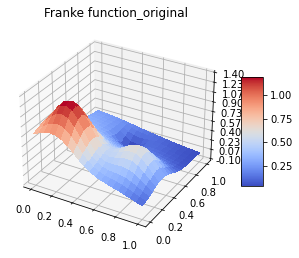

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


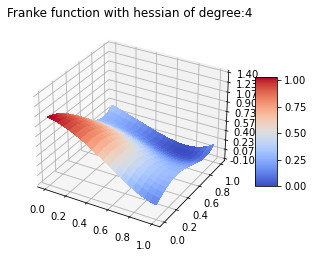

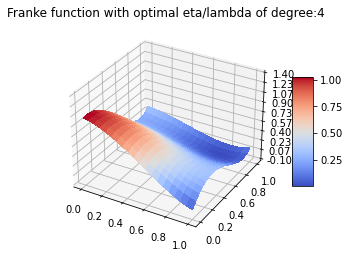

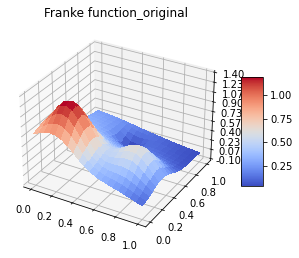

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


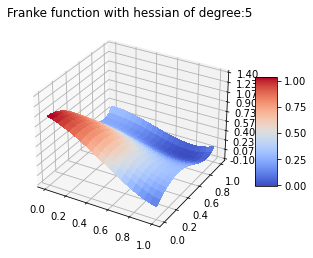

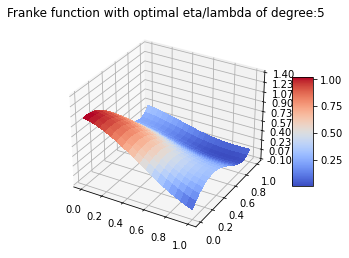

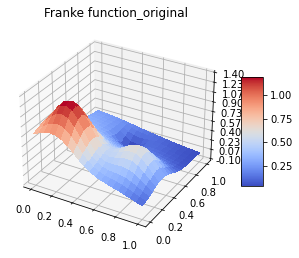

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


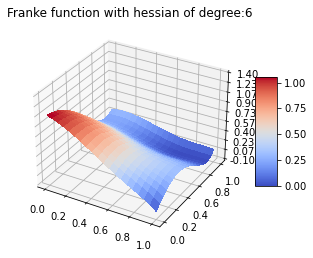

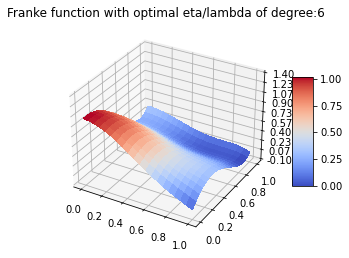

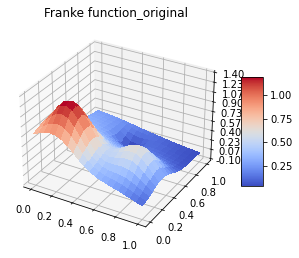

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


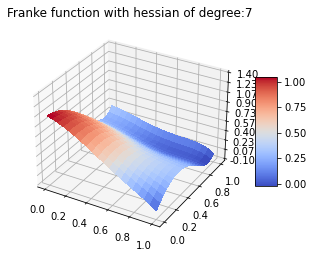

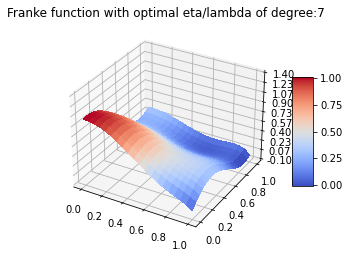

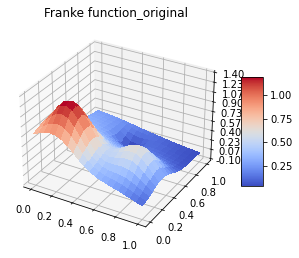

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


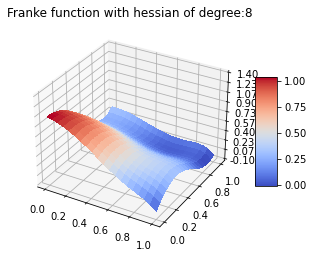

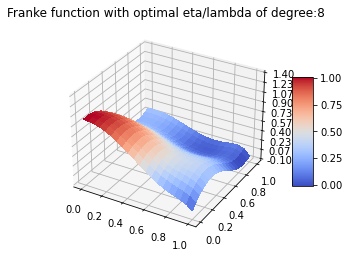

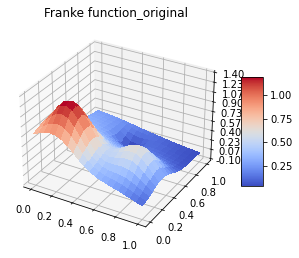

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


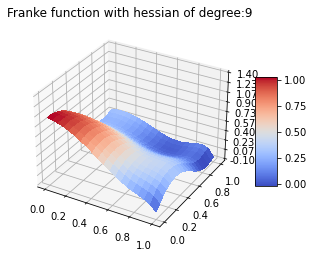

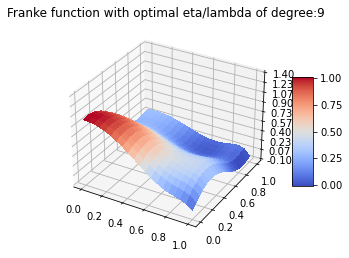

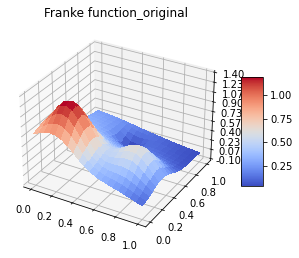

C:\Users\Lasse\AppData\Local\Temp/ipykernel_17468/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


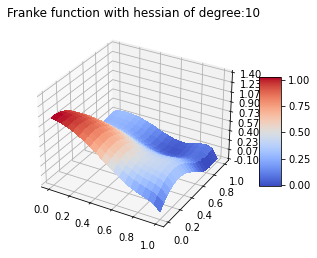

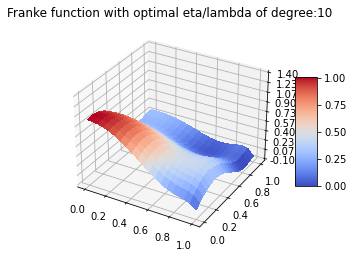

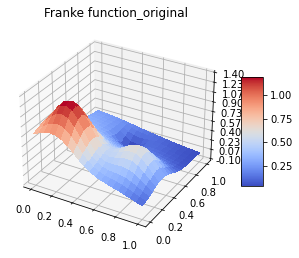

In [30]:
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)

mse_ridge_gd_poly_hessian = []
ridge_gd_itter_hessian = []
theta_i_hessian = 0
itter_i_hessian = 0


theta_i_opti = 0
itter_i_opti = 0
ridge_gd_itter_opti= []
mse_ridge_gd_opti = []

z_mesh = FrankeFunction(x_mesh,y_mesh)

max_degree = 10
for i in range(0, max_degree + 1):
    X = X_generator(x_flat,y_flat,i)
    eta_opti = eta_opti_m[i]
    lmb = lambda_opti_m[i]
    eta_h = Hessian_eta_Ridge(X,lmb,len(X[0]))
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    #sending to functions
    theta_i_hessian,itter_i_hessian = grad_descent_ridge_momentum(X_train,z_train,eta_h,lmb) # Hessian calculations
    theta_i_opti, itter_i_opti = grad_descent_ridge_momentum(X_train,z_train,eta_opti,lmb)
    #appending the itterations to lists for comparisons
    ridge_gd_itter_hessian.append(itter_i_hessian)
    ridge_gd_itter_opti.append(itter_i_opti)
    #making predictions
    z_pred_ridge_opti = X_test @ theta_i_opti
    z_pred_ridge_h = X_test @ theta_i_hessian
    mse_ridge_gd_opti.append(mean_squared_error(z_test,z_pred_ridge_opti))
    mse_ridge_gd_poly_hessian.append(mean_squared_error(z_test,z_pred_ridge_h))
    #Plotting the franke function
    z_plot_h = X @ theta_i_hessian
    z_plot_h = z_plot_h.reshape(z_mesh.shape)
    z_plot_opti = X @ theta_i_opti
    z_plot_opti = z_plot_opti.reshape(z_mesh.shape)
    plot_z(x_mesh,y_mesh,z_plot_h,"Franke function with hessian of degree:{}".format(i))
    plot_z(x_mesh,y_mesh,z_plot_opti,"Franke function with optimal eta/lambda of degree:{}".format(i))
    plot_z(x_mesh,y_mesh,z_mesh,"Franke function_original")

df_Gd_ridge_poly = pd.DataFrame({"mse Hessian eta":mse_ridge_gd_poly_hessian,"hessian itterations":ridge_gd_itter_hessian,\
                              "mse optimal eta":mse_ridge_gd_opti,"optimal itterations":ridge_gd_itter_opti})

In [75]:
df_Gd_ridge_poly

,mse Hessian eta,hessian itterations,mse optimal eta,optimal itterations
0,0.079640,336,0.079640,297
1,0.031524,2645,0.031558,290
2,0.027100,10761,0.028041,1537
3,0.025758,6636,0.021952,10297
4,0.023204,9226,0.021048,12862
5,0.021317,12109,0.020202,13848
6,0.020220,10454,0.019256,14766
7,0.020158,9534,0.018621,15647
8,0.019262,12636,0.018292,15901
9,0.019073,13229,0.018136,16366


Observed there is minute difference in the MSE, and somewhat minute differnece in number of itterations for ridge. This is with selecting the opimal lambda values for the momentum case, Witch in turn is closer to that of OLS as expected.

# Comparing number of itterations and MSE for different values of eta and Lambda

In [80]:
X = X_generator(x_flat,y_flat,6)
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)
X_train,X_test,z_train,z_test = traningDataGenerator(X,z)

In [ ]:
numberOfLambdas = 20
numberOfEtas = 5
eta_list = []
etas = np.logspace(-5,-1,numberOfEtas)
lambdas = np.logspace(-4,4,numberOfLambdas)
bestLambda_index = 0
bestEta_index = 0
mse_eta_ridg = np.zeros((numberOfLambdas,len(etas)))
itter_ridg  = np.zeros((numberOfLambdas,len(etas))) 
for i in range(numberOfLambdas):
    lmb = lambdas[i]
    for j in range(numberOfEtas):
        eta = etas[j]
        theta_j,itter_j  = grad_descent_ridge_momentum(X_train,z_train,eta,lmb)
        z_pred = X_test @theta_j
        mse_eta_ridg[i,j] = mean_squared_error(z_test,z_pred)
        itter_ridg[i,j] = itter_j
            

for i in range(numberOfEtas):
    eta_list.append("eta_{}".format(i))
df_mse_heatmap_gd = pd.DataFrame(mse_eta_ridg, index = lambdas, columns = eta_list)


df_itteration_heatmap_gd = pd.DataFrame(itteration_list, index = lambdas, columns = eta_list)
            

[-3.55760345 -2.2956043  -0.9687398  -1.80058391 -0.73983729 -0.34949721
 -1.5166885  -0.61705508 -0.35297447 -0.1093331  -1.32763573 -0.53530094
 -0.31569503 -0.19496691  0.00521985 -1.19105814 -0.47622812 -0.2828123
 -0.19151734 -0.11556974  0.06577716 -1.08714843 -0.4312364  -0.25632619
 -0.1772273  -0.12725485 -0.06994233  0.10058177]
[-3.557453   -2.29551264 -0.96866178 -1.80051483 -0.73979026 -0.34944264
 -1.51663195 -0.6170198  -0.35294173 -0.10929047 -1.32758726 -0.53527216
 -0.3156705  -0.19494138  0.00525518 -1.19101535 -0.47620353 -0.28279231
 -0.1914982  -0.11554859  0.06580758 -1.08710989 -0.43121477 -0.25630914
 -0.17721171 -0.12723897 -0.06992412  0.10060866]
[-3.55716715 -2.29533849 -0.96851355 -1.80038359 -0.73970091 -0.34933895
 -1.51652452 -0.61695277 -0.35287952 -0.10920949 -1.32749518 -0.53521748
 -0.3156239  -0.19489287  0.00532232 -1.19093407 -0.47615682 -0.28275434
 -0.19146184 -0.11550839  0.06586537 -1.08703667 -0.43117367 -0.25627675
 -0.17718208 -0.12720881 

[-3.43340833 -2.21989679 -0.90445178 -1.74351476 -0.70105712 -0.30457593
 -1.46996497 -0.58795188 -0.32599833 -0.07427248 -1.2875811  -0.51155604
 -0.29547826 -0.17394511  0.03427048 -1.15569928 -0.45593807 -0.2663375
 -0.17575527 -0.09815929  0.09077551 -1.05529539 -0.41338322 -0.24226886
 -0.16437903 -0.11418417 -0.05496004  0.12266777]
[-3.43196074 -2.21901373 -0.90370412 -1.74284888 -0.70060569 -0.30405417
 -1.46941968 -0.58761294 -0.32568465 -0.07386561 -1.28711358 -0.51127944
 -0.29524307 -0.17370086  0.03460739 -1.15528653 -0.45570166 -0.26614579
 -0.17557204 -0.09795711  0.09106528 -1.05492353 -0.41317518 -0.24210525
 -0.16422962 -0.1140323  -0.05478614  0.12292367]
[-3.43051389 -2.2181311  -0.90295689 -1.74218332 -0.70015449 -0.30353272
 -1.46887466 -0.58727419 -0.32537116 -0.07345899 -1.28664628 -0.51100298
 -0.29500801 -0.17345675  0.03494409 -1.15487397 -0.45546538 -0.26595418
 -0.17538891 -0.09775505  0.09135486 -1.05455184 -0.41296725 -0.24194172
 -0.1640803  -0.11388052 

 -0.14289566 -0.09238048 -0.03003779  0.15921934]
[-3.22301791 -2.09138361 -0.7962381  -1.64654837 -0.63560091 -0.22923845
 -1.39053039 -0.53876842 -0.28061345 -0.01561968 -1.21945664 -0.47139794
 -0.26141797 -0.13865501  0.08277908 -1.09554298 -0.42160533 -0.23855861
 -0.14925485 -0.06897813  0.13245738 -1.00109035 -0.38316233 -0.21855304
 -0.14275855 -0.09224155 -0.0298793   0.15945095]
[-3.22167821 -2.09056413 -0.79555207 -1.64592965 -0.63518515 -0.22876207
 -1.39002334 -0.53845576 -0.28032583 -0.01524945 -1.21902166 -0.47114252
 -0.26120191 -0.1384317   0.08308488 -1.0951588  -0.42138689 -0.2383823
 -0.14908699 -0.06879369  0.13271988 -1.00074411 -0.38297    -0.21840245
 -0.14262151 -0.0921027  -0.02972091  0.1596824 ]
[-3.2203392  -2.08974506 -0.79486643 -1.64531123 -0.63476962 -0.22828597
 -1.38951653 -0.53814326 -0.28003838 -0.01487946 -1.21858689 -0.47088724
 -0.26098597 -0.13820853  0.08339048 -1.09477479 -0.42116856 -0.23820608
 -0.14891922 -0.06860936  0.1329822  -1.00039804

[-2.95500683e+00 -1.92712267e+00 -6.59849264e-01 -1.52241696e+00
 -5.52723133e-01 -1.34874082e-01 -1.28874496e+00 -4.76366185e-01
 -2.23461941e-01  5.75319405e-02 -1.13210578e+00 -4.20383455e-01
 -2.18426535e-01 -9.43794732e-02  1.43086188e-01 -1.01837056e+00
 -3.77954025e-01 -2.03447198e-01 -1.15921935e-01 -3.24659461e-02
  1.84148270e-01 -9.31524946e-01 -3.44714532e-01 -1.88549398e-01
 -1.15523558e-01 -6.47113876e-02  1.43695430e-03  2.04975305e-01]
[-2.95380423e+00 -1.92638406e+00 -6.59241394e-01 -1.52185826e+00
 -5.52352679e-01 -1.34455188e-01 -1.28828656e+00 -4.76086891e-01
 -2.23207368e-01  5.78557677e-02 -1.13171223e+00 -4.20154951e-01
 -2.18234750e-01 -9.41827223e-02  1.43352600e-01 -1.01802275e+00
 -3.77758398e-01 -2.03290428e-01 -1.15773568e-01 -3.23039773e-02
  1.84376247e-01 -9.31211352e-01 -3.44542156e-01 -1.88415355e-01
 -1.15402219e-01 -6.45890483e-02  1.57568619e-03  2.05175819e-01]
[-2.95260225e+00 -1.92564582e+00 -6.58633874e-01 -1.52129983e+00
 -5.51982428e-01 -1.340

[-2.7591294  -1.80661573 -0.5613848  -1.43119167 -0.49257317 -0.06724343
 -1.21386179 -0.43096977 -0.18224507  0.10969363 -1.06779442 -0.38321876
 -0.18733742 -0.06258659  0.18592522 -0.96152131 -0.34612274 -0.17801596
 -0.09191503 -0.00633128  0.22075679 -0.8802567  -0.3166575  -0.16679453
 -0.09587473 -0.04494256  0.02379711  0.23713836]
[-2.75802664 -1.80593608 -0.56083372 -1.43067675 -0.49223567 -0.06686627
 -1.2134389  -0.43071477 -0.18201451  0.1099838  -1.0674311  -0.38300986
 -0.18716328 -0.06240912  0.18616308 -0.96120007 -0.34594373 -0.17787341
 -0.09178083 -0.00618562  0.22095975 -0.87996693 -0.31649966 -0.16667252
 -0.0957648  -0.04483221  0.02392157  0.23731646]
[-2.75692445 -1.80525676 -0.56028297 -1.43016206 -0.49189836 -0.06648934
 -1.2130162  -0.4304599  -0.18178409  0.11027377 -1.06706795 -0.38280106
 -0.18698925 -0.06223176  0.18640077 -0.96087897 -0.34576482 -0.17773093
 -0.09164671 -0.00604006  0.22116257 -0.87967729 -0.3163419  -0.16655058
 -0.09565493 -0.04472193

 -0.07927839 -0.02831893  0.04249788  0.26376289]
[-2.59064813 -1.70260323 -0.47765838 -1.35232805 -0.44117231 -0.01013362
 -1.14906284 -0.39209131 -0.14723293  0.15352545 -1.0121062  -0.35134828
 -0.16086079 -0.03569091  0.22178982 -0.9122698  -0.31880148 -0.15632537
 -0.07154833  0.01571013  0.25131532 -0.83582246 -0.29255968 -0.14822101
 -0.07917817 -0.02821877  0.04261023  0.26392197]
[-2.58963096 -1.70197417 -0.4771559  -1.3518507  -0.44086303 -0.00979212
 -1.14867043 -0.39185711 -0.14702292  0.15378686 -1.01176885 -0.35115617
 -0.16070177 -0.03552994  0.2220033  -0.91197136 -0.31863672 -0.15619499
 -0.07142625  0.01584184  0.25149693 -0.83555316 -0.2924143  -0.14810931
 -0.079078   -0.02811868  0.04272251  0.26408094]
[-2.58861431 -1.70134541 -0.47665371 -1.35137357 -0.44055393 -0.00945084
 -1.1482782  -0.39162304 -0.14681303  0.15404811 -1.01143165 -0.35096416
 -0.16054283 -0.03536906  0.22221662 -0.91167306 -0.31847204 -0.15606468
 -0.07130424  0.01597347  0.2516784  -0.8352839

 -0.06794294 -0.01701085  0.05515534  0.28161113]
[-2.4750699  -1.63103163 -0.42081261 -1.29798588 -0.40611739  0.0283949
 -1.10437405 -0.36552435 -0.12348386  0.18296203 -0.97367803 -0.32954451
 -0.14285974 -0.01751611  0.24579238 -0.87826831 -0.3000951  -0.14155832
 -0.05774975  0.03056264  0.27171031 -0.80513586 -0.27605052 -0.1355647
 -0.06784938 -0.0169177   0.05525937  0.28175718]
[-2.47411127 -1.63043719 -0.42034331 -1.29753427 -0.4058274   0.02871206
 -1.10400252 -0.36530438 -0.12328788  0.18320385 -0.97335846 -0.32936389
 -0.14271104 -0.01736638  0.24598924 -0.8779855  -0.29994008 -0.14143625
 -0.05763594  0.03068484  0.27187737 -0.80488059 -0.27591367 -0.13546004
 -0.06775588 -0.0168246   0.05536334  0.28190312]
[-2.47315312 -1.62984304 -0.41987427 -1.29708286 -0.40553757  0.02902903
 -1.10363116 -0.36508453 -0.12309201  0.1834455  -0.97303904 -0.32918336
 -0.14256242 -0.01721675  0.24618597 -0.87770282 -0.29978514 -0.14131426
 -0.0575222   0.03080696  0.27204431 -0.80462543 

[-2.32238924e+00 -1.53617457e+00 -3.46558385e-01 -1.22585707e+00
 -3.60103223e-01  7.83689581e-02 -1.04500454e+00 -3.30577333e-01
 -9.24945015e-02  2.20949356e-01 -9.22593952e-01 -3.00826749e-01
 -1.19310983e-01  6.10065552e-03  2.76646079e-01 -8.33047651e-01
 -2.75435693e-01 -1.22211698e-01 -3.97681165e-02  4.98016780e-02
  2.97844440e-01 -7.64308708e-01 -2.54273660e-01 -1.18967126e-01
 -5.30622103e-02 -2.23302588e-03  7.16037405e-02  3.04552189e-01]
[-2.32150768e+00 -1.53562577e+00 -3.46132672e-01 -1.22543938e+00
 -3.59838603e-01  7.86541834e-02 -1.04466055e+00 -3.30376089e-01
 -9.23169536e-02  2.21165458e-01 -9.22297853e-01 -3.00661246e-01
 -1.19175847e-01  6.23560322e-03  2.76821153e-01 -8.32785463e-01
 -2.75293502e-01 -1.22100573e-01 -3.96651806e-02  4.99113893e-02
  2.97992430e-01 -7.64071939e-01 -2.54148040e-01 -1.18871733e-01
 -5.29774736e-02 -2.14911780e-03  7.16967961e-02  3.04681052e-01]
[-2.32062657e+00 -1.53507723e+00 -3.45707210e-01 -1.22502189e+00
 -3.59574128e-01  7.893

 -0.03966671  0.0109927   0.0862172   0.32464011]
[-2.18114988 -1.44806915 -0.27884016 -1.15873974 -0.3178782   0.12353072
 -0.98969849 -0.29842181 -0.06427173  0.25505025 -0.87496979 -0.27436076
 -0.09779475  0.02749314  0.30419974 -0.79086556 -0.25268533 -0.10450168
 -0.0234197   0.06715739  0.32108551 -0.72620754 -0.2341666  -0.10375469
 -0.03958999  0.01106821  0.0863003   0.32475342]
[-2.18033933 -1.44756244 -0.27845451 -1.15835336 -0.31763692  0.12378663
 -0.98937993 -0.29823781 -0.06411113  0.25524276 -0.87469536 -0.27420918
 -0.09767209  0.02761452  0.30435484 -0.79062242 -0.25255496 -0.10440062
 -0.02332675  0.06725564  0.32121603 -0.72598787 -0.23405133 -0.10366782
 -0.03951331  0.01114368  0.08638335  0.32486664]
[-2.17952918 -1.44705597 -0.27806909 -1.15796716 -0.31739578  0.12404237
 -0.9890615  -0.2980539  -0.06395062  0.25543514 -0.87442105 -0.27405769
 -0.09754951  0.02773581  0.30450983 -0.79037938 -0.25242466 -0.10429962
 -0.02323387  0.06735383  0.32134644 -0.7257682

[-2.0982223  -1.39615806 -0.23957482 -1.1191329  -0.29326028  0.14950345
 -0.95703066 -0.27963044 -0.04792762  0.27454274 -0.84682108 -0.2588728
 -0.08529846  0.03982181  0.31987449 -0.76592126 -0.23935927 -0.0941989
 -0.01396667  0.07712253  0.33425531 -0.70366775 -0.22238067 -0.09489516
 -0.03178551  0.01873355  0.09471364  0.33616339]
[-2.09745329 -1.395676   -0.23921256 -1.11876487 -0.29303264  0.14974226
 -0.95672699 -0.27945652 -0.04777691  0.27472152 -0.84655935 -0.25872937
 -0.08518309  0.03993527  0.32001796 -0.76568929 -0.23923582 -0.09410372
 -0.01387956  0.07721409  0.33437566 -0.7034581  -0.22227145 -0.09481327
 -0.03171353  0.01880409  0.09479085  0.3362675 ]
[-2.09668467 -1.39519416 -0.23885051 -1.11839701 -0.29280514  0.14998092
 -0.95642346 -0.27928269 -0.04762629  0.27490016 -0.84629774 -0.25858601
 -0.08506779  0.04004865  0.32016132 -0.76545741 -0.23911243 -0.09400859
 -0.0137925   0.07730559  0.3344959  -0.70324854 -0.22216229 -0.09473143
 -0.0316416   0.01887459  

 -1.98968756e-02  3.03429379e-02  1.07361276e-01  3.53053450e-01]
[-1.96932772e+00 -1.31517186e+00 -1.79372307e-01 -1.05724007e+00
 -2.55288723e-01  1.88963693e-01 -9.05929967e-01 -2.50571879e-01
 -2.29035944e-02  3.03954298e-01 -8.02759044e-01 -2.34886542e-01
 -6.61048753e-02  5.85962244e-02  3.43396277e-01 -7.26855043e-01
 -2.18700283e-01 -7.83456202e-02  4.81813458e-04  9.22344375e-02
  3.53929075e-01 -6.68352875e-01 -2.04095612e-01 -8.12463254e-02
 -1.98321285e-02  3.04059156e-02  1.07429534e-01  3.53143623e-01]
[-1.96862303e+00 -1.31472801e+00 -1.79046172e-01 -1.05690049e+00
 -2.55082188e-01  1.89176130e-01 -9.05649413e-01 -2.50413553e-01
 -2.27681625e-02  3.04111882e-01 -8.02517025e-01 -2.34755721e-01
 -6.60007743e-02  5.86974582e-02  3.43521821e-01 -7.26640391e-01
 -2.18587533e-01 -7.82595305e-02  5.59918114e-04  9.23156884e-02
  3.54033746e-01 -6.68158784e-01 -2.03995768e-01 -8.11721470e-02
 -1.97674210e-02  3.04688518e-02  1.07497743e-01  3.53233720e-01]
[-1.96791868e+00 -1.31

 -0.01355388  0.03649831  0.11401251  0.36178319]
[-1.89989439 -1.27137747 -0.1474083  -1.02371347 -0.234999    0.2097083
 -0.87822072 -0.23500282 -0.00963765  0.31929911 -0.77884957 -0.22201482
 -0.05589511  0.06849095  0.35559324 -0.70564523 -0.2076023  -0.06989632
  0.00812713  0.10016255  0.36407875 -0.6491717  -0.19426519 -0.07396266
 -0.01349302  0.03655722  0.11407596  0.36186588]
[-1.8992242  -1.27095413 -0.1471015  -1.02338918 -0.23480377  0.20990663
 -0.87795259 -0.23485285 -0.00951039  0.31944538 -0.77861815 -0.22189076
 -0.05579705  0.06858565  0.35570922 -0.7054399  -0.20749529 -0.0698151
  0.00820041  0.10023829  0.36417506 -0.64898598 -0.19417038 -0.07389261
 -0.0134322   0.03661609  0.11413936  0.3619485 ]
[-1.89855434 -1.270531   -0.14679489 -1.02306503 -0.23460865  0.21010484
 -0.87768459 -0.23470297 -0.00938322  0.31959154 -0.77838683 -0.22176677
 -0.05569904  0.06868028  0.3558251  -0.70523466 -0.20738834 -0.06973393
  0.00827365  0.10031398  0.36427129 -0.64880034 

 -1.46022821e-03  4.81436464e-02  1.26467163e-01  3.77767389e-01]
[-1.76498457e+00 -1.18589883e+00 -8.63747475e-02 -9.58145281e-01
 -1.95956643e-01  2.48836811e-01 -8.23964433e-01 -2.04947296e-01
  1.56446299e-02  3.47966324e-01 -7.31994948e-01 -1.97119582e-01
 -3.63564326e-02  8.72123541e-02  3.78201426e-01 -6.64055541e-01
 -1.86110554e-01 -5.36886498e-02  2.26640417e-02  1.15077470e-01
  3.82767922e-01 -6.11541605e-01 -1.75210428e-01 -5.99694249e-02
 -1.40688217e-03  4.81947154e-02  1.26521352e-01  3.77835716e-01]
[-1.76438110e+00 -1.18551522e+00 -8.61052168e-02 -9.57850608e-01
 -1.95783239e-01  2.49008014e-01 -8.23720388e-01 -2.04813489e-01
  1.57561178e-02  3.48090831e-01 -7.31784072e-01 -1.97008596e-01
 -3.62700053e-02  8.72944602e-02  3.78299017e-01 -6.63868279e-01
 -1.86014654e-01 -5.36168319e-02  2.27280340e-02  1.15142597e-01
  3.82848173e-01 -6.11372113e-01 -1.75125345e-01 -5.99073488e-02
 -1.35356952e-03  4.82457496e-02  1.26575500e-01  3.77903979e-01]
[-1.76377792e+00 -1.18

  0.00766859  0.05683775  0.13562754  0.38913172]
[-1.6604514  -1.11926663 -0.04020389 -0.90689892 -0.16610408  0.27792461
 -0.78149198 -0.18186453  0.034718    0.36898024 -0.69527693 -0.17795091
 -0.0215303   0.10119131  0.39458039 -0.63143715 -0.16953417 -0.04134993
  0.03359499  0.12612244  0.39617177 -0.58200985 -0.16049516 -0.04929387
  0.00771618  0.05688281  0.13567465  0.38918909]
[-1.65989928 -1.11891366 -0.03996293 -0.90662711 -0.16594744  0.27807505
 -0.78126654 -0.18174315  0.0348174   0.36908812 -0.69508193 -0.17784998
 -0.02145281  0.10126377  0.39466394 -0.63126385 -0.16944682 -0.04128534
  0.03365186  0.12617945  0.39623978 -0.5818529  -0.16041757 -0.04923792
  0.00776374  0.05692785  0.13572172  0.38924641]
[-1.65934743 -1.11856085 -0.03972212 -0.90635542 -0.16579089  0.27822538
 -0.78104119 -0.18162183  0.03491674  0.36919592 -0.69488701 -0.17774911
 -0.02137536  0.10133619  0.39474743 -0.63109063 -0.16935951 -0.04122077
  0.03370869  0.12623642  0.39630771 -0.5816960

[-1.57494667 -1.06446204 -0.00328787 -0.86464815 -0.14198953  0.3007836
 -0.74642477 -0.16314067  0.04992678  0.38525932 -0.66493122 -0.16236463
 -0.00964153  0.11222499  0.40711363 -0.60445997 -0.15603417 -0.03142474
  0.04228292  0.13476804  0.40631815 -0.55757145 -0.14849682 -0.04068905
  0.01499446  0.0637391   0.14278954  0.39770119]
[-1.5744363  -1.06413401 -0.00307005 -0.86439497 -0.1418465   0.30091727
 -0.74621449 -0.16302937  0.05001639  0.38535379 -0.66474916 -0.16227188
 -0.00957128  0.11228966  0.40718587 -0.60429807 -0.15595377 -0.031366
  0.04233402  0.13481849  0.40637628 -0.55742474 -0.14842531 -0.04063807
  0.01503735  0.06377928  0.1428309   0.39774969]
[-1.57392617 -1.06380614 -0.00285236 -0.8641419  -0.14170354  0.30105084
 -0.74600429 -0.16291814  0.05010594  0.38544817 -0.66456718 -0.16217917
 -0.00950107  0.11235428  0.40725804 -0.60413623 -0.1558734  -0.03130729
  0.04238509  0.1348689   0.40643435 -0.55727809 -0.14835385 -0.04058712
  0.01508022  0.06381943  0

[-1.52560387 -1.03269664  0.01762166 -0.84011285 -0.12821475  0.31354243
 -0.72603805 -0.15240876  0.05852126  0.39423227 -0.64727588 -0.15341369
 -0.00289159  0.11840647  0.41394597 -0.58875552 -0.14827134 -0.02577501
  0.04717898  0.13957692  0.41179471 -0.5433385  -0.14159096 -0.03578273
  0.01910908  0.06757957  0.14672281  0.40225453]
[-1.52511746 -1.03238296  0.01782624 -0.83987039 -0.12807952  0.31366651
 -0.7258365  -0.15230326  0.05860527  0.39431907 -0.64710128 -0.15332563
 -0.00282549  0.11846668  0.41401176 -0.58860018 -0.14819493 -0.02571962
  0.04722678  0.13962362  0.41184722 -0.54319769 -0.14152295 -0.03573459
  0.0191493   0.06761698  0.1467609   0.40229801]
[-1.52463128 -1.03206942  0.01803069 -0.83962803 -0.12794436  0.31379049
 -0.72563503 -0.15219781  0.05868922  0.3944058  -0.64692675 -0.15323761
 -0.00275943  0.11852684  0.41407748 -0.5884449  -0.14811855 -0.02566427
  0.04727455  0.13967028  0.41189966 -0.54305693 -0.14145498 -0.03568649
  0.0191895   0.06765435

[-1.45521018 -0.9871833   0.0468931  -0.8048938  -0.10876408  0.33113095
 -0.69674188 -0.1372028   0.07052363  0.40643572 -0.6218858  -0.14070639
  0.00658047  0.12696129  0.42312543 -0.56615848 -0.13723654 -0.01782582
  0.05399678  0.14618143  0.41907065 -0.52284982 -0.13176508 -0.02886774
  0.02485751  0.0728935   0.15208914  0.4082416 ]
[-1.45475779 -0.98689001  0.04707894 -0.80466659 -0.1086399   0.33124149
 -0.69655274 -0.1371055   0.07059971  0.40651172 -0.62172181 -0.14062498
  0.0066407   0.12701519  0.42318211 -0.56601247 -0.13716578 -0.01777518
  0.05403992  0.14622283  0.41911522 -0.52271741 -0.13170204 -0.02882364
  0.02489396  0.07292698  0.15212263  0.408278  ]
[-1.45430562 -0.98659685  0.04726466 -0.80443947 -0.10851579  0.33135194
 -0.69636369 -0.13700826  0.07067574  0.40658764 -0.62155788 -0.14054361
  0.0067009   0.12706905  0.42323873 -0.56586653 -0.13709507 -0.01772458
  0.05408302  0.1462642   0.41915974 -0.52258504 -0.13163903 -0.02877957
  0.02493038  0.07296043

[-1.42581465 -0.96810344  0.05890457 -0.79010502 -0.10071805  0.33824296
 -0.68442807 -0.13089276  0.07543741  0.41130505 -0.6112067  -0.13542379
  0.010476    0.13043351  0.42674329 -0.55664943 -0.13264381 -0.0145485
  0.05678035  0.14884222  0.42190526 -0.51422463 -0.127672   -0.02601229
  0.02721178  0.07504986  0.15423706  0.4105487 ]
[-1.4253764  -0.96781863  0.05908264 -0.78988415 -0.10059846  0.33834789
 -0.68424411 -0.13079888  0.0755102   0.41137657 -0.61104712 -0.13534515
  0.01053379  0.1304848   0.42679621 -0.55650731 -0.13257541 -0.01449984
  0.05682155  0.14888143  0.42194656 -0.51409571 -0.12761102 -0.02596987
  0.02724666  0.07508172  0.15426864  0.41058218]
[-1.42493836 -0.96753395  0.0592606  -0.78966338 -0.10047893  0.33845274
 -0.68406023 -0.13070504  0.07558295  0.41144803 -0.61088762 -0.13526654
  0.01059155  0.13053605  0.42684907 -0.55636526 -0.13250705 -0.01445121
  0.05686272  0.1489206   0.42198781 -0.51396685 -0.12755008 -0.02592748
  0.02728151  0.07511354 

[-1.36851144 -0.93077214  0.0819248  -0.76112444 -0.08517576  0.35167348
 -0.66027524 -0.11866657  0.08483299  0.42037499 -0.59024714 -0.12517069
  0.01795806  0.13701542  0.43339474 -0.53797763 -0.12371961 -0.00823854
  0.0620882   0.15384798  0.42705154 -0.49728216 -0.1197121  -0.02050607
  0.03171487  0.07913656  0.15825085  0.41468658]
[-1.36810064 -0.93050383  0.08208785 -0.76091592 -0.08506505  0.35176758
 -0.66010134 -0.1185793   0.08489942  0.42043788 -0.59009616 -0.12509741
  0.01801113  0.13706167  0.4334404  -0.53784309 -0.12365577 -0.0081937
  0.06212566  0.15388295  0.42708652 -0.49716005 -0.11965513 -0.0204669
  0.03174671  0.07916526  0.15827875  0.41471443]
[-1.36769003 -0.93023562  0.08225078 -0.76070748 -0.08495441  0.3518616
 -0.65992751 -0.11849207  0.08496581  0.42050072 -0.58994525 -0.12502417
  0.01806417  0.13710787  0.43348601 -0.53770861 -0.12359198 -0.00814889
  0.06216308  0.15391789  0.42712145 -0.497038   -0.11959819 -0.02042775
  0.03177854  0.07919395  0

[-1.33310008 -0.90760505  0.09586861 -0.74310765 -0.07567313  0.35966349
 -0.645244   -0.11116462  0.09050812  0.42567838 -0.57719393 -0.11886677
  0.02250171  0.14094934  0.43721865 -0.52634308 -0.11822551 -0.00439561
  0.0652836   0.15681191  0.42996078 -0.48672079 -0.11480698 -0.0171465
  0.0344359   0.08157842  0.16060738  0.41698692]
[-1.33270615 -0.90734688  0.09602244 -0.74290673 -0.07556789  0.35975096
 -0.64507631 -0.11108141  0.09057065  0.425736   -0.57704826 -0.11879679
  0.02255189  0.14099249  0.43725988 -0.52621321 -0.11816449 -0.00435312
  0.06531876  0.1568443   0.42999191 -0.48660288 -0.11475248 -0.01710932
  0.03446589  0.08160521  0.16063303  0.41701134]
[-1.3323124  -0.90708883  0.09617617 -0.74270589 -0.0754627   0.35983836
 -0.64490868 -0.11099825  0.09063314  0.42579356 -0.57690265 -0.11872685
  0.02260204  0.14103561  0.43730106 -0.5260834  -0.11810349 -0.00431065
  0.06535389  0.15687665  0.430023   -0.48648502 -0.114698   -0.01707217
  0.03449586  0.08163197 

[-1.29687584e+00 -8.83822494e-01  1.09890026e-01 -7.24584933e-01
 -6.60402705e-02  3.67570635e-01 -6.29777246e-01 -1.03536610e-01
  9.62007001e-02  4.30844166e-01 -5.63754624e-01 -1.12445988e-01
  2.70807139e-02  1.44858646e-01  4.40883956e-01 -5.14359183e-01
 -1.12623333e-01 -5.13126957e-04  6.84794104e-02  1.59732466e-01
  4.32703747e-01 -4.75838566e-01 -1.09801329e-01 -1.37469941e-02
  3.71662039e-02  8.40043723e-02  1.62911390e-01  4.19119243e-01]
[-1.29649909e+00 -8.83574677e-01  1.10034504e-01 -7.24391773e-01
 -6.59405745e-02  3.67651388e-01 -6.29615880e-01 -1.03457532e-01
  9.62592763e-02  4.30896446e-01 -5.63614367e-01 -1.12379364e-01
  2.71279528e-02  1.44898663e-01  4.40920702e-01 -5.14234086e-01
 -1.12565169e-01 -4.73018902e-04  6.85122413e-02  1.59762219e-01
  4.32730976e-01 -4.75724948e-01 -1.09749336e-01 -1.37118453e-02
  3.71943035e-02  8.40292017e-02  1.62934758e-01  4.19140188e-01]
[-1.29612251e+00 -8.83326968e-01  1.10178884e-01 -7.24198694e-01
 -6.58409361e-02  3.677

  0.039881    0.08638898  0.16513347  0.4210395 ]
[-1.25970896 -0.85932669  0.12400168 -0.70547604 -0.05625649  0.37538195
 -0.61380593 -0.09576257  0.1019135   0.43585065 -0.54986805 -0.10588986
  0.03170063  0.14873943  0.44436559 -0.50197062 -0.10689599  0.00341514
  0.07167566  0.16260273  0.43525412 -0.4645847  -0.10467926 -0.01030128
  0.0399072   0.08641184  0.16515454  0.42105696]
[-1.25934976 -0.85908945  0.12413664 -0.70529082 -0.05616245  0.37545587
 -0.61365104 -0.09568771  0.10196805  0.43589751 -0.54973334 -0.10582666
  0.03174487  0.14877626  0.44439779 -0.5018504  -0.10684075  0.00345282
  0.07170612  0.16262981  0.4352774  -0.46447547 -0.10462983 -0.0102682
  0.03993338  0.08643469  0.16517559  0.42107439]
[-1.25899072 -0.85885232  0.1242715  -0.70510567 -0.05606847  0.37552973
 -0.61349622 -0.09561289  0.10202256  0.43594431 -0.54959867 -0.1057635
  0.03178908  0.14881305  0.44442994 -0.50173024 -0.10678553  0.00349047
  0.07173656  0.16265687  0.43530064 -0.46436629 

  0.04189415  0.08813698  0.16673056  0.42231629]
[-1.23184576 -0.84089561  0.13438488 -0.69107644 -0.04899312  0.38102268
 -0.60176    -0.08997214  0.10610488  0.43939427 -0.53938823 -0.10099767
  0.03510814  0.15155573  0.44677655 -0.49261717 -0.10261717  0.00632055
  0.07401271  0.16466432  0.4369777  -0.456085   -0.10084936 -0.00774835
  0.04191891  0.08815836  0.16674991  0.42233114]
[-1.23149964 -0.84066628  0.13451275 -0.69089715 -0.0489033   0.38109153
 -0.60160996 -0.08990043  0.10615643  0.43943711 -0.53925765 -0.10093702
  0.03515015  0.15159019  0.44680537 -0.49250061 -0.10256411  0.00635642
  0.0740414   0.16468942  0.43699805 -0.45597906 -0.10080184 -0.0077168
  0.04194366  0.08817973  0.16676924  0.42234596]
[-1.23115369 -0.84043705  0.13464053 -0.69071794 -0.04881353  0.38116033
 -0.60145997 -0.08982875  0.10620794  0.43947989 -0.53912714 -0.10087641
  0.03519213  0.15162462  0.44683415 -0.49238409 -0.10251107  0.00639226
  0.07407008  0.16471449  0.43701836 -0.45587317

[-1.2150754  -0.82977295  0.14054839 -0.68237721 -0.04465276  0.38432336
 -0.59447805 -0.08650353  0.10858749  0.44143519 -0.53305029 -0.09806319
  0.03713449  0.15320999  0.44814033 -0.48695864 -0.10004839  0.00805189
  0.07539338  0.16586558  0.43793249 -0.45094169 -0.09854864 -0.00622508
  0.04311078  0.08918397  0.16767228  0.42301979]
[-1.21473714 -0.82954837  0.14067202 -0.68220148 -0.04456546  0.38438918
 -0.59433092 -0.0864337   0.10863725  0.44147563 -0.53292221 -0.09800408
  0.03717516  0.15324303  0.44816714 -0.48684428 -0.09999663  0.00808668
  0.07542102  0.16588949  0.43795109 -0.45083773 -0.09850227 -0.00619446
  0.04313467  0.08920445  0.16769058  0.42303305]
[-1.21439904 -0.82932389  0.14079557 -0.68202583 -0.04447822  0.38445494
 -0.59418384 -0.08636391  0.10868697  0.44151601 -0.53279418 -0.097945
  0.03721581  0.15327605  0.44819391 -0.48672996 -0.0999449   0.00812144
  0.07544864  0.16591338  0.43796965 -0.4507338  -0.09845592 -0.00616386
  0.04315854  0.08922492  

  0.04644223  0.09200922  0.17014688  0.42464401]
[-1.16669032 -0.79755029  0.15794255 -0.65713278 -0.03227201  0.39341967
 -0.57332562 -0.0765711   0.11556872  0.44690807 -0.51462783 -0.08964247
  0.04286956  0.15779812  0.45168034 -0.47050299 -0.09266697  0.01296838
  0.07925937  0.16915242  0.44031381 -0.43597857 -0.091931   -0.0018905
  0.04646368  0.0920272   0.17016227  0.42465288]
[-1.16637459 -0.79733935  0.15805405 -0.65696731 -0.03219196  0.39347684
 -0.57318687 -0.07650668  0.11561335  0.44694165 -0.51450692 -0.08958775
  0.04290641  0.15782711  0.45170141 -0.47039494 -0.09261896  0.01300005
  0.07928399  0.16917295  0.44032743 -0.4358803  -0.09188792 -0.00186252
  0.04648512  0.09204515  0.17017764  0.42466172]
[-1.16605901 -0.7971285   0.15816548 -0.6568019  -0.03211194  0.39353395
 -0.57304816 -0.07644229  0.11565794  0.44697518 -0.51438605 -0.08953307
  0.04294324  0.15785607  0.45172245 -0.47028694 -0.09257097  0.01303171
  0.07930859  0.16919346  0.44034102 -0.43578206

  0.05095718  0.0957164   0.1731967   0.42596341]
[-1.09806466 -0.75147601  0.18151147 -0.62091722 -0.01511559  0.40511154
 -0.54292206 -0.06269786  0.12495497  0.45349232 -0.48811405 -0.07783
  0.05068739  0.16378131  0.45558207 -0.44679734 -0.08228376  0.0197175
  0.08440883  0.17330621  0.44263269 -0.41440695 -0.08260367  0.00408558
  0.05097522  0.09573086  0.17320802  0.42596618]
[-1.09778055 -0.75128427  0.18160609 -0.62076619 -0.01504565  0.4051567
 -0.54279512 -0.062641    0.12499244  0.45351641 -0.48800326 -0.07778145
  0.0507189   0.16380467  0.45559522 -0.44669822 -0.082241    0.01974484
  0.08442925  0.17332204  0.44263945 -0.41431671 -0.08256522  0.00410986
  0.05099324  0.09574531  0.17321932  0.42596893]
[-1.09749656 -0.7510926   0.18170064 -0.62061522 -0.01497574  0.40520181
 -0.54266822 -0.06258417  0.12502989  0.45354047 -0.4878925  -0.07773292
  0.0507504   0.16382801  0.45560834 -0.44659913 -0.08219827  0.01977216
  0.08444966  0.17333786  0.44264618 -0.4142265  -0.

  0.05441868  0.09842792  0.1752088   0.42602896]
[-1.04166947 -0.71323838  0.19976109 -0.59074232 -0.00142826  0.41349119
 -0.51753162 -0.05151644  0.13214378  0.45770673 -0.46593805 -0.06825741
  0.05678934  0.16816484  0.45765191 -0.42694766 -0.07384008  0.02503502
  0.0883006   0.17620303  0.44346324 -0.39632818 -0.07499978  0.00882102
  0.05443397  0.09843957  0.17521688  0.42602691]
[-1.04141099 -0.71306226  0.19984215 -0.59060306 -0.00136648  0.41352675
 -0.51741431 -0.0514657   0.13217551  0.45772328 -0.46583552 -0.06821385
  0.05681656  0.16818369  0.45765876 -0.42685583 -0.07380159  0.02505887
  0.08831765  0.17621511  0.44346456 -0.39624451 -0.07496507  0.00884232
  0.05444925  0.09845121  0.17522494  0.42602483]
[-1.04115262 -0.7128862   0.19992314 -0.59046386 -0.00130474  0.41356227
 -0.51729705 -0.05141499  0.13220722  0.45773979 -0.46573302 -0.06817031
  0.05684376  0.16820253  0.45766559 -0.42676404 -0.07376312  0.02508269
  0.08833468  0.17622717  0.44346585 -0.3961608

  0.05735338  0.10059717  0.17659136  0.42514699]
[-0.99009269 -0.67792464  0.2154168  -0.56276674  0.01070734  0.42001887
 -0.49393924 -0.04149511  0.13823202  0.46045479 -0.44530184 -0.05962909
  0.06207032  0.17167969  0.45849398 -0.40845608 -0.06620192  0.02968539
  0.09154446  0.17837377  0.44322879 -0.37947192 -0.0681037   0.0129883
  0.05736621  0.10060631  0.17659656  0.42514068]
[-0.98985731 -0.67776265  0.21548574 -0.56263816  0.0107618   0.4200459
 -0.49383068 -0.04144988  0.13825862  0.46046465 -0.44520681 -0.05959002
  0.06209369  0.17169453  0.45849528 -0.40837087 -0.06616726  0.0297061
  0.09155849  0.17838252  0.44322531 -0.37939422 -0.06807238  0.01300692
  0.05737903  0.10061545  0.17660174  0.42513435]
[-0.98962204 -0.67760073  0.21555462 -0.56250963  0.01081622  0.4200729
 -0.49372216 -0.04140467  0.1382852   0.46047448 -0.44511182 -0.05955098
  0.06211705  0.17170936  0.45849655 -0.4082857  -0.06613263  0.02972679
  0.09157252  0.17839125  0.44322181 -0.37931654 -0

  0.05971809  0.1022175   0.17738717  0.42351388]
[-0.94481508 -0.64661395  0.22821692 -0.53786575  0.02101062  0.42471342
 -0.4728929  -0.03288614  0.1431321   0.46185848 -0.42686537 -0.05217146
  0.06643192  0.17431384  0.45827498 -0.39191767 -0.05957484  0.0335726
  0.09410362  0.17984232  0.4421166  -0.3643833  -0.06210434  0.0164964
  0.05972881  0.10222451  0.17738992  0.423504  ]
[-0.94459969 -0.64646424  0.22827549 -0.53774645  0.02105877  0.42473321
 -0.47279196 -0.03284565  0.14315432  0.46186267 -0.42677688 -0.05213628
  0.06645199  0.17432526  0.45827158 -0.39183825 -0.05954351  0.03359061
  0.09411509  0.17984823  0.44210908 -0.36431081 -0.06207594  0.01651272
  0.05973953  0.10223151  0.17739267  0.4234941 ]
[-0.94438439 -0.64631459  0.22833402 -0.5376272   0.02110689  0.42475296
 -0.47269105 -0.03280518  0.14317651  0.46186684 -0.42668842 -0.05210111
  0.06647205  0.17433666  0.45826816 -0.39175886 -0.0595122   0.0336086
  0.09412654  0.17985413  0.44210154 -0.36423834 -

[-0.92476735 -0.63264715  0.23356756 -0.52672625  0.02545458  0.42644412
 -0.46346238 -0.02913807  0.1451521   0.46214118 -0.41859535 -0.04890915
  0.06827062  0.17532831  0.45785617 -0.38449319 -0.05666726  0.03522786
  0.09513959  0.18034555  0.44131973 -0.35760545 -0.05946669  0.01799894
  0.06070362  0.10284543  0.1776007   0.42249093]
[-0.9245607  -0.63250284  0.23362163 -0.52661104  0.02549999  0.42646077
 -0.4633648  -0.02909966  0.14517241  0.46214294 -0.41850974 -0.04887566
  0.06828926  0.17533824  0.45785075 -0.38441631 -0.05663738  0.0352447
  0.09514994  0.18035024  0.44131048 -0.35753525 -0.05943957  0.01801426
  0.06071343  0.10285151  0.17760239  0.4224795 ]
[-0.92435415 -0.63235858  0.23367565 -0.52649587  0.02554536  0.42647738
 -0.46326725 -0.02906127  0.1451927   0.46214467 -0.41842416 -0.04884218
  0.06830788  0.17534816  0.45784531 -0.38433946 -0.05660752  0.03526152
  0.09516027  0.18035491  0.44130121 -0.35746508 -0.05941246  0.01802956
  0.06072322  0.10285757 

[-0.89533087 -0.61201342  0.2410343  -0.51023076  0.03183408  0.42855752
 -0.44947898 -0.02371366  0.14793377  0.4621397  -0.40632189 -0.04416838
  0.07085632  0.17663088  0.45684551 -0.37346747 -0.05243132  0.03757696
  0.09654098  0.1809035   0.4397754  -0.34753496 -0.05561722  0.02014242
  0.06204702  0.1036394   0.17773726  0.42064882]
[-0.89513694 -0.61187696  0.24108187 -0.51012151  0.0318755   0.42856966
 -0.44938629 -0.02367826  0.14795133  0.46213796 -0.40624049 -0.04413736
  0.07087288  0.17663868  0.45683721 -0.37339432 -0.05240356  0.03759209
  0.09654971  0.18090642  0.43976367 -0.34746812 -0.05559196  0.02015628
  0.0620555   0.10364414  0.17773744  0.42063521]
[-0.8949431  -0.61174056  0.24112939 -0.5100123   0.03191689  0.42858177
 -0.44929363 -0.02364287  0.14796887  0.46213619 -0.40615912 -0.04410635
  0.07088943  0.17664647  0.45682888 -0.37332119 -0.0523758   0.03760722
  0.09655843  0.18090933  0.43975192 -0.34740131 -0.05556671  0.02017013
  0.06206398  0.10364887

[-0.86442899 -0.59017732  0.24832729 -0.49272068  0.03832666  0.43017735
 -0.43460983 -0.01813039  0.15059549  0.46155511 -0.39325611 -0.03926136
  0.07341058  0.17773624  0.45523072 -0.36172021 -0.04803177  0.03992866
  0.09784415  0.18123566  0.43763036 -0.33679844 -0.05160952  0.02230436
  0.06333388  0.10430779  0.17763833  0.41821876]
[-0.86424824 -0.59004903  0.24836819 -0.49261764  0.03836397  0.43018489
 -0.43452225 -0.01809809  0.15061023  0.46154981 -0.39317911 -0.03923288
  0.073425    0.17774186  0.45521949 -0.36165094 -0.04800619  0.03994205
  0.09785123  0.18123679  0.43761612 -0.33673512 -0.05158619  0.02231672
  0.063341    0.10431116  0.17763697  0.41820295]
[-0.86406757 -0.5899208   0.24840905 -0.49251464  0.03840126  0.43019241
 -0.4344347  -0.01806581  0.15062495  0.46154449 -0.39310213 -0.03920442
  0.07343941  0.17774747  0.45520824 -0.3615817  -0.04798063  0.03995542
  0.0978583   0.1812379   0.43760187 -0.33667181 -0.05156287  0.02232907
  0.06334812  0.10431453

  0.06488333  0.10491891  0.17703656  0.41389504]
[-0.82136237 -0.5594112   0.25744057 -0.46794873  0.04697945  0.43128156
 -0.41352564 -0.01056523  0.15380608  0.45961742 -0.374701   -0.0325588
  0.07666053  0.17877109  0.4519136  -0.34501913 -0.04199305  0.04298467
  0.09933579  0.18120946  0.43363204 -0.32152119 -0.0460901   0.02514626
  0.06488863  0.10492046  0.17703316  0.41387634]
[-0.82119964 -0.55929415  0.25747247 -0.46785425  0.04701119  0.43128295
 -0.41344511 -0.01053717  0.153817    0.4596074  -0.37463006 -0.03253381
  0.07667206  0.17877377  0.4518985  -0.34495524 -0.04197045  0.04299568
  0.09934064  0.18120818  0.43361451 -0.32146271 -0.0460694   0.02515658
  0.06489393  0.10492201  0.17702974  0.41385763]
[-0.82103699 -0.55917715  0.25750434 -0.4677598   0.04704291  0.43128432
 -0.4133646  -0.01050912  0.15382792  0.45959735 -0.37455914 -0.03250883
  0.07668358  0.17877645  0.45188338 -0.34489136 -0.04194788  0.04300668
  0.09934549  0.18120689  0.43359695 -0.32140425

  0.06580219  0.10509919  0.17622584  0.41001686]
[-0.79056234 -0.53714036  0.26310656 -0.44993682  0.05284546  0.43113655
 -0.39815686 -0.00533161  0.15569673  0.45732156 -0.36115358 -0.0278773
  0.07873254  0.17910052  0.44867685 -0.33281083 -0.03775102  0.04498963
  0.10013864  0.18079362  0.42995497 -0.31034332 -0.04219764  0.02703896
  0.06580624  0.10509949  0.17622104  0.40999622]
[-0.79041223 -0.53703122  0.26313227 -0.44984838  0.05287333  0.43113375
 -0.39808132 -0.00530651  0.15570504  0.45730834 -0.36108694 -0.02785474
  0.07874208  0.17910121  0.44865914 -0.33275075 -0.03773052  0.04499899
  0.10014196  0.1807907   0.42993522 -0.31028828 -0.04217879  0.02704787
  0.06581027  0.10509978  0.17621623  0.40997558]
[-0.79026218 -0.53692212  0.26315795 -0.44975997  0.05290118  0.43113094
 -0.39800579 -0.00528141  0.15571333  0.45729509 -0.36102031 -0.02783219
  0.0787516   0.17910188  0.44864142 -0.33269068 -0.03771003  0.04500835
  0.10014528  0.18078778  0.42991546 -0.31023326

[-7.62821486e-01 -5.16867033e-01  2.67519290e-01 -4.33477040e-01
  5.78662087e-02  4.30248098e-01 -3.84082266e-01 -7.62634295e-04
  1.57069903e-01  4.54515868e-01 -3.48729523e-01 -2.37530121e-02
  8.03932134e-02  1.79063558e-01  4.45060762e-01 -3.21603425e-01
 -3.39938512e-02  4.66480265e-02  1.00646975e-01  1.80096522e-01
  4.25980286e-01 -3.00073693e-01 -3.87375430e-02  2.86294587e-02
  6.64744008e-02  1.05049982e-01  1.75181535e-01  4.05873578e-01]
[-7.62682509e-01 -5.16764918e-01  2.67539620e-01 -4.33393974e-01
  5.78906839e-02  4.30241697e-01 -3.84011161e-01 -7.40119331e-04
  1.57075932e-01  4.54499913e-01 -3.48666712e-01 -2.37325896e-02
  8.04010026e-02  1.79062513e-01  4.45040843e-01 -3.21546736e-01
 -3.39751939e-02  4.66559539e-02  1.00648967e-01  1.80092199e-01
  4.25958668e-01 -3.00021728e-01 -3.87203282e-02  2.86371315e-02
  6.64773397e-02  1.05049191e-01  1.75175534e-01  4.05851308e-01]
[-7.62543586e-01 -5.16662839e-01  2.67559924e-01 -4.33310935e-01
  5.79151425e-02  4.302

[-0.7421837  -0.50164005  0.27033144 -0.42107203  0.06142155  0.42907055
 -0.37345479  0.00253686  0.15786618  0.45192564 -0.33933675 -0.02074846
  0.08148795  0.17880818  0.44189289 -0.31312286 -0.03124281  0.04778072
  0.10087828  0.1793577   0.42257154 -0.29229732 -0.03619534  0.02973431
  0.06686313  0.10486911  0.17419792  0.40237856]
[-0.74205286 -0.50154309  0.2703479  -0.42099292  0.06144357  0.42906159
 -0.37338696  0.00255749  0.15787057  0.45190776 -0.33927677 -0.0207296
  0.08149448  0.1788059   0.44187142 -0.31306868 -0.0312255   0.04778761
  0.10087932  0.17935237  0.42254862 -0.29224762 -0.03617932  0.02974108
  0.06686528  0.10486754  0.17419107  0.40235516]
[-0.74192206 -0.50144616  0.27036434 -0.42091384  0.06146557  0.42905261
 -0.37331915  0.00257811  0.15787496  0.45188986 -0.3392168  -0.02071075
  0.08150101  0.17880361  0.44184994 -0.31301452 -0.0312082   0.04779449
  0.10088035  0.17934704  0.42252569 -0.29219794 -0.0361633   0.02974785
  0.06686742  0.10486597 

[-0.71554714 -0.48178748  0.27330419 -0.40484087  0.0657582   0.42682996
 -0.35952205  0.00665516  0.15857874  0.44788079 -0.32700695 -0.01696073
  0.08270366  0.17815998  0.43713774 -0.30198016 -0.02775484  0.04910077
  0.10097121  0.17809632  0.41754167 -0.28207248 -0.03295986  0.0310501
  0.067213    0.10443411  0.17263455  0.39727056]
[-0.71542657 -0.48169708  0.27331585 -0.4047668   0.06577714  0.42681784
 -0.35945839  0.00667342  0.1585811   0.44786056 -0.32695058 -0.01694383
  0.08270862  0.17815617  0.4371144  -0.30192919 -0.02773923  0.04910636
  0.10097107  0.17808977  0.41751718 -0.28202569 -0.03294534  0.03105576
  0.06721417  0.10443159  0.17262667  0.39724581]
[-0.71530604 -0.4816067   0.27332749 -0.40469275  0.06579606  0.42680572
 -0.35939476  0.00669166  0.15858345  0.44784032 -0.32689422 -0.01692695
  0.08271358  0.17815236  0.43709104 -0.30187823 -0.02772362  0.04911194
  0.10097092  0.17808321  0.41749268 -0.28197891 -0.03293083  0.0310614
  0.06721533  0.10442906  

[-0.69490031 -0.4662312   0.27504919 -0.39207409  0.06890395  0.42447949
 -0.34854037  0.00972684  0.15886199  0.44414804 -0.31727561 -0.01410258
  0.08347729  0.17738573  0.43288445 -0.29317716 -0.02510562  0.05000245
  0.10086758  0.17685608  0.41310622 -0.27398849 -0.03049175  0.0319755
  0.06735434  0.10392484  0.17117218  0.39280285]
[-0.69478752 -0.46614579  0.27505729 -0.39200387  0.06892058  0.42446507
 -0.34847991  0.00974331  0.15886285  0.44412611 -0.317222   -0.01408716
  0.08348109  0.1773808   0.43285976 -0.29312865 -0.02509128  0.05000706
  0.10086656  0.17684863  0.41308061 -0.27394392 -0.03047837  0.03198031
  0.06735478  0.10392162  0.17116354  0.39277714]
[-0.69467476 -0.4660604   0.27506537 -0.39193367  0.0689372   0.42445065
 -0.34841948  0.00975977  0.1588637   0.44410418 -0.31716841 -0.01407176
  0.08348487  0.17737587  0.43283507 -0.29308015 -0.02507696  0.05001167
  0.10086554  0.17684118  0.413055   -0.27389937 -0.030465    0.03198512
  0.06735522  0.10391839 

[-0.68036698 -0.45518634  0.27595813 -0.38298284  0.0709945   0.42247457
 -0.34070764  0.01181954  0.15890734  0.44117942 -0.3103274  -0.01213577
  0.0839251   0.17668522  0.42956658 -0.28688702 -0.02327246  0.05056732
  0.10069401  0.17583293  0.40967772 -0.2682087  -0.02877772  0.03257253
  0.06737937  0.10346783  0.16999952  0.38936779]
[-0.68025956 -0.45510439  0.27596382 -0.38291531  0.07100955  0.42245862
 -0.34064942  0.01183479  0.15890718  0.44115638 -0.31027572 -0.01212137
  0.08392809  0.17667954  0.42954101 -0.28684023 -0.02325901  0.05057127
  0.1006924   0.17582488  0.40965138 -0.26816569 -0.02876512  0.03257677
  0.06737932  0.10346413  0.16999039  0.38934146]
[-0.68015217 -0.45502247  0.27596949 -0.38284779  0.07102459  0.42244265
 -0.34059121  0.01185002  0.15890701  0.44113332 -0.31022406 -0.01210699
  0.08393108  0.17667385  0.42951543 -0.28679344 -0.02324557  0.05057521
  0.10069078  0.17581683  0.40962504 -0.26812269 -0.02875254  0.032581
  0.06737926  0.10346043  

  0.06732959  0.10285943  0.16855242  0.38526363]
[-0.66417392 -0.44278199  0.27663658 -0.37274495  0.0731937   0.41987389
 -0.33187403  0.01407792  0.15879626  0.43751473 -0.30248387 -0.00999208
  0.08432234  0.17574165  0.42553071 -0.27978148 -0.02126361  0.05112323
  0.10039496  0.17453553  0.40553699 -0.26167618 -0.02689281  0.03318048
  0.06732901  0.10285523  0.16854277  0.38523667]
[-0.66407236 -0.44270385  0.27663967 -0.37268036  0.07320704  0.4198563
 -0.33181826  0.01409183  0.158795    0.4374905  -0.30243433 -0.0099788
  0.08432448  0.17573516  0.42550422 -0.27973658 -0.02125113  0.05112646
  0.10039271  0.17452685  0.40550991 -0.26163489 -0.02688107  0.03318409
  0.06732842  0.10285103  0.16853311  0.38520971]
[-0.66397085 -0.44262574  0.27664275 -0.3726158   0.07322036  0.41983871
 -0.33176251  0.01410573  0.15879373  0.43746627 -0.3023848  -0.00996553
  0.08432661  0.17572867  0.42547772 -0.27969169 -0.02123865  0.05112969
  0.10039047  0.17451816  0.40548282 -0.26159361 

[-0.64799307 -0.43027772  0.27693808 -0.36239405  0.07524411  0.41686218
 -0.3229286   0.01625137  0.15850285  0.43345079 -0.29453286 -0.00790442
  0.08460432  0.17461485  0.42111611 -0.27257317 -0.01929479  0.05159554
  0.09997681  0.17306163  0.40103836 -0.25504532 -0.0250379   0.03372306
  0.06719023  0.10212638  0.16691778  0.38076669]
[-0.64789726 -0.43020333  0.27693869 -0.36233238  0.0752558   0.41684306
 -0.32287527  0.01626398  0.15850054  0.43342547 -0.29448542 -0.00789223
  0.08460563  0.17460761  0.42108878 -0.27253015 -0.01928325  0.05159808
  0.09997396  0.17305235  0.40101059 -0.25500574 -0.02502701  0.03372607
  0.06718913  0.1021217   0.16690763  0.38073916]
[-0.64780148 -0.43012897  0.27693929 -0.36227073  0.07526747  0.41682393
 -0.32282195  0.01627658  0.15849823  0.43340015 -0.294438   -0.00788004
  0.08460693  0.17460036  0.42106144 -0.27248714 -0.01927172  0.05160061
  0.09997111  0.17304306  0.40098282 -0.25496616 -0.02501612  0.03372907
  0.06718803  0.10211701

  0.06699197  0.10138948  0.16535443  0.37657466]
[-0.63380537 -0.41921878  0.27687148 -0.35321328  0.07691202  0.41385836
 -0.31498213  0.01808327  0.15808481  0.42953403 -0.28746268 -0.00612237
  0.08475004  0.17346483  0.41690967 -0.26615879 -0.01760295  0.05193613
  0.09950493  0.17161298  0.39677648 -0.24914149 -0.02343715  0.03414134
  0.06699045  0.10138441  0.16534388  0.37654668]
[-0.63371447 -0.41914763  0.27687001 -0.35315413  0.0769223   0.41383798
 -0.3149309   0.01809477  0.15808162  0.42950782 -0.28741708 -0.00611111
  0.08475065  0.17345695  0.41688167 -0.2661174  -0.01759222  0.05193807
  0.09950158  0.17160321  0.39674817 -0.24910339 -0.02342698  0.03414384
  0.06698892  0.10137933  0.16533333  0.3765187 ]
[-0.63362361 -0.41907651  0.27686853 -0.353095    0.07693256  0.41381758
 -0.31487969  0.01810627  0.15807843  0.42948161 -0.28737149 -0.00609985
  0.08475126  0.17344907  0.41685366 -0.26607603 -0.01758149  0.05194002
  0.09949822  0.17159343  0.39671987 -0.2490653

[-0.61631232 -0.40545448  0.27633353 -0.34175118  0.07878861  0.40965472
 -0.30504451  0.02023928  0.15734732  0.42421808 -0.27861144 -0.00399286
  0.0847892   0.17182326  0.41126109 -0.25812233 -0.0155653   0.05225409
  0.09877766  0.16961119  0.39108466 -0.24174024 -0.02149969  0.03457731
  0.06663608  0.10032745  0.16319766  0.37092957]
[-0.61622734 -0.40538725  0.27632963 -0.3416951   0.07879722  0.40963289
 -0.30499585  0.02024946  0.15734311  0.42419088 -0.27856807 -0.00398271
  0.08478899  0.17181466  0.41123235 -0.25808294 -0.01555554  0.05225535
  0.09877371  0.16960086  0.39105578 -0.24170394 -0.02149039  0.03457921
  0.06663405  0.10032191  0.16318666  0.37090112]
[-0.61614238 -0.40532004  0.27632572 -0.34163903  0.07880582  0.40961105
 -0.30494719  0.02025964  0.15733889  0.42416368 -0.27852471 -0.00397256
  0.08478878  0.17180605  0.4112036  -0.25804355 -0.01554579  0.0522566
  0.09876977  0.16959052  0.3910269  -0.24166765 -0.02148108  0.03458109
  0.06663202  0.10031637 

[-0.59986131 -0.39237322  0.27533606 -0.3308206   0.08035831  0.4051623
 -0.29555037  0.02215492  0.15641355  0.41869402 -0.27014524 -0.00206439
  0.08467368  0.17003776  0.40545068 -0.25042893 -0.01370229  0.05244238
  0.09793621  0.16749563  0.38526069 -0.23465023 -0.01971773  0.03490057
  0.06618569  0.09917967  0.16095713  0.36520074]
[-0.59978172 -0.3923096   0.27533002 -0.33076735  0.08036542  0.40513923
 -0.29550408  0.02216391  0.15640844  0.418666   -0.27010393 -0.00205524
  0.08467275  0.17002852  0.40542134 -0.25039138 -0.01369341  0.05244301
  0.09793175  0.16748482  0.38523135 -0.23461562 -0.01970921  0.03490192
  0.06618322  0.09917373  0.16094575  0.36517192]
[-0.59970216 -0.392246    0.27532397 -0.33071412  0.08037252  0.40511616
 -0.29545779  0.02217289  0.15640332  0.41863797 -0.27006264 -0.0020461
  0.08467181  0.17001928  0.40539199 -0.25035383 -0.01368453  0.05244365
  0.09792728  0.16747401  0.38520201 -0.23458101 -0.01970069  0.03490326
  0.06618075  0.0991678   

  6.56410068e-02  9.79330714e-02  1.58600079e-01  3.59293210e-01]
[-5.84065370e-01 -3.79681579e-01  2.73898090e-01 -3.20180190e-01
  8.16736607e-02  4.00322083e-01 -2.86291806e-01  2.38835867e-02
  1.55281462e-01  4.12877350e-01 -2.61879669e-01 -2.86468997e-04
  8.44130335e-02  1.68086579e-01  3.99384927e-01 -2.42911642e-01
 -1.19666956e-02  5.25141019e-02  9.69737141e-02  1.65236173e-01
  3.79208414e-01 -2.27718091e-01 -1.80470159e-02  3.51253799e-02
  6.56381431e-02  9.79267911e-02  1.58588369e-01  3.59264125e-01]
[-5.83990794e-01 -3.79621345e-01  2.73890136e-01 -3.20129607e-01
  8.16794032e-02  4.00297954e-01 -2.86247753e-01  2.38914772e-02
  1.55275544e-01  4.12848645e-01 -2.61840318e-01 -2.78256294e-04
  8.44114381e-02  1.68076792e-01  3.99355108e-01 -2.42875839e-01
 -1.19586328e-02  5.25141744e-02  9.69687938e-02  1.65224951e-01
  3.79178724e-01 -2.27685065e-01 -1.80392278e-02  3.51262322e-02
  6.56352776e-02  9.79205092e-02  1.58576657e-01  3.59235040e-01]
[-5.83916241e-01 -3.79

[-0.57107671 -0.36914511  0.27234134 -0.31131983  0.08260471  0.39593157
 -0.27856969  0.02521767  0.15416633  0.40769494 -0.25497862  0.00111694
  0.08408126  0.1662971   0.39401787 -0.23663066 -0.01058203  0.05248736
  0.09606125  0.16320003  0.37387309 -0.22192265 -0.01670555  0.03524288
  0.06509766  0.09677858  0.15647074  0.35404287]
[-0.57100613 -0.3690876   0.27233192 -0.3112714   0.08260938  0.39590666
 -0.27852745  0.02522469  0.15415979  0.40766575 -0.25494086  0.00112441
  0.08407916  0.1662869   0.39398774 -0.23659627 -0.01057461  0.052487
  0.09605598  0.16318851  0.37384318 -0.22189091 -0.01669835  0.03524334
  0.06509449  0.09677204  0.15645879  0.35401363]
[-0.57093557 -0.36903011  0.2723225  -0.31122298  0.08261405  0.39588174
 -0.27848522  0.02523171  0.15415326  0.40763657 -0.2549031   0.00113188
  0.08407705  0.1662767   0.3939576  -0.2365619  -0.0105672   0.05248663
  0.09605071  0.16317698  0.37381327 -0.22185919 -0.01669114  0.0352438
  0.06509132  0.09676549  0

[-0.56038523 -0.36040198  0.27079337 -0.30394896  0.08326322  0.39202529
 -0.27213712  0.02625285  0.15311677  0.40314468 -0.24922507  0.00222974
  0.08372404  0.16469199  0.38933001 -0.23139082 -0.00947317  0.05240384
  0.0952236   0.1613968   0.36922606 -0.21708553 -0.01562498  0.03529118
  0.06458814  0.09574911  0.15460646  0.34950324]
[-0.56031784 -0.36034666  0.27078283 -0.30390227  0.08326705  0.39199981
 -0.27209635  0.02625919  0.15310977  0.40311516 -0.2491886   0.00223663
  0.08372154  0.16468148  0.38929967 -0.23135759 -0.00946627  0.05240313
  0.09521807  0.16138506  0.36919602 -0.21705485 -0.01561824  0.03529134
  0.06458473  0.09574238  0.15459435  0.34947391]
[-0.56025047 -0.36029137  0.27077228 -0.3038556   0.08327088  0.39197432
 -0.27205559  0.02626552  0.15310276  0.40308564 -0.24915213  0.00224351
  0.08371903  0.16467097  0.38926932 -0.23132437 -0.00945937  0.05240242
  0.09521253  0.16137332  0.36916598 -0.21702417 -0.0156115   0.0352915
  0.06458133  0.09573564 

[-0.54709972 -0.3494471   0.26851925 -0.29468973  0.0839387   0.38678688
 -0.26404559  0.0274554   0.15163879  0.3971164  -0.24198137  0.0035558
  0.08316881  0.16252318  0.38314966 -0.22478971 -0.00813684  0.05221848
  0.09406836  0.1589884   0.36311581 -0.21098876 -0.0143142   0.03528689
  0.06386948  0.09435853  0.15213016  0.34354421]
[-0.54703617 -0.34939446  0.26850741 -0.29464518  0.08394154  0.38676077
 -0.26400662  0.02746092  0.15163124  0.39708655 -0.24194647  0.00356199
  0.08316585  0.16251233  0.38311913 -0.2247579  -0.00813057  0.05221737
  0.09406252  0.15897642  0.36308567 -0.21095937 -0.01430802  0.0352867
  0.06386581  0.09435158  0.15211788  0.34351483]
[-0.54697265 -0.34934183  0.26849557 -0.29460063  0.08394437  0.38673466
 -0.26396766  0.02746643  0.1516237   0.39705669 -0.24191157  0.00356817
  0.08316288  0.16250148  0.3830886  -0.22472609 -0.00812429  0.05221625
  0.09405668  0.15896444  0.36305552 -0.21092998 -0.01430184  0.0352865
  0.06386214  0.09434462  0

[-0.53564285 -0.33991818  0.26623361 -0.2866144   0.08438807  0.38191371
 -0.25697877  0.02841383  0.15020275  0.39157171 -0.23564933  0.00464585
  0.08258626  0.16049113  0.37749136 -0.21901565 -0.00702385  0.05198247
  0.09296574  0.1567559   0.35753588 -0.20565315 -0.01321427  0.03522307
  0.0631701   0.09305588  0.14984657  0.33811113]
[-0.53558251 -0.33986779  0.26622075 -0.28657165  0.0843901   0.38188715
 -0.25694133  0.02841868  0.15019478  0.39154164 -0.23561577  0.00465145
  0.08258293  0.16048002  0.37746073 -0.21898504 -0.00701809  0.05198103
  0.09295966  0.15674375  0.35750571 -0.20562485 -0.01320855  0.03522258
  0.06316622  0.09304875  0.14983417  0.33808178]
[-0.53552219 -0.33981741  0.26620789 -0.2865289   0.08439212  0.38186059
 -0.2569039   0.02842352  0.15018681  0.39151156 -0.23558222  0.00465705
  0.0825796   0.16046891  0.3774301  -0.21895443 -0.00701233  0.0519796
  0.09295359  0.15673159  0.35747554 -0.20559656 -0.01320284  0.03522209
  0.06316233  0.09304163 

[-0.52584741 -0.3317103   0.26403259 -0.27964287  0.08467026  0.37747668
 -0.25087064  0.02917269  0.14885164  0.38656787 -0.23017212  0.00553635
  0.08200874  0.15863034  0.37240372 -0.21401831 -0.00610297  0.05172223
  0.09194169  0.1547285   0.3525289  -0.20103327 -0.01229769  0.03512226
  0.06251116  0.09186308  0.1477812   0.33324221]
[-0.52578972 -0.33166179  0.26401894 -0.27960163  0.08467164  0.37744979
 -0.25083448  0.02917699  0.14884333  0.38653766 -0.23013968  0.00554147
  0.08200512  0.15861903  0.37237306 -0.21398871 -0.00609764  0.05172053
  0.09193543  0.15471623  0.35249875 -0.2010059  -0.01229236  0.03512154
  0.06250711  0.09185583  0.14776872  0.33321291]
[-0.52573204 -0.33161329  0.26400528 -0.27956039  0.08467301  0.37742291
 -0.25079834  0.02918128  0.14883503  0.38650746 -0.23010726  0.0055466
  0.08200149  0.15860773  0.3723424  -0.21395912 -0.0060923   0.05171883
  0.09192917  0.15470396  0.3524686  -0.20097854 -0.01228703  0.03512081
  0.06250305  0.09184858 

[-0.51775003 -0.32488284  0.26203672 -0.27383292  0.08483012  0.37361548
 -0.24577519  0.02975614  0.14764626  0.38224337 -0.22560007  0.0062423
  0.08147418  0.15700366  0.3680195  -0.20984491 -0.00536418  0.05146496
  0.09103675  0.15296756  0.3482211  -0.1971737  -0.01155751  0.03500555
  0.06192259  0.09082033  0.14599299  0.32905749]
[-0.51769446 -0.32483585  0.26202246 -0.2737929   0.08483099  0.37358837
 -0.24574008  0.02976     0.14763771  0.3822131  -0.22556855  0.00624705
  0.08147033  0.15699222  0.36798884 -0.20981614 -0.00535918  0.05146306
  0.09103035  0.15295521  0.348191   -0.19714708 -0.01155249  0.03500464
  0.06191841  0.090813    0.14598047  0.32902827]
[-0.51763891 -0.32478888  0.2620082  -0.27375289  0.08483185  0.37356126
 -0.24570497  0.02976386  0.14762915  0.38218283 -0.22553705  0.00625179
  0.08146647  0.15698077  0.36795819 -0.20978737 -0.00535419  0.05146116
  0.09102396  0.15294285  0.3481609  -0.19712048 -0.01154747  0.03500373
  0.06191423  0.09080566 

  0.06125673  0.08966197  0.14402317  0.32447775]
[-0.50914511 -0.31758546  0.25973708 -0.26761235  0.08492513  0.36931647
 -0.24031466  0.03033118  0.14627537  0.37745736 -0.22069758  0.0069614
  0.08084784  0.15518517  0.36317969 -0.20536797 -0.00460232  0.05114853
  0.09001565  0.15100996  0.34347238 -0.19303203 -0.01078916  0.03484737
  0.06125243  0.08965455  0.14401061  0.32444864]
[-0.50909174 -0.31754007  0.25972223 -0.26757362  0.08492547  0.36928917
 -0.24028064  0.03033459  0.14626657  0.37742706 -0.22066703  0.00696576
  0.08084377  0.1551736   0.36314908 -0.20534007 -0.00459768  0.05114642
  0.09000912  0.15099753  0.34344238 -0.19300621 -0.01078445  0.03484628
  0.06124813  0.08964713  0.14399805  0.32441953]
[-0.50903838 -0.31749468  0.25970738 -0.2675349   0.08492581  0.36926187
 -0.24024664  0.03033801  0.14625778  0.37739675 -0.22063649  0.00697012
  0.08083969  0.15516203  0.36311848 -0.20531218 -0.00459303  0.05114432
  0.09000259  0.15098511  0.34341237 -0.1929804 

[-0.50200754 -0.31149993  0.25768765 -0.26241652  0.08494405  0.36559504
 -0.23574983  0.03077199  0.14506652  0.37333622 -0.21659704  0.00753275
  0.08028173  0.15360521  0.35902161 -0.2016219  -0.00398924  0.05085158
  0.08912123  0.14931746  0.33939772 -0.18956541 -0.01016666  0.03468877
  0.06066084  0.08864157  0.14230093  0.32049718]
[-0.50195594 -0.31145582  0.25767236 -0.26237884  0.08494399  0.36556762
 -0.23571671  0.03077505  0.14505754  0.37330592 -0.21656729  0.0075368
  0.08027748  0.15359355  0.35899107 -0.20159471 -0.00398487  0.05084932
  0.08911461  0.14930499  0.33936781 -0.18954025 -0.01016221  0.03468753
  0.06065644  0.08863409  0.14228835  0.32046819]
[-0.50190435 -0.31141173  0.25765707 -0.26234117  0.08494392  0.3655402
 -0.2356836   0.03077812  0.14504856  0.37327562 -0.21653754  0.00754084
  0.08027323  0.15358188  0.35896054 -0.20156752 -0.00398051  0.05084705
  0.08910798  0.14929253  0.33933791 -0.18951509 -0.01015776  0.03468629
  0.06065205  0.08862661  

  0.05985059  0.08727498  0.14001134  0.31523643]
[-0.49276956 -0.30358041  0.25484147 -0.25564391  0.08488621  0.36056631
 -0.22979464  0.03129249  0.14340364  0.36779597 -0.21124462  0.00823729
  0.07948501  0.15146231  0.35344407 -0.19673018 -0.0032221   0.05041977
  0.08789853  0.1470329   0.33393887 -0.18503719 -0.0093818   0.03444571
  0.05984608  0.08726744  0.13999876  0.31520762]
[-0.49272018 -0.30353795  0.25482567 -0.25560756  0.08488565  0.36053879
 -0.22976267  0.03129512  0.14339445  0.36776573 -0.21121587  0.00824095
  0.07948056  0.15145056  0.35341366 -0.19670391 -0.00321808  0.05041731
  0.08789179  0.1470204   0.33390912 -0.18501286 -0.00937767  0.0344443
  0.05984158  0.08725991  0.13998618  0.31517881]
[-0.49267081 -0.3034955   0.25480986 -0.25557123  0.08488508  0.36051126
 -0.2297307   0.03129774  0.14338526  0.36773548 -0.21118713  0.00824461
  0.0794761   0.1514388   0.35338325 -0.19667763 -0.00321406  0.05041486
  0.08788506  0.1470079   0.33387938 -0.18498853

[-0.48330765 -0.29541964  0.25169755 -0.24865254  0.08472885  0.35516513
 -0.22364134  0.03176558  0.14158378  0.36187776 -0.20571076  0.00891675
  0.07859275  0.14915132  0.34750008 -0.1916704  -0.00246833  0.04992081
  0.08656885  0.14458158  0.3281291  -0.18035172 -0.00860329  0.03415156
  0.05895316  0.08578517  0.13753493  0.30958287]
[-0.48326046 -0.29537882  0.25168129 -0.24861754  0.08472782  0.35513756
 -0.22361051  0.03176778  0.14157441  0.36184763 -0.20568304  0.00892003
  0.0785881   0.1491395   0.34746984 -0.19164504 -0.00246465  0.04991817
  0.08656202  0.14456907  0.32809957 -0.18032823 -0.00859948  0.03414998
  0.05894856  0.08577758  0.13752237  0.30955429]
[-0.48321328 -0.295338    0.25166502 -0.24858254  0.08472678  0.35510998
 -0.2235797   0.03176999  0.14156503  0.36181749 -0.20565531  0.0089233
  0.07858346  0.14912767  0.34743961 -0.19161969 -0.00246097  0.04991554
  0.08655519  0.14455656  0.32807004 -0.18030475 -0.00859566  0.03414839
  0.05894396  0.08577    

  0.0582066   0.08456203  0.13551544  0.30499798]
[-0.47579926 -0.28890945  0.24903709 -0.24306662  0.08453224  0.35069768
 -0.21872098  0.03209677  0.1400547   0.35700504 -0.2012834   0.00942465
  0.077829    0.147233    0.3426159  -0.18762073 -0.00189401  0.04948333
  0.08545731  0.14255544  0.32336063 -0.17660047 -0.00800454  0.03388495
  0.05820193  0.08455442  0.13550292  0.30496961]
[-0.47575375 -0.2888699   0.24902051 -0.24303265  0.08453086  0.35067011
 -0.21869106  0.03209866  0.1400452   0.35697503 -0.20125647  0.00942765
  0.07782421  0.14722114  0.34258584 -0.18759609 -0.00189059  0.04948057
  0.08545042  0.14254294  0.32333129 -0.17657765 -0.00800096  0.03388324
  0.05819726  0.08454681  0.13549039  0.30494124]
[-0.47570824 -0.28883035  0.24900394 -0.2429987   0.08452947  0.35064254
 -0.21866114  0.03210054  0.1400357   0.35694502 -0.20122954  0.00943064
  0.07781943  0.14720928  0.34255578 -0.18757146 -0.00188718  0.0494778
  0.08544352  0.14253043  0.32330196 -0.17655482

[-0.46864118 -0.28267589  0.24636419 -0.23771124  0.08428507  0.34628914
 -0.21400054  0.03237542  0.13852654  0.35221429 -0.19703405  0.00988248
  0.07705452  0.14533426  0.33782165 -0.18373264 -0.00136671  0.04903162
  0.08435082  0.14055688  0.31868425 -0.17299795 -0.00744994  0.03360303
  0.05745026  0.0833359   0.13350213  0.30044816]
[-0.46859721 -0.28263752  0.24634736 -0.23767826  0.08428337  0.34626162
 -0.21397146  0.03237701  0.13851694  0.35218442 -0.19700787  0.00988521
  0.07704962  0.14532239  0.33779179 -0.18370867 -0.00136354  0.04902874
  0.08434388  0.1405444   0.31865514 -0.17297575 -0.00744658  0.03360122
  0.05744554  0.08332828  0.13348965  0.30042002]
[-0.46855325 -0.28259916  0.24633053 -0.23764528  0.08428167  0.34623409
 -0.21394238  0.03237861  0.13850734  0.35215456 -0.19698169  0.00988794
  0.07704473  0.14531051  0.33776193 -0.18368471 -0.00136036  0.04902586
  0.08433694  0.14053192  0.31862602 -0.17295354 -0.00744323  0.0335994
  0.05744081  0.08332065 

  0.05665248  0.08205511  0.1314099   0.29574064]
[-0.46134001 -0.27629175  0.24350107 -0.23222001  0.08397252  0.34164273
 -0.20915731  0.03262182  0.13689689  0.34718219 -0.19267237  0.01032239
  0.0762177   0.14332723  0.33279345 -0.17974052 -0.00084972  0.04853575
  0.083175    0.13845107  0.31378387 -0.16929814 -0.00690105  0.0332873
  0.05664771  0.08204748  0.13139748  0.29571275]
[-0.46129756 -0.27625456  0.24348402 -0.23218801  0.08397053  0.34161528
 -0.20912907  0.03262314  0.13688721  0.34715251 -0.19264694  0.01032487
  0.07621269  0.14331535  0.33276381 -0.17971724 -0.00084678  0.04853276
  0.08316803  0.13843863  0.313755   -0.16927656 -0.00689791  0.03328538
  0.05664293  0.08203986  0.13138506  0.29568486]
[-0.46125513 -0.27621738  0.24346698 -0.23215601  0.08396853  0.34158783
 -0.20910084  0.03262446  0.13687752  0.34712283 -0.19262151  0.01032734
  0.07620769  0.14330348  0.33273418 -0.17969396 -0.00084384  0.04852977
  0.08316105  0.13842619  0.31372613 -0.16925498

[-4.55109957e-01 -2.70824603e-01  2.40949581e-01 -2.27512627e-01
  8.36574414e-02  3.37559332e-01 -2.05003115e-01  3.28015797e-02
  1.35449771e-01  3.42773004e-01 -1.88929847e-01  1.06758129e-02
  7.54661433e-02  1.41558660e-01  3.28393494e-01 -1.76314169e-01
 -4.25583669e-04  4.80844405e-02  8.21340009e-02  1.36600662e-01
  3.09499016e-01 -1.66121953e-01 -6.44645088e-03  3.29952211e-02
  5.59342099e-02  8.09117847e-02  1.29550806e-01  2.91574171e-01]
[-4.55068772e-01 -2.70788404e-01  2.40932385e-01 -2.27481444e-01
  8.36552103e-02  3.37531977e-01 -2.04975590e-01  3.28026741e-02
  1.35440031e-01  3.42743506e-01 -1.88905045e-01  1.06780813e-02
  7.54610601e-02  1.41546798e-01  3.28364075e-01 -1.76291460e-01
 -4.22832587e-04  4.80813706e-02  8.21270040e-02  1.36588266e-01
  3.09470376e-01 -1.66100900e-01 -6.44348853e-03  3.29932206e-02
  5.59294054e-02  8.09041660e-02  1.29538443e-01  2.91546515e-01]
[-4.55027596e-01 -2.70752212e-01  2.40915187e-01 -2.27450266e-01
  8.36529776e-02  3.375

[-4.47428377e-01 -2.64060540e-01  2.37667884e-01 -2.21682775e-01
  8.32076536e-02  3.32376018e-01 -1.99855624e-01  3.29842681e-02
  1.33594220e-01  3.37192177e-01 -1.84290819e-01  1.10833459e-02
  7.44920222e-02  1.39307589e-01  3.22831472e-01 -1.72065907e-01
  7.53938273e-05  4.74922071e-02  8.08028877e-02  1.34251835e-01
  3.04086450e-01 -1.62183010e-01 -5.90381714e-03  3.26062617e-02
  5.50181967e-02  7.94657190e-02  1.27210064e-01  2.86348873e-01]
[-4.47388692e-01 -2.64025533e-01  2.37650545e-01 -2.21652586e-01
  8.32051545e-02  3.32348819e-01 -1.99828961e-01  3.29850998e-02
  1.33584431e-01  3.37162936e-01 -1.84266786e-01  1.10853697e-02
  7.44868540e-02  1.39295759e-01  3.22802348e-01 -1.72043895e-01
  7.79182227e-05  4.74890450e-02  8.07958751e-02  1.34239509e-01
  3.04058120e-01 -1.62162599e-01 -5.90106581e-03  3.26041695e-02
  5.50133606e-02  7.94581178e-02  1.27197789e-01  2.86321530e-01]
[-4.47349014e-01 -2.63990531e-01  2.37633205e-01 -2.21622403e-01
  8.32026541e-02  3.323

[-0.4405582  -0.25799111  0.23460797 -0.21644664  0.08274828  0.32760363
 -0.19522999  0.03311106  0.13186864  0.33206813 -0.18012066  0.01142112
  0.07357662  0.13722915  0.31773107 -0.16824601  0.00050254  0.04692913
  0.07956824  0.13208893  0.29912667 -0.15864048 -0.0054356   0.0322314
  0.0541652   0.07812999  0.12505764  0.28156294]
[-0.44051981 -0.25795714  0.23459054 -0.21641733  0.08274556  0.3275766
 -0.19520408  0.03311167  0.13185882  0.33203915 -0.1800973   0.01142294
  0.07357139  0.13721736  0.31770224 -0.16822462  0.00050487  0.04692589
  0.07956122  0.13207668  0.29909864 -0.15862063 -0.00543303  0.03222924
  0.05416034  0.07812242  0.12504546  0.2815359 ]
[-0.44048142 -0.25792318  0.23457311 -0.21638802  0.08274285  0.32754958
 -0.19517818  0.03311228  0.13184901  0.33201016 -0.18007395  0.01142475
  0.07356616  0.13720558  0.31767341 -0.16820322  0.0005072   0.04692266
  0.07955421  0.13206443  0.29907062 -0.15860079 -0.00543046  0.03222707
  0.05415548  0.07811484  

[-0.43431738 -0.25246303  0.23172837 -0.21167388  0.08228463  0.32315908
 -0.19101191  0.03319623  0.13024784  0.32730724 -0.17631685  0.0117059
  0.07270925  0.13528863  0.31299716 -0.16476092  0.00087317  0.04639043
  0.07841099  0.13007412  0.29452606 -0.15540784 -0.00502456  0.03186886
  0.05336298  0.0768824   0.123055    0.27712534]
[-0.43428012 -0.25242999  0.23171089 -0.21164534  0.08228173  0.32313223
 -0.19098669  0.03319666  0.13023801  0.32727852 -0.1762941   0.01170754
  0.07270397  0.13527689  0.31296861 -0.16474008  0.00087534  0.04638714
  0.07840398  0.13006195  0.29449833 -0.15538851 -0.00502214  0.03186663
  0.05335811  0.07687485  0.12304291  0.27709859]
[-0.43424287 -0.25239695  0.23169342 -0.21161681  0.08227883  0.32310539
 -0.19096147  0.03319708  0.13022819  0.32724979 -0.17627135  0.01170918
  0.07269869  0.13526516  0.31294007 -0.16471923  0.0008775   0.04638385
  0.07839697  0.13004978  0.29447059 -0.15536917 -0.00501973  0.0318644
  0.05335325  0.07686731  

[-2.51435959 -1.65626184 -0.4377157  -1.31745243 -0.41719041  0.01795737
 -1.12053847 -0.37413191 -0.13045416  0.17554649 -0.9876704  -0.33671435
 -0.14831622 -0.02256522  0.24009497 -0.89071023 -0.30630784 -0.14611717
 -0.06173208  0.02661133  0.26710645 -0.8164088  -0.28157385 -0.13951904
 -0.07118856 -0.02005718  0.05201113  0.27790127]
[-2.5041359  -1.64993952 -0.43266322 -1.31265507 -0.41408103  0.02139193
 -1.11659482 -0.37177751 -0.12834232  0.17817612 -0.98428012 -0.33478309
 -0.1467172  -0.02094622  0.24224264 -0.88771108 -0.30465153 -0.14480623
 -0.06050437  0.02793612  0.26893368 -0.81370247 -0.28011248 -0.13839594
 -0.07018127 -0.01905047  0.05314054  0.27950086]
[-2.49396639 -1.64364921 -0.42764151 -1.30788148 -0.41098951  0.0248039
 -1.11267046 -0.36943628 -0.12624349  0.18078754 -0.98090628 -0.33286247
 -0.14512775 -0.01933767  0.24437487 -0.88472637 -0.30300424 -0.143503
 -0.05928433  0.02925208  0.27074739 -0.8110091  -0.278659   -0.13727937
 -0.06918017 -0.01805025  0

[-1.34902832 -0.92039577  0.0963941  -0.7538278  -0.07749636  0.36353492
 -0.65456822 -0.11325959  0.09110925  0.43056402 -0.58551432 -0.12093544
  0.02238122  0.14239444  0.44240659 -0.53390644 -0.12020408 -0.00476955
  0.06588348  0.1585968   0.43518688 -0.49369177 -0.11668725 -0.01762398
  0.03469592  0.08249149  0.16253122  0.42214358]
[-1.34486264 -0.91767464  0.09804913 -0.75171297 -0.07637269  0.36449099
 -0.65280452 -0.11237376  0.09178403  0.43120362 -0.58398311 -0.12019168
  0.02292026  0.14286445  0.44287136 -0.53254192 -0.1195562  -0.00431418
  0.06626408  0.15895244  0.43554324 -0.49245331 -0.11610905 -0.01722619
  0.03501951  0.08278334  0.16281509  0.42242757]
[-1.34071781 -0.91496603  0.09969274 -0.74960752 -0.07525577  0.36543884
 -0.65104846 -0.11149296  0.09245398  0.43183666 -0.58245844 -0.11945199
  0.02345572  0.14333061  0.44333061 -0.53118315 -0.1189118  -0.00386171
  0.06664184  0.15930486  0.43589479 -0.49122002 -0.1155339  -0.01683087
  0.0353408   0.08307281

[-1.02710249 -0.70599018  0.21233832 -0.58585005  0.00500167  0.4242896
 -0.51381728 -0.04708394  0.13768952  0.46720353 -0.46292846 -0.06483566
  0.06063455  0.17304688  0.46617408 -0.42440808 -0.07103072  0.02801824
  0.09169662  0.18058374  0.45123319 -0.39412536 -0.07260377  0.01127999
  0.05707695  0.10149415  0.17920916  0.4332007 ]
[-1.02450799 -0.70421889  0.21314509 -0.58444844  0.00561989  0.42463906
 -0.51263606 -0.04657531  0.13800527  0.4673623  -0.46189571 -0.06439859
  0.06090626  0.17323321  0.46623593 -0.42348298 -0.07064428  0.0282566
  0.09186603  0.18070211  0.45123983 -0.39328229 -0.07225518  0.0114931
  0.05722911  0.10160923  0.17928731  0.43317357]
[-1.02192572 -0.70245507  0.2139454  -0.58305246  0.00623422  0.42498395
 -0.51145945 -0.04606961  0.13831828  0.46751747 -0.46086691 -0.0639639
  0.06117592  0.17341741  0.46629479 -0.42256135 -0.07025988  0.02849329
  0.09203384  0.1808187   0.45124388 -0.39244236 -0.07190839  0.01170479
  0.05737996  0.10172296  0.

[-0.71749459 -0.48576954  0.28139617 -0.40882245  0.06862789  0.43611265
 -0.36328204  0.0081253   0.16251203  0.45705435 -0.33053123 -0.01610027
  0.08510787  0.1822365   0.44591732 -0.30529397 -0.0272194   0.05079715
  0.10356404  0.18208132  0.42588395 -0.2852052  -0.03262153  0.03234609
  0.06910689  0.10701443  0.17646533  0.4051983 ]
[-0.71626864 -0.48484759  0.28151115 -0.40806632  0.06881992  0.43598552
 -0.36263189  0.00831108  0.1625349   0.4568448  -0.32995525 -0.01592807
  0.08515788  0.18219649  0.44567624 -0.30477305 -0.02706014  0.05085378
  0.10356195  0.18201338  0.42563142 -0.28472691 -0.03247338  0.03240353
  0.0691184   0.10698809  0.17638389  0.40494327]
[-0.71504756 -0.48392875  0.28162386 -0.40731259  0.0690105   0.4358569
 -0.36198372  0.00849573  0.16255682  0.45663414 -0.32938099 -0.01575681
  0.08520714  0.18215577  0.44543427 -0.30425366 -0.02690168  0.05090979
  0.1035593   0.18194485  0.42537815 -0.28425    -0.03232593  0.03246045
  0.06912944  0.10696129 

  0.0690432   0.10463395  0.17062081  0.38838271]
[-0.64884079 -0.43320869  0.28473349 -0.36545053  0.07818544  0.42559004
 -0.32586436  0.01786018  0.1623006   0.44200604 -0.29731102 -0.00688901
  0.0869724   0.17848875  0.42926991 -0.27520227 -0.0186026   0.05329401
  0.1024725   0.17682036  0.40876624 -0.25754266 -0.02454571  0.03503884
  0.06903084  0.10458479  0.17051527  0.38809783]
[-0.64787702 -0.43245614  0.28473063 -0.36482544  0.07830032  0.42538778
 -0.32532316  0.01798599  0.16227364  0.4417417  -0.29682943 -0.00676674
  0.08698349  0.17841192  0.42898579 -0.27476531 -0.01848659  0.05331817
  0.1024415   0.17672313  0.40847826 -0.25714046 -0.02443599  0.03506816
  0.06901817  0.10453533  0.17040943  0.3878126 ]
[-0.64691676 -0.43170589  0.28472627 -0.36420213  0.07841419  0.4251846
 -0.32478345  0.01811102  0.16224604  0.4414767  -0.29634914 -0.00664514
  0.08699408  0.17833463  0.42870117 -0.2743295  -0.01837116  0.05334191
  0.10241013  0.17662553  0.40818987 -0.25673931

[-0.50268506 -0.31322595  0.26289784 -0.26418077  0.08705948  0.37144402
 -0.23743403  0.0320095   0.14771704  0.37907302 -0.21818757  0.00836767
  0.08198248  0.15628541  0.3644902  -0.20312666 -0.00337982  0.05209896
  0.09088347  0.15190697  0.34458087 -0.19099564 -0.00970039  0.03567274
  0.06197999  0.09036397  0.14477307  0.32541418]
[-0.50217534 -0.31278497  0.26273245 -0.26380266  0.08705383  0.37115736
 -0.23710113  0.03203724  0.14762178  0.37875836 -0.21788813  0.00840617
  0.08193655  0.1561635   0.36417391 -0.20285286 -0.00333756  0.05207385
  0.0908138   0.1517773   0.34427159 -0.19074209 -0.00965698  0.03565841
  0.0619335   0.09028592  0.14464255  0.32511466]
[-0.50166687 -0.31234492  0.26256678 -0.26342532  0.08704789  0.37087064
 -0.23676889  0.03206473  0.1475264   0.37844373 -0.21758927  0.00844446
  0.08189051  0.15604153  0.3638577  -0.20257957 -0.0032955   0.05204863
  0.09074407  0.15164761  0.3439624  -0.19048901 -0.00961376  0.03564399
  0.06188695  0.09020783

[-0.42007534 -0.24003962  0.22717211 -0.20099785  0.08221257  0.3152173
 -0.18160264  0.03405126  0.12765741  0.31857938 -0.16784878  0.01285419
  0.0714894   0.13194341  0.3042195  -0.15701536  0.00211984  0.04574517
  0.07651761  0.12650503  0.28593989 -0.14823392 -0.00375134  0.03151919
  0.05211077  0.07474794  0.11945694  0.26880826]
[-0.41973267 -0.23973091  0.22698918 -0.20073005  0.08217637  0.31494608
 -0.18136539  0.03404932  0.12755569  0.31829153 -0.16763449  0.01286515
  0.07143343  0.13182421  0.30393448 -0.1568188   0.00213663  0.04570937
  0.07644562  0.12638227  0.28566356 -0.14805143 -0.00373162  0.03149432
  0.05206033  0.07467127  0.11933546  0.26854215]
[-0.41939054 -0.23942267  0.22680629 -0.20046267  0.08214011  0.31467502
 -0.18112849  0.0340473   0.12745399  0.31800388 -0.16742052  0.01287603
  0.07137745  0.13170506  0.30364967 -0.15662253  0.00215334  0.04567355
  0.07637365  0.12625959  0.28538745 -0.14786921 -0.00371196  0.03146942
  0.0520099   0.07459463 

[-0.37330541 -0.19788656  0.20024158 -0.164422    0.07622753  0.27605954
 -0.14918861  0.03305192  0.11263894  0.27721812 -0.13856295  0.01377712
  0.06304986  0.11457732  0.26335418 -0.13014383  0.0039384   0.04023189
  0.06591834  0.10871562  0.24637187 -0.12327807 -0.00146238  0.02760381
  0.04461889  0.06355269  0.10190223  0.23073453]
[-0.3730278  -0.19763725  0.20007209 -0.16420584  0.07618638  0.27581663
 -0.14899709  0.03304185  0.1125439   0.27696247 -0.13838991  0.01377927
  0.06299549  0.11446862  0.26310202 -0.12998503  0.00394639  0.04019575
  0.06585136  0.10860476  0.24612795 -0.12313057 -0.00145122  0.0275777
  0.04457119  0.06348244  0.1017931   0.23049998]
[-0.37275053 -0.19738825  0.19990271 -0.16398996  0.07614523  0.27557391
 -0.14880582  0.03303175  0.11244892  0.27670703 -0.1382171   0.01378139
  0.06294113  0.11436     0.26285007 -0.12982645  0.00395435  0.04015961
  0.06578443  0.10849398  0.24588425 -0.12298326 -0.0014401   0.0275516
  0.04452351  0.06341224  

  0.03935168  0.05585762  0.0900097   0.20531251]
[-0.34337334 -0.1711787   0.18156817 -0.14130452  0.07149132  0.24943988
 -0.12872005  0.03172217  0.10210402  0.24924051 -0.12007539  0.01380175
  0.05696202  0.10259273  0.23577706 -0.11318046  0.00461868  0.03614744
  0.05849352  0.09651949  0.2197075  -0.10752156 -0.00042144  0.02462654
  0.03930709  0.05579295  0.08991026  0.20510105]
[-0.3431291  -0.17096257  0.18141333 -0.14111784  0.07145046  0.24922003
 -0.12855492  0.03170942  0.10201605  0.24900969 -0.11992631  0.01380029
  0.0569107   0.10249313  0.23554966 -0.1130437   0.00462275  0.0361127
  0.05843148  0.09641833  0.21948771 -0.10739454 -0.00041428  0.02460102
  0.03926252  0.05572833  0.0898109   0.2048898 ]
[-0.3428851  -0.17074669  0.18125862 -0.1409314   0.07140961  0.24900038
 -0.12839     0.03169665  0.10192813  0.24877908 -0.11977742  0.0137988
  0.0568594   0.10239361  0.23532248 -0.11290712  0.0046268   0.03607798
  0.05836949  0.09631726  0.21926811 -0.10726768 

[-0.29894309 -0.13256368  0.15325697 -0.10811206  0.06363591  0.20931211
 -0.09942126  0.02897588  0.08579334  0.20713445 -0.09365389  0.01313607
  0.04732284  0.08423116  0.19430872 -0.08895756  0.00498909  0.02954784
  0.0469713   0.07791507  0.17963317 -0.0850316   0.00053745  0.01972444
  0.03098068  0.04384151  0.07166147  0.16659052]
[-0.29874076 -0.13239161  0.15312862 -0.10796503  0.0635986   0.20913013
 -0.09929182  0.0289616   0.08571821  0.20694351 -0.09353734  0.0131313
  0.04727789  0.08414701  0.19412069 -0.08885079  0.00498913  0.02951672
  0.04691811  0.07782999  0.17945147 -0.08493251  0.00054026  0.0197011
  0.03094202  0.04378655  0.07157811  0.16641593]
[-0.2985386  -0.13221972  0.15300041 -0.10781816  0.06356132  0.20894833
 -0.09916254  0.02894732  0.08564315  0.20675276 -0.09342092  0.01312651
  0.04723296  0.08406293  0.19393284 -0.08874415  0.00498915  0.02948562
  0.04686495  0.07774498  0.17926996 -0.08483355  0.00054305  0.01967777
  0.03090339  0.04373163  

[-0.26221805 -0.10202259  0.13033077 -0.08217913  0.05672703  0.1767069
 -0.07665893  0.0261624   0.07215778  0.17290388 -0.07318912  0.01203201
  0.03908092  0.06901011  0.16059318 -0.07022854  0.00476015  0.02379414
  0.03729061  0.06254839  0.14705137 -0.06766045  0.0008205   0.01537611
  0.02391293  0.0338684   0.05661936  0.13528155]
[-0.26204645 -0.10188342  0.13022588 -0.08206181  0.05669425  0.17655711
 -0.0765563   0.02614827  0.07209429  0.17274649 -0.07309702  0.01202576
  0.03904215  0.06893948  0.16043811 -0.07014434  0.00475798  0.02376685
  0.0372454   0.06247718  0.1469015  -0.06758241  0.00082075  0.01535533
  0.02387977  0.03382196  0.05654971  0.13513752]
[-0.261875   -0.10174439  0.1301211  -0.08194462  0.05666149  0.17640747
 -0.07645378  0.02613414  0.07203086  0.17258926 -0.07300503  0.0120195
  0.03900341  0.0688689   0.1602832  -0.07006024  0.0047558   0.02373957
  0.03720024  0.06240604  0.14675178 -0.06750446  0.00082099  0.01533456
  0.02384664  0.03377557  

  0.01781395  0.02538253  0.04395382  0.1092392 ]
[-0.23048439 -0.07691324  0.11140624 -0.06116712  0.05061857  0.14954526
 -0.05834204  0.02340634  0.06050373  0.14433496 -0.05678311  0.01070723
  0.03190062  0.05608006  0.13243481 -0.05524757  0.00418587  0.01870187
  0.02897047  0.04952992  0.11983139 -0.05378468  0.00069617  0.01147529
  0.01778572  0.02534352  0.04389589  0.1091208 ]
[-0.23033796 -0.07680047  0.11132134 -0.06107353  0.05059022  0.14942269
 -0.05826077  0.02339297  0.06045045  0.14420588 -0.05671048  0.01070033
  0.03186749  0.05602112  0.13230754 -0.05518133  0.00418241  0.0186782
  0.02893233  0.04947065  0.11970833 -0.05372338  0.00069479  0.01145705
  0.01775752  0.02530454  0.04383801  0.10900252]
[-0.23019165 -0.07668781  0.11123653 -0.06098004  0.0505619   0.14930025
 -0.0581796   0.02337961  0.06039723  0.14407694 -0.05663793  0.01069343
  0.03183439  0.05596224  0.13218039 -0.05511518  0.00417894  0.01865455
  0.02889422  0.04941144  0.11958539 -0.05366216

[-0.20422912 -0.0571884   0.09659037 -0.04492418  0.04552319  0.12803298
 -0.04429108  0.02091602  0.05104729  0.12165505 -0.04425165  0.00935443
  0.02597397  0.04564372  0.11006154 -0.04383379  0.0034432   0.01444145
  0.02218422  0.03904774  0.09819515 -0.04322967  0.00032735  0.00817485
  0.01275019  0.01842441  0.03366605  0.0883223 ]
[-0.20410301 -0.05709617  0.09652129 -0.04484889  0.04549867  0.12793204
 -0.04422623  0.02090361  0.05100238  0.12154849 -0.04419395  0.00934736
  0.02594559  0.04559429  0.10995637 -0.04378131  0.00343904  0.01442092
  0.02215192  0.03899815  0.09809343 -0.04318118  0.00032498  0.00815887
  0.01272613  0.01839155  0.03361769  0.08822451]
[-0.20397701 -0.05700404  0.09645228 -0.04477369  0.04547417  0.12783119
 -0.04416145  0.0208912   0.05095751  0.12144204 -0.04413631  0.00934029
  0.02591724  0.0455449   0.10985132 -0.04372888  0.00343487  0.01440041
  0.02211964  0.03894861  0.09799181 -0.04313275  0.00032261  0.00814289
  0.0127021   0.01835872

  9.48419940e-03  1.39812642e-02  2.71463460e-02  7.51870737e-02]
[-1.86917343e-01 -4.47680496e-02  8.73076915e-02 -3.48490799e-02
  4.21555648e-02  1.14405555e-01 -3.56391202e-02  1.91708315e-02
  4.49336440e-02  1.07257109e-01 -3.65667840e-02  8.33213177e-03
  2.20898327e-02  3.89266188e-02  9.58474495e-02 -3.68514493e-02
  2.81616576e-03  1.16200892e-02  1.77798547e-02  3.23153183e-02
  8.44447445e-02 -3.67824930e-02 -5.31817466e-05  5.97075211e-03
  9.46286331e-03  1.39523585e-02  2.71040639e-02  7.51022117e-02]
[-1.86804493e-01 -4.46887246e-02  8.72485460e-02 -3.47851772e-02
  4.21336042e-02  1.14318291e-01 -3.55844302e-02  1.91591829e-02
  4.48941499e-02  1.07164824e-01 -3.65182996e-02  8.32511972e-03
  2.20645988e-02  3.88833117e-02  9.57563139e-02 -3.68074475e-02
  2.81171011e-03  1.16016821e-02  1.77513603e-02  3.22719534e-02
  8.43565702e-02 -3.67418925e-02 -5.60311898e-05  5.95632377e-03
  9.44154506e-03  1.39234785e-02  2.70618213e-02  7.50174331e-02]
[-1.86691729e-01 -4.46

[-0.17678178 -0.03773236  0.08206923 -0.02920567  0.04018308  0.10665294
 -0.03081956  0.01811035  0.04140643  0.0990538  -0.03229918  0.00768403
  0.0198287   0.03506356  0.08774477 -0.03298117  0.00239658  0.00996664
  0.015233    0.02844937  0.07660477 -0.03321297 -0.00032855  0.00467219
  0.0075548   0.01137388  0.02333953  0.06756396]
[-0.17667665 -0.03766034  0.08201569 -0.02914817  0.04016262  0.10657344
 -0.03077057  0.0180992   0.04137006  0.09896963 -0.03225585  0.00767712
  0.0198053   0.03502378  0.08766161 -0.03294191  0.00239202  0.00994949
  0.01520672  0.02840958  0.07652431 -0.03317677 -0.00033162  0.0046587
  0.00753508  0.0113473   0.0233008   0.06748659]
[-0.17657159 -0.03758839  0.0819622  -0.02909073  0.04014217  0.10649402
 -0.03072163  0.01808805  0.04133372  0.09888554 -0.03221258  0.0076702
  0.01978193  0.03498403  0.08757854 -0.03290269  0.00238746  0.00993235
  0.01518046  0.02836983  0.07644392 -0.03314062 -0.00033468  0.00464521
  0.00751538  0.01132075  

[-0.15991542 -0.02644356  0.07369647 -0.02026644  0.03690127  0.09415065
 -0.02323386  0.01628062  0.03563278  0.08580364 -0.02560624  0.00652181
  0.01609344  0.02876264  0.0746506  -0.02692438  0.00160962  0.00721705
  0.01105602  0.02215472  0.06393288 -0.02763426 -0.00087578  0.00250158
  0.00441389  0.0071585   0.01721665  0.05537904]
[-0.15982307 -0.02638327  0.07365187 -0.02021913  0.03688331  0.09408363
 -0.0231939   0.01627037  0.03560152  0.08573254 -0.02557107  0.00651516
  0.0160731   0.02872862  0.07458031 -0.0268926   0.001605    0.00720201
  0.01103339  0.02212077  0.06386485 -0.02760501 -0.00087909  0.00248967
  0.00439682  0.00713571  0.01718365  0.05531363]
[-0.15973079 -0.02632304  0.0736073  -0.02017188  0.03686536  0.09401668
 -0.02315398  0.01626013  0.03557029  0.0856615  -0.02553594  0.0065085
  0.01605277  0.02869462  0.07451009 -0.02686086  0.00160038  0.00718699
  0.01101077  0.02208685  0.06379689 -0.02757581 -0.0008824   0.00247777
  0.00437978  0.00711293 

[-0.14714407 -0.01827316  0.06766102 -0.01390322  0.03441786  0.08503867
 -0.01787901  0.01483962  0.03134962  0.07612876 -0.02090377  0.00557009
  0.01329359  0.02410933  0.06508458 -0.02268084  0.00093774  0.00514093
  0.00795235  0.01751648  0.05467397 -0.02373245 -0.00136633  0.00085347
  0.0020707   0.00403866  0.01271136  0.04647583]
[-0.14706135 -0.01822137  0.06762282 -0.01386322  0.03440178  0.08498071
 -0.01784549  0.01483013  0.03132214  0.07606716 -0.0208744   0.00556372
  0.01327555  0.02407955  0.06502366 -0.02265437  0.00093317  0.00512751
  0.00793244  0.01748682  0.05461501 -0.02370814 -0.00136972  0.00084279
  0.00205564  0.00401868  0.01268258  0.04641913]
[-0.14697869 -0.01816964  0.06758467 -0.01382326  0.03438571  0.0849228
 -0.01781201  0.01482064  0.0312947   0.07600562 -0.02084507  0.00555735
  0.01325752  0.0240498   0.0649628  -0.02262794  0.0009286   0.0051141
  0.00791254  0.0174572   0.0545561  -0.02368386 -0.00137312  0.00083212
  0.00204059  0.00399872  

[-0.13422956 -0.01037541  0.06184316 -0.00785817  0.03190892  0.07616032
 -0.01283662  0.01333237  0.02710623  0.06668637 -0.01649771  0.00454296
  0.01049418  0.01952057  0.05574478 -0.0187166   0.00018979  0.00305216
  0.00487566  0.01295337  0.04563357 -0.02009411 -0.00193104 -0.00081241
 -0.00025979  0.00095819  0.00828576  0.03778329]
[-0.13415653 -0.01033186  0.06181111 -0.00782517  0.03189474  0.07611112
 -0.01280923  0.0133237   0.02708251  0.066634   -0.01647386  0.00453697
  0.01047846  0.01949498  0.05569298 -0.01869517  0.00018536  0.00304039
  0.00485846  0.01292796  0.04558343 -0.02007446 -0.00193444 -0.00082182
 -0.00027284  0.00094101  0.00826114  0.03773508]
[-0.13408355 -0.01028836  0.0617791  -0.00779221  0.03188057  0.07606197
 -0.01278188  0.01331503  0.0270588   0.06658169 -0.01645003  0.00453097
  0.01046275  0.01946942  0.05564122 -0.01867377  0.00018093  0.00302863
  0.00484128  0.01290258  0.04553333 -0.02005484 -0.00193783 -0.00083122
 -0.00028588  0.00092384

[-0.12218131 -0.00337144  0.05669044 -0.0026058   0.02957107  0.06820496
 -0.0085014   0.01187975  0.02323734  0.05821219 -0.01273215  0.00352482
  0.00791896  0.01535934  0.04736049 -0.01534066 -0.00057129  0.00111947
  0.00207209  0.00882705  0.03751866 -0.0170024  -0.00252121 -0.00236031
 -0.00238952 -0.00183618  0.00429109  0.02998198]
[-0.12211727 -0.00333522  0.0566638  -0.00257896  0.02955865  0.06816357
 -0.00847937  0.01187191  0.02321703  0.05816806 -0.01271308  0.00351925
  0.00790538  0.01533756  0.04731683 -0.0153236  -0.0005755   0.00110926
  0.00205739  0.00880549  0.0374764  -0.01698679 -0.00252451 -0.00236851
 -0.00240071 -0.0018508   0.00427024  0.02994136]
[-0.12205328 -0.00329904  0.05663717 -0.00255214  0.02954624  0.06812221
 -0.00845737  0.01186407  0.02319674  0.05812397 -0.01269404  0.00351369
  0.00789181  0.0153158   0.04727321 -0.01530656 -0.00057971  0.00109905
  0.00204269  0.00878395  0.03743419 -0.01697121 -0.00252781 -0.0023767
 -0.00241188 -0.00186541 

[-1.12802191e-01  1.81183178e-03  5.28736567e-02  1.19854340e-03
  2.77534442e-02  6.22470368e-02 -5.39649288e-03  1.07175070e-02
  2.02935945e-02  5.18576729e-02 -1.00523998e-02  2.69186552e-03
  5.94488241e-03  1.22109168e-02  4.10730596e-02 -1.29472531e-02
 -1.20625383e-03 -3.68851747e-04 -5.69516889e-05  5.71440154e-03
  3.14346337e-02 -1.48154892e-02 -3.02303988e-03 -3.55612663e-03
 -4.01006572e-03 -3.94850973e-03  1.28369970e-03  2.41347811e-02]
[-1.12745113e-01  1.84260237e-03  5.28509690e-02  1.22088190e-03
  2.77423897e-02  6.22114392e-02 -5.37836694e-03  1.07103498e-02
  2.02758785e-02  5.18196867e-02 -1.00368074e-02  2.68668866e-03
  5.93296463e-03  1.21920228e-02  4.10354764e-02 -1.29333541e-02
 -1.21023111e-03 -3.77853479e-04 -6.97463248e-05  5.69575099e-03
  3.13982724e-02 -1.48028042e-02 -3.02620653e-03 -3.56336810e-03
 -4.01981100e-03 -3.96117489e-03  1.26569833e-03  2.40998417e-02]
[-1.12688077e-01  1.87334054e-03  5.28283046e-02  1.24319373e-03
  2.77313436e-02  6.217

 -0.0049958  -0.00522728 -0.00053215  0.02061346]
[-0.10692795  0.00492681  0.05057386  0.00344324  0.02661625  0.05862689
 -0.00358227  0.0099756   0.01848384  0.04799359 -0.00849525  0.00215231
  0.0047252   0.01028455  0.03725026 -0.01156103 -0.00162266 -0.00129103
 -0.0013624   0.00381486  0.02773665 -0.01355134 -0.00335597 -0.00429846
 -0.00500466 -0.00523875 -0.00054842  0.02058193]
[-0.10687521  0.0049543   0.05055354  0.00346288  0.02660605  0.05859479
 -0.00356646  0.00996889  0.01846772  0.04795932 -0.00848171  0.00214741
  0.00471431  0.01026742  0.03721636 -0.011549   -0.00162646 -0.00129927
 -0.00137401  0.003798    0.02770386 -0.01354037 -0.00335903 -0.00430509
 -0.00501351 -0.00525021 -0.00056467  0.02055043]
[-0.10682251  0.00498175  0.05053324  0.0034825   0.02659585  0.05856272
 -0.00355067  0.00996218  0.01845161  0.04792508 -0.00846819  0.00214251
  0.00470344  0.01025031  0.03718249 -0.01153698 -0.00163026 -0.0013075
 -0.00138561  0.00378114  0.0276711  -0.01352942

 -0.0065935  -0.00728992 -0.00345469  0.01495566]
[-0.09725203  0.00981518  0.04694427  0.00688759  0.02474541  0.05286238
 -0.00083186  0.0087305   0.015567    0.04183737 -0.00615073  0.00123442
  0.00275061  0.00719783  0.03116212 -0.00948222 -0.00233889 -0.00278732
 -0.00345702  0.00078102  0.0218504  -0.01166005 -0.00393444 -0.00550451
 -0.0066009  -0.00729943 -0.00346815  0.0149296 ]
[-0.09720639  0.00983747  0.04692763  0.00690304  0.0247366   0.0528358
 -0.00081963  0.00872456  0.01555344  0.04180898 -0.00614035  0.00123001
  0.00274141  0.00718355  0.03113405 -0.00947305 -0.00234236 -0.0027943
 -0.00346671  0.00076702  0.02182327 -0.01165172 -0.00393726 -0.00551014
 -0.00660828 -0.00730894 -0.00348161  0.01490357]
[-0.09716079  0.00985974  0.046911    0.00691848  0.02472779  0.05280924
 -0.00080742  0.00871863  0.0155399   0.04178062 -0.00612999  0.0012256
  0.00273222  0.00716928  0.03110601 -0.0094639  -0.00234582 -0.00280127
 -0.0034764   0.00075303  0.02179617 -0.01164341 -

[-0.08907249  0.01368636  0.04403542  0.00952911  0.02316644  0.04819403
  0.00124067  0.00765666  0.01317211  0.03685117 -0.00440164  0.00043191
  0.001123    0.00468434  0.02623539 -0.00794034 -0.00297171 -0.00402235
 -0.00516275 -0.0016778   0.01709167 -0.01026194 -0.00445035 -0.00650044
 -0.00789944 -0.0089667  -0.00582685  0.0103641 ]
[-0.0890328   0.01370451  0.04402167  0.00954127  0.02315878  0.04817187
  0.00125012  0.00765141  0.01316067  0.0368275  -0.00439371  0.00042796
  0.00111521  0.00467239  0.02621201 -0.00793338 -0.00297483 -0.00402826
 -0.00517086 -0.00168947  0.01706911 -0.01025563 -0.00445291 -0.0065052
 -0.0079056  -0.0089746  -0.00583801  0.01034247]
[-0.08899315  0.01372263  0.04400794  0.00955342  0.02315114  0.04814972
  0.00125956  0.00764615  0.01314923  0.03680385 -0.00438579  0.00042402
  0.00110743  0.00466044  0.02618865 -0.00792642 -0.00297796 -0.00403417
 -0.00517896 -0.00170112  0.01704656 -0.01024934 -0.00445546 -0.00650996
 -0.00791176 -0.00898249 

[-0.08265204  0.01653579  0.04185745  0.01140894  0.02192886  0.0446698
  0.00268794  0.00680141  0.01134516  0.03308922 -0.00319335 -0.00021297
 -0.00012043  0.00278337  0.02252315 -0.00688174 -0.00348348 -0.00496536
 -0.00645018 -0.00352805  0.0135106  -0.00930535 -0.00486989 -0.00726005
 -0.00887693 -0.01021665 -0.0075955   0.00693232]
[-0.08261699  0.01655085  0.04184582  0.0114187   0.02192211  0.04465092
  0.00269537  0.00679672  0.01133532  0.03306907 -0.00318718 -0.00021652
 -0.00012712  0.00277319  0.02250328 -0.00687635 -0.0034863  -0.00497043
 -0.00645706 -0.00353794  0.01349145 -0.00930049 -0.00487221 -0.00726413
 -0.00888215 -0.01022331 -0.00760493  0.00691398]
[-0.08258197  0.01656589  0.0418342   0.01142844  0.02191536  0.04463205
  0.0027028   0.00679203  0.0113255   0.03304894 -0.00318101 -0.00022007
 -0.00013381  0.00276301  0.02248343 -0.00687097 -0.00348912 -0.00497549
 -0.00646394 -0.00354782  0.01347232 -0.00929563 -0.00487453 -0.00726821
 -0.00888736 -0.01022997 

[-0.07590653  0.01932635  0.03967015  0.01317865  0.02063047  0.04110793
  0.00401978  0.00589322  0.00948424  0.02929281 -0.00209575 -0.00090151
 -0.00138548  0.00086635  0.0187842  -0.00592708 -0.0040317  -0.00592209
 -0.00774231 -0.00538272  0.00991015 -0.00844605 -0.00532054 -0.00802846
 -0.00985323 -0.01146139 -0.00936078  0.00348721]
[-0.0758763   0.01933835  0.03966058  0.01318607  0.02062466  0.0410923
  0.00402528  0.00588913  0.00947606  0.02927618 -0.00209125 -0.00090462
 -0.00139103  0.00085796  0.01876784 -0.00592319 -0.00403417 -0.00592628
 -0.00774794 -0.0053908   0.00989442 -0.00844255 -0.00532257 -0.00803182
 -0.00985746 -0.01146678 -0.00936845  0.00347217]
[-0.0758461   0.01935033  0.03965102  0.01319348  0.02061885  0.04107669
  0.00403077  0.00588504  0.00946787  0.02925956 -0.00208676 -0.00090772
 -0.00139659  0.00084959  0.01875149 -0.0059193  -0.00403664 -0.00593047
 -0.00775356 -0.00539887  0.0098787  -0.00843906 -0.00532461 -0.00803518
 -0.0098617  -0.01147217 

[-0.07082247  0.0212738   0.03808922  0.01435712  0.01965315  0.03852354
  0.00488219  0.00520417  0.00812794  0.02654544 -0.0013963  -0.00142488
 -0.00230351 -0.00051469  0.01608574 -0.00532404 -0.00444848 -0.00661259
 -0.00866567 -0.00670922  0.00731778 -0.00790566 -0.00566311 -0.00858013
 -0.01054553 -0.01234267 -0.01061678  0.00101164]
[-0.07079583  0.02128362  0.03808109  0.01436292  0.01964804  0.03851024
  0.00488637  0.00520055  0.00812095  0.02653132 -0.00139294 -0.00142762
 -0.00230823 -0.00052177  0.01607189 -0.00532116 -0.00445067 -0.00661612
 -0.00867038 -0.00671599  0.00730449 -0.00790308 -0.0056649  -0.00858294
 -0.01054904 -0.01234714 -0.01062317  0.00099896]
[-0.07076921  0.02129342  0.03807296  0.0143687   0.01964292  0.03849694
  0.00489054  0.00519694  0.00811397  0.02651721 -0.00138959 -0.00143036
 -0.00231294 -0.00052883  0.01605806 -0.00531828 -0.00445285 -0.00661965
 -0.00867508 -0.00672275  0.00729121 -0.00790051 -0.0056667  -0.00858575
 -0.01055255 -0.0123516 

 -0.0110789  -0.01302179 -0.01159168 -0.00093512]
[-0.06662265  0.02276795  0.03682541  0.01521801  0.01884658  0.03645631
  0.00549325  0.00463379  0.00704257  0.02435535 -0.00090935 -0.00185736
 -0.00303298 -0.00160685  0.01394143 -0.00490812 -0.00479195 -0.00715703
 -0.0093881  -0.00775033  0.00526325 -0.0075346  -0.00594466 -0.00901199
 -0.01108182 -0.01302552 -0.01159706 -0.00094594]
[-0.06659894  0.02277606  0.03681838  0.01522255  0.01884202  0.03644482
  0.00549643  0.00463057  0.00703654  0.0243432  -0.00090685 -0.0018598
 -0.00303701 -0.00161287  0.01392955 -0.004906   -0.00479388 -0.00716002
 -0.00939206 -0.00775605  0.00525189 -0.00753271 -0.00594624 -0.00901436
 -0.01108474 -0.01302924 -0.01160242 -0.00095675]
[-0.06657525  0.02278417  0.03681136  0.0152271   0.01883748  0.03643334
  0.00549959  0.00462735  0.00703052  0.02433106 -0.00090435 -0.00186223
 -0.00304104 -0.00161889  0.01391769 -0.00490388 -0.0047958  -0.00716301
 -0.00939602 -0.00776177  0.00524054 -0.00753082

[-0.06309489  0.02393302  0.03579125  0.01585394  0.0181695   0.03476852
  0.00592893  0.00415535  0.00615911  0.02257483 -0.00056926 -0.00221846
 -0.00362093 -0.00248471  0.01220451 -0.00462075 -0.00507722 -0.00759141
 -0.00996092 -0.00858028  0.00360414 -0.00727939 -0.00617734 -0.00935332
 -0.01150169 -0.01356118 -0.01237367 -0.00252274]
[-0.06307362  0.02393977  0.03578508  0.01585751  0.01816542  0.03475848
  0.00593133  0.00415247  0.00615387  0.02256426 -0.00056741 -0.00222063
 -0.00362439 -0.00248989  0.01219423 -0.00461919 -0.00507893 -0.00759395
 -0.00996426 -0.00858515  0.00359433 -0.00727801 -0.00617873 -0.00935531
 -0.01150413 -0.01356429 -0.01237821 -0.00253204]
[-0.06305236  0.02394652  0.03577893  0.01586108  0.01816134  0.03474845
  0.00593373  0.0041496   0.00614863  0.02255371 -0.00056556 -0.00222279
 -0.00362786 -0.00249505  0.01218395 -0.00461764 -0.00508063 -0.00759649
 -0.00996761 -0.00859001  0.00358454 -0.00727664 -0.00618011 -0.00935729
 -0.01150656 -0.0135674 

[-0.0602158   0.02481596  0.03496381  0.01630807  0.0176171   0.0334245
  0.00622742  0.00376653  0.00545989  0.02116395 -0.00034195 -0.00250987
 -0.00408057 -0.00317044  0.0108338  -0.00443106 -0.00530575 -0.00792677
 -0.01040106 -0.00922284  0.00229922 -0.00711172 -0.00636245 -0.00961378
 -0.01181937 -0.01396797 -0.01297086 -0.00375946]
[-0.06019649  0.02482166  0.03495831  0.01631091  0.0176134   0.03341559
  0.00622924  0.00376393  0.00545528  0.02115462 -0.00034059 -0.00251181
 -0.00408359 -0.00317494  0.01082476 -0.00442993 -0.00530727 -0.00792895
 -0.01040392 -0.00922703  0.00229063 -0.00711072 -0.00636367 -0.00961546
 -0.01182141 -0.0139706  -0.01297474 -0.00376759]
[-0.0601772   0.02482735  0.03495281  0.01631374  0.0176097   0.03340669
  0.00623105  0.00376133  0.00545066  0.0211453  -0.00033923 -0.00251375
 -0.0040866  -0.00317943  0.01081572 -0.0044288  -0.00530878 -0.00793113
 -0.01040678 -0.00923122  0.00228204 -0.00710973 -0.00636489 -0.00961714
 -0.01182345 -0.01397322 

[-0.05735672  0.02562556  0.03415446  0.01669577  0.01706854  0.03211972
  0.0064688   0.00338313  0.00478757  0.01980238 -0.00016419 -0.0027944
 -0.00451558 -0.00382012  0.00951731 -0.00428515 -0.00552663 -0.00823906
 -0.01080945 -0.00982539  0.00105084 -0.00698343 -0.00653962 -0.00985261
 -0.01210824 -0.01434015 -0.01352637 -0.00493873]
[-0.05733934  0.02563026  0.03414957  0.01669792  0.01706521  0.03211188
  0.00647009  0.00338081  0.00478355  0.01979423 -0.00016327 -0.00279611
 -0.00451816 -0.00382396  0.00950946 -0.0042844  -0.00552795 -0.00824088
 -0.01081184 -0.00982893  0.00104341 -0.00698277 -0.00654068 -0.00985399
 -0.0121099  -0.01434231 -0.01352962 -0.00494574]
[-0.05732198  0.02563496  0.03414469  0.01670006  0.01706188  0.03210405
  0.00647138  0.00337849  0.00477955  0.01978608 -0.00016234 -0.00279782
 -0.00452072 -0.0038278   0.0095016  -0.00428365 -0.00552927 -0.00824271
 -0.01081422 -0.00983247  0.00103598 -0.00698211 -0.00654173 -0.00985537
 -0.01211156 -0.01434446 

[-5.46093945e-02  2.63331022e-02  3.33852222e-02  1.70030209e-02
  1.65412062e-02  3.08937669e-02  6.64473213e-03  3.01872116e-03
  4.16508059e-03  1.85329073e-02 -4.16793208e-05 -3.06099216e-03
 -4.90958561e-03 -4.41070661e-03  8.29736187e-03 -4.18731875e-03
 -5.73056886e-03 -8.51549204e-03 -1.11700658e-02 -1.03659350e-02
 -1.00220704e-04 -6.89798249e-03 -6.70087308e-03 -1.00593017e-02
 -1.23559552e-02 -1.46626333e-02 -1.40194753e-02 -6.02154746e-03]
[-5.45938416e-02  2.63368953e-02  3.33808836e-02  1.70045656e-02
  1.65382197e-02  3.08869032e-02  6.64556260e-03  3.01667276e-03
  4.16162866e-03  1.85258327e-02 -4.11272127e-05 -3.06247712e-03
 -4.91174041e-03 -4.41394639e-03  8.29058785e-03 -4.18688809e-03
 -5.73169412e-03 -8.51698155e-03 -1.11720076e-02 -1.03688766e-02
 -1.06593200e-04 -6.89760812e-03 -6.70175441e-03 -1.00603987e-02
 -1.23572633e-02 -1.46643489e-02 -1.40221412e-02 -6.02752719e-03]
[-5.45782990e-02  2.63406833e-02  3.33765480e-02  1.70061070e-02
  1.65352352e-02  3.088

[-5.38441454e-02  2.65167438e-02  3.31718896e-02  1.70763054e-02
  1.63942396e-02  3.05570580e-02  6.68329973e-03  2.91816084e-03
  3.99625633e-03  1.81863383e-02 -1.64632344e-05 -3.13368185e-03
 -5.01451364e-03 -4.56863942e-03  7.96588362e-03 -4.16781802e-03
 -5.78548508e-03 -8.58768225e-03 -1.12641723e-02 -1.05089806e-02
 -4.11769282e-04 -6.88105456e-03 -6.74375330e-03 -1.01122075e-02
 -1.24189499e-02 -1.47454664e-02 -1.41488514e-02 -6.31367261e-03]
[-5.38290951e-02  2.65202936e-02  3.31676964e-02  1.70776905e-02
  1.63913487e-02  3.05504565e-02  6.68401089e-03  2.91618793e-03
  3.99295725e-03  1.81795537e-02 -1.60074939e-05 -3.13510352e-03
 -5.01655446e-03 -4.57171487e-03  7.95940204e-03 -4.16746927e-03
 -5.78655561e-03 -8.58907908e-03 -1.12659932e-02 -1.05117587e-02
 -4.17855264e-04 -6.88075234e-03 -6.74458641e-03 -1.01132257e-02
 -1.24201603e-02 -1.47470625e-02 -1.41513586e-02 -6.31937451e-03]
[-5.38140548e-02  2.65238387e-02  3.31635060e-02  1.70790725e-02
  1.63884597e-02  3.054

 -1.24948093e-02 -1.48458855e-02 -1.43077944e-02 -6.67859554e-03]
[-5.28572228e-02  2.67443263e-02  3.28970411e-02  1.71624333e-02
  1.62046224e-02  3.01258166e-02  6.72598862e-03  2.78921113e-03
  3.78170639e-03  1.77440186e-02  1.00854357e-05 -3.22621090e-03
 -5.14639619e-03 -4.76772428e-03  7.54398067e-03 -4.14782806e-03
 -5.85485071e-03 -8.67731912e-03 -1.13810339e-02 -1.06881887e-02
 -8.07414405e-04 -6.86377141e-03 -6.79748865e-03 -1.01770615e-02
 -1.24958969e-02 -1.48473315e-02 -1.43101027e-02 -6.68395025e-03]
[-5.28428169e-02  2.67475689e-02  3.28930303e-02  1.71636189e-02
  1.62018539e-02  3.01195466e-02  6.72655173e-03  2.78733554e-03
  3.77860202e-03  1.77376013e-02  1.04223123e-05 -3.22755061e-03
 -5.14829131e-03 -4.77059060e-03  7.53786972e-03 -4.14757990e-03
 -5.85585015e-03 -8.67859727e-03 -1.13827006e-02 -1.06907590e-02
 -8.13137146e-04 -6.86355750e-03 -6.79825900e-03 -1.01779786e-02
 -1.24969826e-02 -1.48487753e-02 -1.43124080e-02 -6.68929986e-03]
[-5.28284203e-02  2.67

[-5.11003248e-02  2.71221384e-02  3.24076852e-02  1.72912170e-02
  1.58667784e-02  2.93662883e-02  6.78151233e-03  2.56206856e-03
  3.40923470e-03  1.69698086e-02  4.01322926e-05 -3.38699269e-03
 -5.37071059e-03 -5.10838256e-03  6.80908779e-03 -4.12702265e-03
 -5.97363436e-03 -8.82627755e-03 -1.15754226e-02 -1.09914056e-02
 -1.49381297e-03 -6.84596314e-03 -6.88811034e-03 -1.02821346e-02
 -1.26197970e-02 -1.50136514e-02 -1.45803489e-02 -7.32417036e-03]
[-5.10870538e-02  2.71248527e-02  3.24039847e-02  1.72920654e-02
  1.58642247e-02  2.93605899e-02  6.78182867e-03  2.56036603e-03
  3.40646983e-03  1.69640258e-02  4.02730934e-05 -3.38818568e-03
 -5.37235035e-03 -5.11088488e-03  6.80361779e-03 -4.12693908e-03
 -5.97450602e-03 -8.82734701e-03 -1.15768199e-02 -1.09936144e-02
 -1.49890727e-03 -6.84589284e-03 -6.88876746e-03 -1.02828737e-02
 -1.26206645e-02 -1.50148295e-02 -1.45823033e-02 -7.32891030e-03]
[-5.10737914e-02  2.71275632e-02  3.24002864e-02  1.72929113e-02
  1.58616726e-02  2.935

[-4.98267954e-02  2.73725631e-02  3.20519659e-02  1.73637428e-02
  1.56215661e-02  2.88219968e-02  6.80455933e-03  2.39971460e-03
  3.14743918e-03  1.64194076e-02  4.75776720e-05 -3.49981226e-03
 -5.52403029e-03 -5.34334571e-03  6.28989460e-03 -4.12415023e-03
 -6.05530355e-03 -8.92476243e-03 -1.17042730e-02 -1.11974031e-02
 -1.97623664e-03 -6.84368318e-03 -6.94905602e-03 -1.03489801e-02
 -1.26979841e-02 -1.51209557e-02 -1.47615472e-02 -7.77216091e-03]
[-4.98143366e-02  2.73749102e-02  3.20484784e-02  1.73643618e-02
  1.56191656e-02  2.88166970e-02  6.80471065e-03  2.39813713e-03
  3.14491425e-03  1.64140687e-02  4.75891682e-05 -3.50089845e-03
 -5.52548850e-03 -5.34559128e-03  6.28487339e-03 -4.12417402e-03
 -6.05608172e-03 -8.92568299e-03 -1.17054795e-02 -1.11993571e-02
 -1.98089066e-03 -6.84370578e-03 -6.94963003e-03 -1.03495918e-02
 -1.26986967e-02 -1.51219461e-02 -1.47632545e-02 -7.77647358e-03]
[-4.98018857e-02  2.73772539e-02  3.20449929e-02  1.73649786e-02
  1.56167666e-02  2.881

[-4.75838890e-02  2.77607937e-02  3.14202778e-02  1.74452787e-02
  1.51887522e-02  2.78752287e-02  6.80755578e-03  2.11965657e-03
  2.70507560e-03  1.54727613e-02  2.97888552e-05 -3.68901470e-03
 -5.77219317e-03 -5.72964331e-03  5.40481554e-03 -4.14508169e-03
 -6.18788247e-03 -9.07561435e-03 -1.19029438e-02 -1.15283797e-02
 -2.79254704e-03 -6.86204157e-03 -7.04437305e-03 -1.04444068e-02
 -1.28082285e-02 -1.52789046e-02 -1.50466996e-02 -8.52539722e-03]
[-4.75728355e-02  2.77625283e-02  3.14171401e-02  1.74455259e-02
  1.51866154e-02  2.78705975e-02  6.80744611e-03  2.11829789e-03
  2.70295933e-03  1.54681691e-02  2.95999577e-05 -3.68991247e-03
 -5.77334001e-03 -5.73145273e-03  5.40055025e-03 -4.14526917e-03
 -6.18849481e-03 -9.07627851e-03 -1.19038247e-02 -1.15299015e-02
 -2.79645899e-03 -6.86220399e-03 -7.04479902e-03 -1.04447986e-02
 -1.28086760e-02 -1.52795753e-02 -1.50479880e-02 -8.52898947e-03]
[-4.75617889e-02  2.77642600e-02  3.14140041e-02  1.74457715e-02
  1.51844799e-02  2.786

 -1.28616255e-02 -1.53630435e-02 -1.52184600e-02 -9.02745158e-03]
[-4.59894536e-02  2.79914024e-02  3.09641092e-02  1.74642091e-02
  1.48800201e-02  2.72102977e-02  6.77843923e-03  1.92622630e-03
  2.40686331e-03  1.48178690e-02 -8.13899558e-06 -3.81439427e-03
 -5.92899431e-03 -5.98014771e-03  4.79981915e-03 -4.18091265e-03
 -6.27134029e-03 -9.16236880e-03 -1.20189375e-02 -1.17356795e-02
 -3.34488043e-03 -6.89288389e-03 -7.10062329e-03 -1.04919327e-02
 -1.28618926e-02 -1.53634980e-02 -1.52194662e-02 -9.03056137e-03]
[-4.59793767e-02  2.79927299e-02  3.09612000e-02  1.74642184e-02
  1.48780653e-02  2.72061141e-02  6.77816809e-03  1.92502133e-03
  2.40502552e-03  1.48137786e-02 -8.44826326e-06 -3.81515845e-03
 -5.92992732e-03 -5.98166086e-03  4.79606266e-03 -4.18119601e-03
 -6.27183439e-03 -9.16285610e-03 -1.20195962e-02 -1.17369081e-02
 -3.34829254e-03 -6.89312655e-03 -7.10094323e-03 -1.04921724e-02
 -1.28621585e-02 -1.53639511e-02 -1.52204707e-02 -9.03366815e-03]
[-4.59693060e-02  2.79

[-4.53566538e-02  2.80714371e-02  3.07806554e-02  1.74619938e-02
  1.47571641e-02  2.69479814e-02  6.75921877e-03  1.85102570e-03
  2.29266171e-03  1.45621962e-02 -2.92959545e-05 -3.86162712e-03
 -5.98607340e-03 -6.07336124e-03  4.56560598e-03 -4.20011468e-03
 -6.30147609e-03 -9.19137219e-03 -1.20583670e-02 -1.18107227e-02
 -3.55716002e-03 -6.90929376e-03 -7.11976398e-03 -1.05053909e-02
 -1.28766825e-02 -1.53898286e-02 -1.52802820e-02 -9.22347422e-03]
[-4.53469586e-02  2.80726100e-02  3.07778320e-02  1.74619151e-02
  1.47552802e-02  2.69439686e-02  6.75888929e-03  1.84988115e-03
  2.29093138e-03  1.45582979e-02 -2.96477263e-05 -3.86233851e-03
 -5.98692354e-03 -6.07476030e-03  4.56204442e-03 -4.20043122e-03
 -6.30192331e-03 -9.19179076e-03 -1.20589400e-02 -1.18118386e-02
 -3.56038055e-03 -6.90956372e-03 -7.12004180e-03 -1.05055713e-02
 -1.28768783e-02 -1.53901978e-02 -1.52811774e-02 -9.22639489e-03]
[-4.53372692e-02  2.80737805e-02  3.07750099e-02  1.74618350e-02
  1.47533973e-02  2.693

[-4.43332349e-02  2.81860027e-02  3.04802273e-02  1.74459753e-02
  1.45579828e-02  2.65253160e-02  6.71846413e-03  1.73156612e-03
  2.11337311e-03  1.41538596e-02 -7.11106425e-05 -3.93452795e-03
 -6.07153501e-03 -6.21598066e-03  4.19422697e-03 -4.23728742e-03
 -6.34609419e-03 -9.23101438e-03 -1.21133717e-02 -1.19225886e-02
 -3.89165209e-03 -6.94088658e-03 -7.14632921e-03 -1.05199021e-02
 -1.28919272e-02 -1.54228079e-02 -1.53684357e-02 -9.52575169e-03]
[-4.43241490e-02  2.81869342e-02  3.04775368e-02  1.74457620e-02
  1.45562115e-02  2.65215713e-02  6.71804744e-03  1.73051840e-03
  2.11181261e-03  1.41502631e-02 -7.15246617e-05 -3.93515443e-03
 -6.07225376e-03 -6.21719972e-03  4.19097188e-03 -4.23765163e-03
 -6.34646582e-03 -9.23132379e-03 -1.21138090e-02 -1.19235266e-02
 -3.89457132e-03 -6.94119508e-03 -7.14653897e-03 -1.05199884e-02
 -1.28920119e-02 -1.54230447e-02 -1.53691591e-02 -9.52837962e-03]
[-4.43150686e-02  2.81878636e-02  3.04748475e-02  1.74455476e-02
  1.45544411e-02  2.651

[-0.0432632   0.0282848   0.03016009  0.01741188  0.01434895  0.02608503
  0.00666253  0.00160987  0.00193358  0.01373379 -0.00012516 -0.00400556
 -0.006151   -0.0063535   0.00381611 -0.00428436 -0.00638662 -0.00926192
 -0.01215826 -0.01202598 -0.00422911 -0.00698061 -0.00716758 -0.01052452
 -0.01289532 -0.01544346 -0.01544601 -0.0098282 ]
[-0.04325474  0.02828549  0.03015753  0.01741154  0.0143473   0.02608156
  0.00666203  0.00160893  0.00193219  0.0137305  -0.00012563 -0.0040061
 -0.00615159 -0.00635454  0.00381316 -0.00428477 -0.00638691 -0.00926212
 -0.01215856 -0.01202673 -0.00423173 -0.00698095 -0.00716772 -0.01052451
 -0.01289529 -0.01544356 -0.01544656 -0.00983053]
[-0.04324629  0.02828618  0.03015497  0.0174112   0.01434564  0.02607809
  0.00666154  0.00160798  0.00193081  0.01372721 -0.0001261  -0.00400664
 -0.00615217 -0.00635558  0.00381022 -0.00428517 -0.0063872  -0.00926232
 -0.01215886 -0.01202749 -0.00423434 -0.00698129 -0.00716785 -0.0105245
 -0.01289527 -0.01544366 -

[-0.04210144  0.02836573  0.02980376  0.01735341  0.01412088  0.02560816
  0.00658559  0.00148201  0.00174804  0.01328571 -0.00019621 -0.00407577
 -0.00622454 -0.00648809  0.00341794 -0.00434512 -0.00642245 -0.0092818
 -0.01219075 -0.01212092 -0.00458036 -0.00703145 -0.00718194 -0.0105158
 -0.01288279 -0.01544809 -0.01551158 -0.01013965]
[-0.04209365  0.02836617  0.02980133  0.01735294  0.01411934  0.02560496
  0.00658501  0.00148117  0.00174683  0.01328273 -0.00019673 -0.00407622
 -0.00622498 -0.00648894  0.00341531 -0.00434556 -0.00642266 -0.00928188
 -0.01219091 -0.0121215  -0.00458266 -0.00703182 -0.007182   -0.01051569
 -0.01288264 -0.01544805 -0.01551195 -0.01014168]
[-0.04208586  0.02836662  0.02979891  0.01735247  0.01411781  0.02560176
  0.00658444  0.00148033  0.00174562  0.01327976 -0.00019725 -0.00407666
 -0.00622542 -0.00648978  0.00341269 -0.004346   -0.00642286 -0.00928196
 -0.01219106 -0.01212207 -0.00458496 -0.00703219 -0.00718206 -0.01051558
 -0.0128825  -0.01544802 -

[-0.66219034 -0.48981351  0.42049463 -0.42508881  0.12612885  0.57742798
 -0.38331674  0.04231091  0.22605262  0.59081507 -0.3517246   0.00735386
  0.12566465  0.24404999  0.57109583 -0.32669088 -0.00978377  0.08043577
  0.14392079  0.24068001  0.54318955 -0.30642272 -0.0190038   0.05567441
  0.09916694  0.14571338  0.23177553  0.5156264 ]
[-0.63686098 -0.47222673  0.42773804 -0.41108072  0.13197481  0.58014338
 -0.37146739  0.04719941  0.22886816  0.59168625 -0.34133955  0.01159007
  0.12816728  0.24559038  0.57105435 -0.31737209 -0.00601875  0.08266468
  0.14540759  0.24156219  0.5426436  -0.29791908 -0.01559522  0.05768503
  0.10053596  0.14666812  0.23227504  0.51478273]
[-0.61362141 -0.45589099  0.43382538 -0.39800767  0.13713981  0.58202134
 -0.36037948  0.05158246  0.23119419  0.59188805 -0.3316048   0.01541666
  0.13030748  0.24674104  0.5704486  -0.30862571 -0.00260213  0.0846004
  0.14660595  0.2421166   0.54160565 -0.2899299  -0.0124921   0.05944672
  0.10167165  0.14738015 

  0.02482197  0.03460323  0.05710243  0.13475529]
[-0.26585541 -0.09889698  0.12725404 -0.07802026  0.05755282  0.17391341
 -0.07238472  0.02766484  0.07234086  0.17033959 -0.06903503  0.01367816
  0.03982044  0.06892863  0.15821551 -0.06625541  0.00640159  0.0246799
  0.03769461  0.0623384   0.14482761 -0.0638757   0.002411    0.01628836
  0.02445833  0.03409477  0.05634141  0.13318651]
[-0.26396272 -0.09737947  0.12613962 -0.07674633  0.05720254  0.1723068
 -0.07127287  0.02751225  0.07165588  0.16864727 -0.06803868  0.01360921
  0.03940006  0.06816516  0.15654611 -0.06534544  0.00637613  0.02438263
  0.0372041   0.06156808  0.14321293 -0.06303284  0.00241141  0.01606119
  0.02409745  0.03359073  0.05558759  0.13163402]
[-0.26208929 -0.09588128  0.12503661 -0.0754896   0.05685397  0.17071675
 -0.07017643  0.0273592   0.0709767   0.16697245 -0.06705634  0.01353902
  0.03898266  0.06740862  0.15489402 -0.06444837  0.0063491   0.02408714
  0.03671765  0.06080497  0.14161503 -0.06220197 

[-0.16685546 -0.02652819  0.07328515 -0.01901578  0.03822153  0.09485679
 -0.0216083   0.0177431   0.03694846  0.08680892 -0.02388918  0.00792438
  0.01733819  0.02995822  0.07572908 -0.02521581  0.00291743  0.00834327
  0.01211872  0.02323212  0.06500962 -0.02597166  0.00033843  0.00351945
  0.00535031  0.0080842   0.01819412  0.05642755]
[-0.1658139  -0.02585903  0.07279732 -0.01849512  0.03801849  0.0941163
 -0.02117078  0.01762346  0.0365969   0.08602107 -0.02350546  0.00784401
  0.01710643  0.02957563  0.07494909 -0.0248699   0.00285966  0.00817022
  0.01186168  0.02285032  0.06425397 -0.02565386  0.0002954   0.00338129
  0.00515517  0.00782566  0.01782294  0.05570042]
[-0.16478073 -0.02519748  0.07231536 -0.01798105  0.03781714  0.09338401
 -0.0207391   0.01750447  0.03624874  0.0852418  -0.02312701  0.00776387
  0.01687672  0.02919685  0.07417754 -0.02452882  0.0028019   0.0079986
  0.01160708  0.02247238  0.06350649 -0.02534054  0.00025226  0.00324421
  0.00496181  0.00756962  

 -0.00755355 -0.00862218 -0.00539059  0.01116069]
[-0.09372976  0.01398607  0.04411815  0.01062567  0.02403807  0.04885454
  0.00249841  0.00848352  0.01386044  0.03757555 -0.00314473  0.00116066
  0.00166593  0.00520529  0.0269152  -0.00673064 -0.0023297  -0.00358632
 -0.00479695 -0.0012807   0.0177068  -0.00911095 -0.00387824 -0.00613944
 -0.00762762 -0.0087155  -0.00552012  0.01091671]
[-0.09327406  0.0141879   0.04397201  0.010757    0.02395019  0.04861128
  0.00259808  0.00842025  0.01372958  0.03731372 -0.00306253  0.00111136
  0.00157447  0.00506844  0.02665557 -0.00665931 -0.00236992 -0.00365711
 -0.00489184 -0.0014144   0.01745551 -0.00904696 -0.00391202 -0.0061974
 -0.00770095 -0.00880786 -0.00564829  0.01067529]
[-0.09282192  0.01438736  0.0438275   0.01088648  0.02386302  0.04837055
  0.00269618  0.00835742  0.01359997  0.03705459 -0.00298169  0.00106236
  0.00148385  0.00493296  0.02639865 -0.00658919 -0.00240991 -0.00372725
 -0.00498578 -0.00154672  0.01720685 -0.00898408

[-0.06186508  0.02574404  0.03506307  0.01742573  0.017924    0.03346988
  0.00727459  0.0039574   0.00539855  0.02106794  0.00060437 -0.00240558
 -0.00423913 -0.00342493  0.0106229  -0.00357588 -0.00525663 -0.00813165
 -0.01072026 -0.00958566  0.00200548 -0.00633255 -0.00634797 -0.00983846
 -0.01215731 -0.01436939 -0.01339721 -0.00411148]
[-0.06165267  0.02580227  0.03500995  0.01745125  0.01788348  0.03337906
  0.00728858  0.00392716  0.00534842  0.02097173  0.00061335 -0.00242925
 -0.00427325 -0.00347378  0.01052908 -0.00356936 -0.00527587 -0.00815723
 -0.01075249 -0.00963129  0.00191599 -0.00632732 -0.00636406 -0.00985878
 -0.0121811  -0.01439899 -0.01343953 -0.00419639]
[-0.06144181  0.02585973  0.0349573   0.01747624  0.01784326  0.03328907
  0.00730218  0.00389716  0.00529878  0.02087642  0.00062201 -0.00245271
 -0.00430702 -0.0035221   0.01043617 -0.0035631  -0.00529494 -0.00818252
 -0.01078435 -0.0096764   0.0018274  -0.00632233 -0.00638001 -0.00987884
 -0.01220457 -0.0144282 

 -0.01339488 -0.01598296 -0.01597963 -0.01017481]
[-0.04381959  0.0290553   0.03057396  0.01810941  0.0144824   0.02626046
  0.00721418  0.0015393   0.00171976  0.01369229  0.00030871 -0.00418022
 -0.00650658 -0.00674355  0.00362198 -0.00393706 -0.0066136  -0.0096685
 -0.01263908 -0.01251139 -0.00452726 -0.00669641 -0.00741985 -0.01094482
 -0.01339469 -0.01598391 -0.01598485 -0.01019742]
[-0.04373176  0.02906032  0.03055001  0.0181032   0.0144655   0.02622703
  0.00720627  0.00152913  0.001706    0.01366055  0.00030112 -0.0041864
 -0.00651257 -0.00675362  0.0035936  -0.00394391 -0.00661734 -0.00967071
 -0.01264199 -0.01251859 -0.0045524  -0.00670251 -0.00742203 -0.01094498
 -0.01339441 -0.01598474 -0.01598993 -0.01021979]
[-0.04364447  0.02906516  0.03052614  0.01809692  0.01444871  0.0261938
  0.00719832  0.00151904  0.00169238  0.01362904  0.0002935  -0.00419249
 -0.00651844 -0.00676354  0.00356546 -0.00395077 -0.006621   -0.00967282
 -0.01264478 -0.01252564 -0.0045773  -0.00670861 -

[-0.03393     0.02831109  0.02711097  0.01642512  0.01249935  0.02229527
  0.0056461   0.00068509  0.00067746  0.01033152 -0.00100592 -0.00440862
 -0.00643967 -0.00708348  0.00091372 -0.00501967 -0.00648607 -0.00910029
 -0.01203595 -0.01237886 -0.0066919  -0.00759138 -0.00708316 -0.0101333
 -0.0124138  -0.01506176 -0.01553275 -0.01193134]
[-0.03389421  0.02830197  0.02709361  0.01641453  0.01249153  0.02227914
  0.00563766  0.00068354  0.0006761   0.01031988 -0.00101226 -0.00440686
 -0.0064356  -0.00708076  0.00090599 -0.00502438 -0.00648254 -0.00909391
 -0.01202894 -0.01237361 -0.00669664 -0.00759488 -0.00707867 -0.01012593
 -0.01240526 -0.01505314 -0.01552588 -0.01193383]
[-0.03385855  0.02829284  0.02707625  0.01640396  0.01248372  0.02226304
  0.00562923  0.00068202  0.00067477  0.01030829 -0.00101858 -0.00440508
 -0.0064315  -0.00707801  0.0008983  -0.00502908 -0.006479   -0.00908752
 -0.01202192 -0.01236833 -0.00670134 -0.00759837 -0.00707415 -0.01011854
 -0.01239671 -0.01504451 

[-0.03059547  0.02719365  0.02523808  0.01527387  0.01172008  0.02068084
  0.00477989  0.00060307  0.00063818  0.0092478  -0.00161949 -0.00412923
 -0.00589973 -0.00666998  0.00026934 -0.00544434 -0.00601543 -0.00831852
 -0.01117751 -0.01168925 -0.00700686 -0.00787897 -0.00651039 -0.00925019
 -0.01140067 -0.01403122 -0.01467028 -0.01200264]
[-0.03057042  0.02718316  0.02522193  0.01526399  0.01171375  0.0206678
  0.00477286  0.0006029   0.0006385   0.00923965 -0.00162416 -0.00412625
 -0.00589446 -0.00666568  0.0002651  -0.00544728 -0.00601079 -0.0083112
 -0.01116948 -0.01168254 -0.00700822 -0.00788069 -0.00650487 -0.00924203
 -0.01139138 -0.01402172 -0.01466208 -0.01200188]
[-0.03054543  0.02717266  0.02520579  0.01525412  0.01170743  0.02065477
  0.00476583  0.00060273  0.00063883  0.00923151 -0.00162882 -0.00412325
 -0.00588919 -0.00666136  0.00026089 -0.00545022 -0.00600614 -0.00830388
 -0.01116145 -0.01167583 -0.00700955 -0.0078824  -0.00649935 -0.00923387
 -0.01138209 -0.01401222 -

 -0.00934936 -0.01192688 -0.01280823 -0.01154011]
[-0.02594833  0.02478049  0.02175157  0.01320793  0.01037276  0.01804967
  0.00342354  0.00062063  0.00077401  0.00774354 -0.00241935 -0.00340903
 -0.00470347 -0.00565336 -0.00036006 -0.00584989 -0.00492726 -0.00667949
 -0.00938362 -0.01014476 -0.00700085 -0.00800912 -0.0052291  -0.00742924
 -0.00934098 -0.01191826 -0.01280048 -0.01153732]
[-0.02593138  0.02477028  0.02173738  0.01319979  0.01036714  0.01803949
  0.0034186   0.00062069  0.00077456  0.00773816 -0.00242187 -0.00340603
 -0.00469863 -0.00564916 -0.00036179 -0.00585073 -0.0049227  -0.00667281
 -0.00937632 -0.01013836 -0.00699994 -0.0080088  -0.00522372 -0.0074218
 -0.0093326  -0.01190964 -0.01279273 -0.01153452]
[-0.02591446  0.02476007  0.02172321  0.01319166  0.01036151  0.01802932
  0.00341367  0.00062074  0.0007751   0.00773278 -0.00242439 -0.00340303
 -0.00469378 -0.00564496 -0.0003635  -0.00585156 -0.00491815 -0.00666614
 -0.00936903 -0.01013197 -0.00699903 -0.00800847

 -0.00788091 -0.01041495 -0.01143804 -0.01096426]
[-0.02304438  0.02293198  0.01922772  0.01178581  0.00932745  0.01627839
  0.00260125  0.00060064  0.00083792  0.00684608 -0.00279395 -0.00289179
 -0.00387205 -0.00492782 -0.00059624 -0.00591531 -0.00412475 -0.00551648
 -0.00811153 -0.00902138 -0.00676331 -0.00786288 -0.00427446 -0.0061247
 -0.00787367 -0.01040749 -0.01143123 -0.010961  ]
[-0.02303021  0.02292255  0.01921504  0.01177878  0.00932195  0.01626967
  0.00259739  0.00060036  0.00083804  0.00684184 -0.00279548 -0.0028893
 -0.00386805 -0.00492432 -0.0005971  -0.00591523 -0.00412078 -0.00551079
 -0.0081053  -0.00901584 -0.00676177 -0.00786172 -0.0042697  -0.00611826
 -0.00786644 -0.01040004 -0.01142443 -0.01095774]
[-0.02301605  0.02291311  0.01920237  0.01177176  0.00931645  0.01626096
  0.00259353  0.00060008  0.00083817  0.0068376  -0.00279701 -0.00288682
 -0.00386407 -0.00492082 -0.00059797 -0.00591516 -0.00411682 -0.0055051
 -0.00809907 -0.00901031 -0.00676022 -0.00786056 -

[-0.0204068   0.02111987  0.0168296   0.01047242  0.00823692  0.01465442
  0.00191204  0.00051075  0.00082241  0.00608507 -0.00302678 -0.00244655
 -0.00315319 -0.00429461 -0.00071023 -0.0058365  -0.00339059 -0.00446905
 -0.00696404 -0.0079951  -0.00641632 -0.00757277 -0.00338315 -0.00493106
 -0.00653312 -0.0090237  -0.01016036 -0.01028585]
[-0.02039464  0.02111127  0.0168184   0.01046635  0.00823159  0.01464695
  0.00190901  0.00051015  0.00082215  0.0060817  -0.00302761 -0.00244459
 -0.00315001 -0.0042918  -0.00071054 -0.00583583 -0.00338724 -0.0044643
 -0.00695883 -0.00799041 -0.00641445 -0.00757108 -0.00337903 -0.00492559
 -0.00652698 -0.00901736 -0.0101545  -0.01028243]
[-0.02038249  0.02110267  0.0168072   0.01046028  0.00822625  0.01463948
  0.00190598  0.00050955  0.00082189  0.00607833 -0.00302843 -0.00244263
 -0.00314683 -0.00428899 -0.00071085 -0.00583516 -0.00338389 -0.00445955
 -0.00695362 -0.00798572 -0.00641257 -0.0075694  -0.00337492 -0.00492014
 -0.00652086 -0.00901103 

[-0.01826585  0.01957314  0.01483974  0.00940262  0.00725441  0.01334218
  0.00139948  0.00037797  0.00074748  0.00551089 -0.00313736 -0.00211657
 -0.00261394 -0.00381589 -0.00073408 -0.0056747  -0.00280716 -0.00364647
 -0.0060609  -0.00717845 -0.00604936 -0.00722746 -0.00265955 -0.003978
 -0.00546349 -0.00791679 -0.00913211 -0.00964152]
[-0.01825519  0.01956528  0.01482976  0.00939729  0.0072493   0.01333567
  0.00139703  0.00037717  0.00074696  0.00550813 -0.00313774 -0.00211501
 -0.00261137 -0.00381359 -0.00073405 -0.00567367 -0.00280429 -0.00364245
 -0.00605648 -0.00717444 -0.00604735 -0.00722549 -0.00265596 -0.00397331
 -0.00545822 -0.00791133 -0.00912702 -0.0096381 ]
[-0.01824454  0.01955742  0.01481979  0.00939197  0.0072442   0.01332917
  0.00139459  0.00037637  0.00074645  0.00550538 -0.00313811 -0.00211345
 -0.0026088  -0.0038113  -0.00073401 -0.00567264 -0.00280143 -0.00363844
 -0.00605206 -0.00717042 -0.00604534 -0.00722352 -0.00265237 -0.00396861
 -0.00545296 -0.00790588 -

[-0.01624433  0.01805205  0.0129352   0.00839105  0.00624809  0.01211267
  0.00095546  0.00020156  0.00062339  0.00500561 -0.003176   -0.0018341
 -0.00214573 -0.00339681 -0.00070126 -0.00544022 -0.00227041 -0.002898
 -0.00523716 -0.00642581 -0.00563527 -0.00680987 -0.00198032 -0.00309693
 -0.00447511 -0.00689134 -0.00816948 -0.00895737]
[-0.01623504  0.01804492  0.01292639  0.00838639  0.0062433   0.01210704
  0.00095351  0.00020063  0.0006227   0.00500337 -0.00317603 -0.00183287
 -0.00214367 -0.00339495 -0.00070099 -0.00543895 -0.00226798 -0.00289463
 -0.00523344 -0.00642239 -0.00563322 -0.00680775 -0.0019772  -0.00309292
 -0.00447062 -0.00688667 -0.00816507 -0.00895406]
[-0.01622575  0.01803779  0.0129176   0.00838174  0.0062385   0.01210142
  0.00095156  0.00019971  0.000622    0.00500114 -0.00317605 -0.00183164
 -0.00214161 -0.00339311 -0.00070071 -0.00543769 -0.00226555 -0.00289126
 -0.00522972 -0.00641898 -0.00563117 -0.00680562 -0.0019741  -0.00308892
 -0.00446613 -0.00688201 -0

[-1.51977210e-02  1.72406987e-02  1.19412065e-02  7.86650617e-03
  5.69772345e-03  1.14803590e-02  7.40922228e-04  9.07934630e-05
  5.38843822e-04  4.75799025e-03 -3.17057757e-03 -1.69917984e-03
 -1.91936007e-03 -3.19267153e-03 -6.63632129e-04 -5.28716582e-03
 -1.99826154e-03 -2.52190776e-03 -4.82238472e-03 -6.04361615e-03
 -5.39576987e-03 -6.55817394e-03 -1.63059681e-03 -2.64869645e-03
 -3.97243217e-03 -6.36867508e-03 -7.67476559e-03 -8.57506193e-03]
[-1.51891181e-02  1.72339603e-02  1.19330165e-02  7.86219140e-03
  5.69311795e-03  1.14751743e-02  7.39202039e-04  8.98285698e-05
  5.38092172e-04  4.75599385e-03 -3.17046069e-03 -1.69810281e-03
 -1.91754491e-03 -3.19102978e-03 -6.63265561e-04 -5.28581750e-03
 -1.99604099e-03 -2.51884924e-03 -4.81900900e-03 -6.04049593e-03
 -5.39373157e-03 -6.55600359e-03 -1.62772805e-03 -2.64503538e-03
 -3.96832676e-03 -6.36440293e-03 -7.67070990e-03 -8.57184147e-03]
[-1.51805208e-02  1.72272252e-02  1.19248316e-02  7.85787940e-03
  5.68851416e-03  1.146

 -3.55788927e-03 -5.93698374e-03 -7.26392264e-03 -8.24172383e-03]
[-1.43163067e-02  1.65443243e-02  1.11006094e-02  7.42410577e-03
  5.21905576e-03  1.09502544e-02  5.68336550e-04 -1.26323922e-05
  4.57078409e-04  4.55671280e-03 -3.15245204e-03 -1.59152935e-03
 -1.73724107e-03 -3.02750972e-03 -6.21295944e-04 -5.14132853e-03
 -1.77215419e-03 -2.21135859e-03 -4.47938908e-03 -5.72573374e-03
 -5.18112219e-03 -6.32715730e-03 -1.33718820e-03 -2.27561539e-03
 -3.55409668e-03 -5.93303125e-03 -7.26015129e-03 -8.23859762e-03]
[-1.43082768e-02  1.65379240e-02  1.10929382e-02  7.42007206e-03
  5.21463225e-03  1.09454353e-02  5.66798139e-04 -1.36168067e-05
  4.56289635e-04  4.55490923e-03 -3.15222973e-03 -1.59057360e-03
 -1.73561766e-03 -3.02603319e-03 -6.20866232e-04 -5.13992831e-03
 -1.77010731e-03 -2.20855563e-03 -4.47629096e-03 -5.72285442e-03
 -5.17911315e-03 -6.32497212e-03 -1.33451999e-03 -2.27223542e-03
 -3.55030694e-03 -5.92908166e-03 -7.25638252e-03 -8.23547235e-03]
[-1.43002521e-02  1.65

[-0.01333675  0.01575591  0.01016329  0.00693151  0.00467124  0.0103638
  0.00038516 -0.00013827  0.0003551   0.00434064 -0.00311769 -0.00147824
 -0.00154395 -0.00285109 -0.00056312 -0.00496093 -0.0015242  -0.00187295
 -0.00410502 -0.00537669 -0.00492904 -0.00604979 -0.00101236 -0.00186587
 -0.00309469 -0.00545382 -0.00680153 -0.0078495 ]
[-0.01332935  0.0157499   0.0101562   0.00692778  0.00466704  0.01035938
  0.00038381 -0.00013926  0.00035429  0.00433904 -0.00311737 -0.00147741
 -0.00154253 -0.00284979 -0.00056264 -0.00495949 -0.00152234 -0.00187042
 -0.00410222 -0.00537407 -0.00492708 -0.00604761 -0.00100991 -0.00186279
 -0.00309124 -0.00545022 -0.00679807 -0.0078465 ]
[-0.01332195  0.01574389  0.01014911  0.00692406  0.00466284  0.01035496
  0.00038246 -0.00014025  0.00035347  0.00433744 -0.00311705 -0.00147658
 -0.0015411  -0.00284849 -0.00056215 -0.00495805 -0.00152048 -0.00186789
 -0.00409942 -0.00537145 -0.00492512 -0.00604543 -0.00100746 -0.00185972
 -0.0030878  -0.00544662 

[-0.01229766  0.0149023   0.00916624  0.00640756  0.00407251  0.00974486
  0.00020068 -0.00028355  0.0002345   0.00411995 -0.00306395 -0.00136528
 -0.00134931 -0.00267198 -0.00048904 -0.00474831 -0.00126501 -0.0015218
 -0.00371577 -0.0050112  -0.00464656 -0.00573158 -0.00066931 -0.00143703
 -0.00261389 -0.00495124 -0.00631746 -0.00741982]
[-0.01229092  0.0148967   0.00915976  0.00640416  0.00406857  0.00974086
  0.00019952 -0.00028454  0.00023368  0.00411854 -0.00306354 -0.00136457
 -0.00134808 -0.00267084 -0.00048852 -0.00474686 -0.00126334 -0.00151955
 -0.00371327 -0.00500885 -0.00464468 -0.00572943 -0.00066709 -0.00143427
 -0.00261079 -0.004948   -0.00631432 -0.00741697]
[-0.01228418  0.0148911   0.00915329  0.00640075  0.00406463  0.00973686
  0.00019835 -0.00028552  0.00023286  0.00411714 -0.00306313 -0.00136386
 -0.00134685 -0.00266971 -0.000488   -0.00474541 -0.00126167 -0.0015173
 -0.00371077 -0.00500649 -0.0046428  -0.00572729 -0.00066487 -0.00143151
 -0.0026077  -0.00494476 -

[-0.01173931  0.014436    0.00862966  0.00612528  0.00374359  0.00941366
  0.00010568 -0.00036659  0.00016459  0.00400484 -0.00302787 -0.0013076
 -0.0012491  -0.00257904 -0.00044417 -0.00462497 -0.00112737 -0.00133649
 -0.00350995 -0.00481678 -0.00448859 -0.00555031 -0.00048566 -0.00120916
 -0.00235839 -0.00468366 -0.00605834 -0.00718197]
[-0.01173292  0.01443063  0.00862351  0.00612204  0.00373979  0.00940988
  0.00010461 -0.00036757  0.00016377  0.00400354 -0.00302743 -0.00130695
 -0.00124797 -0.00257799 -0.00044364 -0.00462352 -0.00112581 -0.00133438
 -0.00350761 -0.00481456 -0.00448676 -0.00554819 -0.00048356 -0.00120656
 -0.00235547 -0.00468061 -0.00605538 -0.00717922]
[-0.01172653  0.01442526  0.00861737  0.00611881  0.003736    0.00940609
  0.00010354 -0.00036854  0.00016295  0.00400224 -0.00302699 -0.0013063
 -0.00124684 -0.00257694 -0.0004431  -0.00462207 -0.00112424 -0.00133227
 -0.00350527 -0.00481234 -0.00448493 -0.00554607 -0.00048146 -0.00120397
 -0.00235256 -0.00467755 -

[-1.08583401e-02  1.36890257e-02  7.78246260e-03  5.67859381e-03
  3.21487565e-03  8.89308658e-03 -3.84137893e-05 -5.04453476e-04
  4.73329382e-05  3.82797404e-03 -2.96070868e-03 -1.22081081e-03
 -1.09712947e-03 -2.43693416e-03 -3.66512233e-04 -4.41733187e-03
 -9.12573027e-04 -1.04895317e-03 -3.18999265e-03 -4.51270911e-03
 -4.23093375e-03 -5.24953983e-03 -1.96947234e-04 -8.53423108e-04
 -1.95943362e-03 -4.26503795e-03 -5.65085840e-03 -6.79719361e-03]
[-1.08524927e-02  1.36840206e-02  7.77683851e-03  5.67562307e-03
  3.21132793e-03  8.88963950e-03 -3.93467726e-05 -5.05395824e-04
  4.65270093e-05  3.82681886e-03 -2.96022095e-03 -1.22025183e-03
 -1.09614570e-03 -2.43600895e-03 -3.65969598e-04 -4.41590025e-03
 -9.11157007e-04 -1.04706474e-03 -3.18788841e-03 -4.51070152e-03
 -4.22919017e-03 -5.24748282e-03 -1.95035515e-04 -8.51077879e-04
 -1.95680305e-03 -4.26227404e-03 -5.64815901e-03 -6.79460184e-03]
[-1.08466489e-02  1.36790180e-02  7.77121789e-03  5.67265407e-03
  3.20778190e-03  8.886

[-1.06044313e-02  1.34711114e-02  7.53825649e-03  5.54951833e-03
  3.06037280e-03  8.74350634e-03 -7.86437413e-05 -5.45697655e-04
  1.20112076e-05  3.77803465e-03 -2.93902038e-03 -1.19674422e-03
 -1.05471220e-03 -2.39697264e-03 -3.42629119e-04 -4.35451578e-03
 -8.51204986e-04 -9.67198775e-04 -3.09885788e-03 -4.42566058e-03
 -4.15482797e-03 -5.15947854e-03 -1.13993921e-04 -7.51786255e-04
 -1.84542341e-03 -4.14520104e-03 -5.53370547e-03 -6.68420420e-03]
[-1.05987401e-02  1.34662133e-02  7.53278305e-03  5.54662334e-03
  3.05689923e-03  8.74015599e-03 -7.95388478e-05 -5.46629696e-04
  1.12118986e-05  3.77692046e-03 -2.93852229e-03 -1.19620960e-03
 -1.05376848e-03 -2.39608191e-03 -3.42086332e-04 -4.35309252e-03
 -8.49832273e-04 -9.65372101e-04 -3.09682072e-03 -4.42371239e-03
 -4.15311291e-03 -5.15744251e-03 -1.12135977e-04 -7.49512843e-04
 -1.84287305e-03 -4.14251920e-03 -5.53108101e-03 -6.68166118e-03]
[-1.05930524e-02  1.34613176e-02  7.52731297e-03  5.54373005e-03
  3.05342734e-03  8.736

 -1.79978978e-03 -4.09720714e-03 -5.48672025e-03 -6.63859905e-03]
[-1.04968948e-02  1.33784575e-02  7.43483629e-03  5.49480221e-03
  2.99466138e-03  8.68021766e-03 -9.55082183e-05 -5.63364738e-04
 -3.14782698e-06  3.75701947e-03 -2.92952022e-03 -1.18667791e-03
 -1.03693236e-03 -2.38017842e-03 -3.32318198e-04 -4.32750918e-03
 -8.25287892e-04 -9.32726104e-04 -3.06040620e-03 -4.38887036e-03
 -4.12235377e-03 -5.12087778e-03 -7.88978520e-05 -7.08864400e-04
 -1.79727144e-03 -4.09455806e-03 -5.48412572e-03 -6.63607594e-03]
[-1.04912697e-02  1.33736049e-02  7.42942664e-03  5.49193922e-03
  2.99121961e-03  8.67690810e-03 -9.63875459e-05 -5.64292126e-04
 -3.94401667e-06  3.75592238e-03 -2.92901812e-03 -1.18615341e-03
 -1.03600533e-03 -2.37930205e-03 -3.31775669e-04 -4.32608989e-03
 -8.23933402e-04 -9.30925370e-04 -3.05839722e-03 -4.38694714e-03
 -4.12065115e-03 -5.11885110e-03 -7.70626169e-05 -7.06621239e-04
 -1.79475486e-03 -4.09191078e-03 -5.48153285e-03 -6.63355393e-03]
[-1.04856480e-02  1.33

[-1.02910442e-02  1.32004886e-02  7.23688558e-03  5.38997648e-03
  2.86842469e-03  8.55917115e-03 -1.27503635e-04 -5.97510553e-04
 -3.24916463e-05  3.71701227e-03 -2.91081219e-03 -1.16761746e-03
 -1.00320307e-03 -2.34824350e-03 -3.12260931e-04 -4.27514278e-03
 -7.75799432e-04 -8.66991159e-04 -2.98704283e-03 -4.31857045e-03
 -4.05979531e-03 -5.04622509e-03 -1.17780985e-05 -6.26909958e-04
 -1.70532176e-03 -3.99779965e-03 -5.38927842e-03 -6.54349722e-03]
[-1.02855451e-02  1.31957234e-02  7.23159803e-03  5.38717461e-03
  2.86504443e-03  8.55593940e-03 -1.28353191e-04 -5.98428563e-04
 -3.32813444e-05  3.71594747e-03 -2.91030301e-03 -1.16711204e-03
 -1.00230753e-03 -2.34739421e-03 -3.11719423e-04 -4.27373180e-03
 -7.74479634e-04 -8.65239722e-04 -2.98508739e-03 -4.31669471e-03
 -4.05811708e-03 -5.04421710e-03 -9.98622310e-06 -6.24724430e-04
 -1.70286951e-03 -3.99521820e-03 -5.38674576e-03 -6.54101606e-03]
[-1.02800494e-02  1.31909605e-02  7.22631374e-03  5.38437436e-03
  2.86166582e-03  8.552

 -1.51676567e-03 -3.79915602e-03 -5.19404595e-03 -6.35087118e-03]
[-9.86156295e-03  1.28265739e-02  6.82402549e-03  5.17088647e-03
  2.60319799e-03  8.30706044e-03 -1.93050645e-04 -6.70111099e-04
 -9.50607022e-05  3.63445438e-03 -2.86956912e-03 -1.12872836e-03
 -9.34116319e-04 -2.28249787e-03 -2.69093345e-04 -4.16304879e-03
 -6.73073374e-04 -7.30926228e-04 -2.83500461e-03 -4.17241569e-03
 -3.92763872e-03 -4.88723927e-03  1.27983185e-04 -4.56821009e-04
 -1.51444465e-03 -3.79670884e-03 -5.19163636e-03 -6.34847670e-03]
[-9.85632586e-03  1.28219924e-02  6.81899263e-03  5.16821152e-03
  2.59994876e-03  8.30398986e-03 -1.93839908e-04 -6.71007565e-04
 -9.58346721e-05  3.63345511e-03 -2.86904774e-03 -1.12826143e-03
 -9.33284543e-04 -2.28170338e-03 -2.68556177e-04 -4.16165818e-03
 -6.71825154e-04 -7.29276149e-04 -2.83315921e-03 -4.17063769e-03
 -3.92601381e-03 -4.88527354e-03  1.29685050e-04 -4.54754577e-04
 -1.51212525e-03 -3.79426329e-03 -5.18922827e-03 -6.34608330e-03]
[-9.85109195e-03  1.28

 -0.00133387 -0.00360616 -0.00500367 -0.00616044]
[-0.0094475   0.01246267  0.00642626  0.00495913  0.00234522  0.00806456
 -0.00025471 -0.0007418  -0.00015705  0.00355598 -0.00282697 -0.00109235
 -0.00086914 -0.0022202  -0.00022585 -0.00405133 -0.00057472 -0.00060115
 -0.00268974 -0.00403214 -0.0037982  -0.0047298   0.00026235 -0.00029402
 -0.00133168 -0.00360384 -0.00500138 -0.00615813]
[-0.00944251  0.01245827  0.00642147  0.00495657  0.0023421   0.00806164
 -0.00025545 -0.00074268 -0.0001578   0.00355504 -0.00282644 -0.00109192
 -0.00086837 -0.00221946 -0.00022532 -0.00404996 -0.00057354 -0.00059959
 -0.00268799 -0.00403046 -0.00379663 -0.00472788  0.00026397 -0.00029207
 -0.00132949 -0.00360153 -0.00499909 -0.00615583]
[-0.00943753  0.01245387  0.00641669  0.00495402  0.00233898  0.00805873
 -0.00025618 -0.00074355 -0.00015856  0.00355411 -0.00282591 -0.00109149
 -0.0008676  -0.00221872 -0.00022479 -0.0040486  -0.00057236 -0.00059804
 -0.00268625 -0.00402877 -0.00379506 -0.0047259

[-8.84698826e-03  1.19287837e-02  5.85015155e-03  4.65098276e-03
  1.96738938e-03  7.71384096e-03 -3.41508950e-04 -8.48619523e-04
 -2.49681593e-04  3.44402266e-03 -2.76024543e-03 -1.04150889e-03
 -7.77715548e-04 -2.13165718e-03 -1.60443704e-04 -3.88290665e-03
 -4.33295740e-04 -4.15428182e-04 -2.48134465e-03 -3.82973760e-03
 -3.60710824e-03 -4.49415195e-03  4.56505630e-04 -6.00865217e-05
 -1.06889596e-03 -3.32591424e-03 -4.72590843e-03 -5.87820610e-03]
[-8.84236398e-03  1.19246435e-02  5.84571955e-03  4.64860473e-03
  1.96446383e-03  7.71114468e-03 -3.42165353e-04 -8.49454732e-04
 -2.50406912e-04  3.44316853e-03 -2.75970881e-03 -1.04112614e-03
 -7.77024298e-04 -2.13098320e-03 -1.59928328e-04 -3.88158013e-03
 -4.32212452e-04 -4.14009675e-04 -2.47975043e-03 -3.82818343e-03
 -3.60562190e-03 -4.49230349e-03  4.57997166e-04 -5.82953956e-05
 -1.06688309e-03 -3.32378222e-03 -4.72378897e-03 -5.87603328e-03]
[-8.83774248e-03  1.19205055e-02  5.84129028e-03  4.64622804e-03
  1.96153979e-03  7.708

 -1.00910353e-03 -3.26256072e-03 -4.66288518e-03 -5.81347582e-03]
[-8.70491747e-03  1.18013823e-02  5.71402360e-03  4.57788493e-03
  1.87740150e-03  7.63103458e-03 -3.61592629e-04 -8.74365619e-04
 -2.72045778e-04  3.41783537e-03 -2.74359956e-03 -1.02981014e-03
 -7.56566905e-04 -2.11100336e-03 -1.44531045e-04 -3.84194510e-03
 -4.00054881e-04 -3.71929946e-04 -2.43243925e-03 -3.78201848e-03
 -3.56134329e-03 -4.43712465e-03  5.02303581e-04 -5.13217610e-06
 -1.00713144e-03 -3.26047040e-03 -4.66080423e-03 -5.81133429e-03]
[-8.70037834e-03  1.17973048e-02  5.70967559e-03  4.57554817e-03
  1.87452282e-03  7.62838999e-03 -3.62231477e-04 -8.75191120e-04
 -2.72763023e-04  3.41700051e-03 -2.74306230e-03 -1.02943844e-03
 -7.55894223e-04 -2.11034526e-03 -1.44019975e-04 -3.84062932e-03
 -3.98994240e-04 -3.70543001e-04 -2.43087924e-03 -3.78049486e-03
 -3.55987771e-03 -4.43529454e-03  5.03765909e-04 -3.37893885e-06
 -1.00516069e-03 -3.25838145e-03 -4.65872455e-03 -5.80919379e-03]
[-8.69584193e-03  1.17

[-0.00837625  0.011505    0.00539941  0.00440847  0.00166841  0.00743971
 -0.0004074  -0.0009346  -0.0003244   0.00335767 -0.00270383 -0.00100322
 -0.00070834 -0.00206363 -0.00010711 -0.00374554 -0.00032348 -0.00027196
 -0.00231988 -0.00367185 -0.00345469 -0.00430331  0.00060804  0.0001214
 -0.00086486 -0.00310953 -0.00451028 -0.00565572]
[-0.00837191  0.01150107  0.00539526  0.00440623  0.00166564  0.00743719
 -0.000408   -0.0009354  -0.0003251   0.00335688 -0.00270329 -0.00100288
 -0.00070771 -0.00206301 -0.00010661 -0.00374425 -0.00032247 -0.00027064
 -0.0023184  -0.0036704  -0.00345328 -0.00430152  0.00060943  0.00012307
 -0.00086298 -0.00310754 -0.00450829 -0.00565366]
[-0.00836757  0.01149714  0.00539111  0.00440399  0.00166287  0.00743466
 -0.0004086  -0.0009362  -0.0003258   0.00335608 -0.00270275 -0.00100253
 -0.00070708 -0.00206239 -0.00010611 -0.00374296 -0.00032147 -0.00026933
 -0.00231692 -0.00366894 -0.00345186 -0.00429974  0.00061083  0.00012473
 -0.00086111 -0.00310555 

[-7.88122981e-03  1.10541657e-02  4.92654590e-03  4.15242004e-03
  1.35164483e-03  7.15219307e-03 -4.74692702e-04 -1.02701206e-03
 -4.04784934e-04  3.26806141e-03 -2.64058622e-03 -9.64437485e-04
 -6.37521438e-04 -1.99328044e-03 -4.92437120e-05 -3.59597090e-03
 -2.09047015e-04 -1.23161116e-04 -2.15189459e-03 -3.50646019e-03
 -3.29211367e-03 -4.09674865e-03  7.66665357e-04  3.10327722e-04
 -6.52248510e-04 -2.88341315e-03 -4.28373615e-03 -5.41905340e-03]
[-7.87718117e-03  1.10504557e-02  4.92268398e-03  4.15032122e-03
  1.34904504e-03  7.14984461e-03 -4.75234706e-04 -1.02777600e-03
 -4.05449455e-04  3.26733325e-03 -2.64005238e-03 -9.64126432e-04
 -6.36951174e-04 -1.99270972e-03 -4.87634054e-05 -3.59472585e-03
 -2.08115629e-04 -1.21953097e-04 -2.15052828e-03 -3.50510994e-03
 -3.29077476e-03 -4.09503418e-03  7.67959427e-04  3.11864399e-04
 -6.50518153e-04 -2.88156988e-03 -4.28188400e-03 -5.41710677e-03]
[-7.87313492e-03  1.10467476e-02  4.91882444e-03  4.14822356e-03
  1.34644664e-03  7.147

 -5.37197861e-04 -2.76074085e-03 -4.16026960e-03 -5.28889724e-03]
[-7.60741794e-03  1.08024144e-02  4.66559128e-03  4.01029433e-03
  1.17551560e-03  6.99347759e-03 -5.11046126e-04 -1.07896252e-03
 -4.49968261e-04  3.21897413e-03 -2.60387346e-03 -9.43625863e-04
 -5.99278042e-04 -1.95484041e-03 -1.65193065e-05 -3.51096566e-03
 -1.46228933e-04 -4.17967691e-05 -2.05976993e-03 -3.41522139e-03
 -3.20124219e-03 -3.97987436e-03  8.54053494e-04  4.13930070e-04
 -5.35544882e-04 -2.75897663e-03 -4.15849087e-03 -5.28701645e-03]
[-7.60353115e-03  1.07988282e-02  4.66189050e-03  4.00827413e-03
  1.17301115e-03  6.99122623e-03 -5.11557759e-04 -1.07970407e-03
 -4.50613072e-04  3.21827959e-03 -2.60334340e-03 -9.43333725e-04
 -5.98739891e-04 -1.95429699e-03 -1.60513459e-05 -3.50974725e-03
 -1.45339771e-04 -4.06467246e-05 -2.05846630e-03 -3.41392735e-03
 -3.19994767e-03 -3.97820178e-03  8.55292017e-04  4.15395908e-04
 -5.33893013e-04 -2.75721353e-03 -4.15671319e-03 -5.28513663e-03]
[-7.59964666e-03  1.07

[-7.13527481e-03  1.03641681e-02  4.21684260e-03  3.76430516e-03
  8.70505586e-04  6.72032025e-03 -5.72301456e-04 -1.16984332e-03
 -5.28939891e-04  3.13502502e-03 -2.53765118e-03 -9.08810176e-04
 -5.34864610e-04 -1.88924763e-03  4.09777189e-05 -3.36053654e-03
 -3.87602915e-05  9.68689557e-05 -1.90225309e-03 -3.25822395e-03
 -3.04310072e-03 -3.77389842e-03  1.00406711e-03  5.90961857e-04
 -3.35891609e-04 -2.54548737e-03 -3.94255980e-03 -5.05757758e-03]
[-7.13166575e-03  1.03607974e-02  4.21341901e-03  3.76242007e-03
  8.68168485e-04  6.71823471e-03 -5.72762784e-04 -1.17054406e-03
 -5.29548243e-04  3.13438636e-03 -2.53713068e-03 -9.08549256e-04
 -5.34379631e-04 -1.88874927e-03  4.14220233e-05 -3.35936772e-03
 -3.79431145e-05  9.79207464e-05 -1.90105557e-03 -3.25702519e-03
 -3.04188523e-03 -3.77230205e-03  1.00521027e-03  5.92306855e-04
 -3.34373445e-04 -2.54386078e-03 -3.94090914e-03 -5.05581554e-03]
[-7.12805880e-03  1.03574284e-02  4.20999754e-03  3.76053601e-03
  8.65832678e-04  6.716

 -2.93764039e-04 -2.50033170e-03 -3.89670388e-03 -5.00858403e-03]
[-7.03146618e-03  1.02670872e-02  4.11841271e-03  3.71005360e-03
  8.03252749e-04  6.66034786e-03 -5.85529208e-04 -1.19003401e-03
 -5.46464120e-04  3.11667162e-03 -2.52259291e-03 -9.01336816e-04
 -5.20959539e-04 -1.87493003e-03  5.37843732e-05 -3.32680181e-03
 -1.52826116e-05  1.27071334e-04 -1.86784828e-03 -3.22375060e-03
 -3.00810105e-03 -3.72784760e-03  1.03692497e-03  6.29596618e-04
 -2.92274004e-04 -2.49873381e-03 -3.89507998e-03 -5.00684740e-03]
[-7.02791795e-03  1.02637642e-02  4.11504995e-03  3.70819814e-03
  8.00952933e-04  6.65829850e-03 -5.85979820e-04 -1.19072542e-03
 -5.47064044e-04  3.11604489e-03 -2.52207502e-03 -9.01082528e-04
 -5.20485884e-04 -1.87444125e-03  5.42230863e-05 -3.32564450e-03
 -1.44811269e-05  1.28101808e-04 -1.86667376e-03 -3.22257252e-03
 -3.00690336e-03 -3.72626865e-03  1.03804722e-03  6.30915266e-04
 -2.90784962e-04 -2.49713694e-03 -3.89345702e-03 -5.00511167e-03]
[-7.02437179e-03  1.02

[-6.65333748e-03  9.91117059e-03  3.76069557e-03  3.51188963e-03
  5.57813317e-04  6.44214534e-03 -6.32988121e-04 -1.26417243e-03
 -6.10714730e-04  3.05008407e-03 -2.46621104e-03 -8.74668261e-04
 -4.71085018e-04 -1.82304356e-03  1.00873974e-04 -3.20188208e-03
  6.97479256e-05  2.36180915e-04 -1.74322610e-03 -3.09827544e-03
 -2.87997331e-03 -3.55774222e-03  1.15618577e-03  7.69387006e-04
 -1.34289603e-04 -2.32900587e-03 -3.72208302e-03 -4.82124856e-03]
[-6.65001011e-03  9.90802237e-03  3.75755391e-03  3.51014189e-03
  5.55650749e-04  6.44022695e-03 -6.33400727e-04 -1.26482877e-03
 -6.11282733e-04  3.04949978e-03 -2.46570418e-03 -8.74437452e-04
 -4.70651514e-04 -1.82258864e-03  1.01291174e-04 -3.20076853e-03
  7.04926444e-05  2.37134598e-04 -1.74213437e-03 -3.09717182e-03
 -2.87884161e-03 -3.55622877e-03  1.15723207e-03  7.70610327e-04
 -1.32905815e-04 -2.32751637e-03 -3.72056023e-03 -4.81960992e-03]
[-6.64668468e-03  9.90487570e-03  3.75441420e-03  3.50839509e-03
  5.53489399e-04  6.438

[-6.37098180e-03  9.64297551e-03  3.49451307e-03  3.36331662e-03
  3.74167848e-04  6.27945366e-03 -6.67692372e-04 -1.32009936e-03
 -6.59051674e-04  3.00058580e-03 -2.42252939e-03 -8.55322820e-04
 -4.34629319e-04 -1.78452359e-03  1.36431364e-04 -3.10648958e-03
  1.32714765e-04  3.16696707e-04 -1.65088889e-03 -3.00463924e-03
 -2.78369698e-03 -3.42826919e-03  1.24476129e-03  8.72753453e-04
 -1.72772103e-05 -2.20286309e-03 -3.59281640e-03 -4.68187586e-03]
[-6.36781863e-03  9.63995888e-03  3.49153602e-03  3.36164912e-03
  3.72109199e-04  6.27763218e-03 -6.68077626e-04 -1.32072846e-03
 -6.59594616e-04  3.00003215e-03 -2.42203232e-03 -8.55108864e-04
 -4.34224694e-04 -1.78409293e-03  1.36831365e-04 -3.10541056e-03
  1.33417485e-04  3.17593910e-04 -1.64985797e-03 -3.00359035e-03
 -2.78261574e-03 -3.42680670e-03  1.24575106e-03  8.73906250e-04
 -1.59711778e-05 -2.20145287e-03 -3.59136767e-03 -4.68031092e-03]
[-6.36465730e-03  9.63694373e-03  3.48856081e-03  3.35998251e-03
  3.70051720e-04  6.275

  1.62144900e-04 -2.00860202e-03 -3.39243978e-03 -4.46490578e-03]
[-5.93093731e-03  9.22064718e-03  3.08151636e-03  3.13064244e-03
  8.76251838e-05  6.02628166e-03 -7.20541664e-04 -1.40811628e-03
 -7.34808797e-04  2.92369168e-03 -2.35171805e-03 -8.26152064e-04
 -3.79138134e-04 -1.72473945e-03  1.92366519e-04 -2.95414518e-03
  2.29867016e-04  4.40448060e-04 -1.50822739e-03 -2.85869537e-03
 -2.63277060e-03 -3.22220882e-03  1.38186222e-03  1.03194833e-03
  1.63331949e-04 -2.00731303e-03 -3.39110447e-03 -4.46345680e-03]
[-5.92802884e-03  9.21783751e-03  3.07879488e-03  3.12909971e-03
  8.57308169e-05  6.02460974e-03 -7.20885996e-04 -1.40870117e-03
 -7.35310670e-04  2.92318405e-03 -2.35123881e-03 -8.25963267e-04
 -3.78776690e-04 -1.72434491e-03  1.92737878e-04 -2.95312311e-03
  2.30504911e-04  4.41258674e-04 -1.50728956e-03 -2.85773035e-03
 -2.63176989e-03 -3.22082921e-03  1.38276418e-03  1.03299231e-03
  1.64518211e-04 -2.00602483e-03 -3.38976990e-03 -4.46200861e-03]
[-5.92512205e-03  9.21

  0.00031005 -0.00184756 -0.00322496 -0.00428295]
[-0.00556655  0.00886668  0.00274149  0.00293682 -0.00014964  0.00581694
 -0.00076318 -0.00148168 -0.00079773  0.0028601  -0.00229051 -0.00080291
 -0.00033439 -0.00167532  0.00023901 -0.00282451  0.00030932  0.00054122
 -0.00139126 -0.0027377  -0.00250712 -0.00304752  0.00149438  0.00116184
  0.00031114 -0.00184637 -0.00322372 -0.0042816 ]
[-0.00556385  0.00886404  0.00273898  0.00293538 -0.0001514   0.00581539
 -0.00076349 -0.00148222 -0.0007982   0.00285963 -0.00229005 -0.00080275
 -0.00033407 -0.00167495  0.00023935 -0.00282354  0.0003099   0.00054196
 -0.0013904  -0.00273681 -0.00250619 -0.00304621  0.00149521  0.00116279
  0.00031223 -0.00184518 -0.00322248 -0.00428025]
[-0.00556115  0.00886141  0.00273647  0.00293395 -0.00015316  0.00581384
 -0.0007638  -0.00148277 -0.00079866  0.00285916 -0.00228959 -0.00080258
 -0.00033374 -0.00167458  0.0002397  -0.00282257  0.00031049  0.0005427
 -0.00138954 -0.00273591 -0.00250526 -0.0030449 

[-0.0051391   0.00844618  0.0023453   0.00270798 -0.00042746  0.00557165
 -0.0008119  -0.00156857 -0.00087145  0.00278538 -0.00221566 -0.00077675
 -0.00028329 -0.0016172   0.00029384 -0.00266829  0.0004012   0.00065727
 -0.00125543 -0.00259541 -0.00235917 -0.00283772  0.00162496  0.00131166
  0.00048228 -0.00165876 -0.00302677 -0.00406729]
[-0.00513665  0.00844375  0.00234303  0.00270666 -0.00042905  0.00557024
 -0.00081217 -0.00156907 -0.00087187  0.00278495 -0.00221522 -0.0007766
 -0.000283   -0.00161687  0.00029416 -0.00266738  0.00040173  0.00065793
 -0.00125466 -0.00259459 -0.00235832 -0.0028365   0.00162571  0.00131251
  0.00048326 -0.00165769 -0.00302564 -0.00406605]
[-0.0051342   0.00844132  0.00234077  0.00270534 -0.00043065  0.00556883
 -0.00081245 -0.00156957 -0.00087229  0.00278452 -0.00221478 -0.00077646
 -0.00028271 -0.00161654  0.00029447 -0.00266647  0.00040225  0.00065858
 -0.00125388 -0.00259378 -0.00235747 -0.00283528  0.00162645  0.00131336
  0.00048423 -0.00165661 

  0.00058937 -0.00154054 -0.00290149 -0.003931  ]
[-0.00486589  0.0081742   0.00209381  0.00256076 -0.00060446  0.00541496
 -0.00084231 -0.00162436 -0.00091832  0.00273742 -0.00216603 -0.00076067
 -0.0002514  -0.00157984  0.00032883 -0.00256598  0.00045909  0.00073011
 -0.00116942 -0.00250413 -0.0022644  -0.00270075  0.00170749  0.0014058
  0.00059027 -0.00153954 -0.00290042 -0.00392984]
[-0.00486359  0.0081719   0.0020917   0.00255952 -0.00060594  0.00541364
 -0.00084256 -0.00162483 -0.00091871  0.00273701 -0.0021656  -0.00076054
 -0.00025113 -0.00157953  0.00032912 -0.00256512  0.00045958  0.00073072
 -0.0011687  -0.00250336 -0.0022636  -0.00269959  0.00170818  0.00140659
  0.00059118 -0.00153854 -0.00289936 -0.00392868]
[-0.00486129  0.0081696   0.00208959  0.00255828 -0.00060743  0.00541233
 -0.00084281 -0.0016253  -0.00091911  0.00273661 -0.00216518 -0.00076041
 -0.00025087 -0.00157921  0.00032941 -0.00256425  0.00046006  0.00073132
 -0.00116798 -0.00250259 -0.00226281 -0.00269843

  0.00070778 -0.00140892 -0.00276074 -0.00377814]
[-0.0045629   0.00786942  0.00181674  0.00239655 -0.00079989  0.00524123
 -0.00087537 -0.00168634 -0.00096988  0.00268389 -0.0021093  -0.00074346
 -0.00021674 -0.00153806  0.00036742 -0.0024502   0.00052241  0.00080954
 -0.0010748  -0.00240246 -0.00215923 -0.00254611  0.00179798  0.00150851
  0.0007086  -0.001408   -0.00275975 -0.00377707]
[-0.00456077  0.00786727  0.0018148   0.00239539 -0.00080126  0.00524001
 -0.0008756  -0.00168678 -0.00097024  0.00268352 -0.0021089  -0.00074334
 -0.0002165  -0.00153777  0.00036769 -0.00244938  0.00052285  0.00081009
 -0.00107414 -0.00240175 -0.0021585  -0.00254502  0.00179861  0.00150923
  0.00070943 -0.00140708 -0.00275876 -0.003776  ]
[-0.00455865  0.00786512  0.00181287  0.00239424 -0.00080263  0.00523879
 -0.00087583 -0.00168721 -0.0009706   0.00268314 -0.00210849 -0.00074322
 -0.00021626 -0.00153747  0.00036796 -0.00244856  0.00052329  0.00081064
 -0.00107348 -0.00240103 -0.00215776 -0.0025439

[-0.0042182   0.0075183   0.00150421  0.00220837 -0.00102071  0.00504353
 -0.00091212 -0.00175687 -0.00102773  0.00262238 -0.0020425  -0.00072472
 -0.00017821 -0.00148987  0.00041087 -0.00231534  0.00059313  0.00089799
 -0.00096817 -0.00228605 -0.00203965 -0.00236649  0.00189937  0.00162289
  0.00084117 -0.00125924 -0.00259881 -0.00360294]
[-0.00421627  0.00751632  0.00150247  0.00220731 -0.00102194  0.00504242
 -0.00091232 -0.00175726 -0.00102805  0.00262203 -0.00204212 -0.00072462
 -0.000178   -0.0014896   0.00041112 -0.00231457  0.00059352  0.00089848
 -0.00096758 -0.00228539 -0.00203898 -0.00236547  0.00189994  0.00162352
  0.0008419  -0.00125841 -0.0025979  -0.00360196]
[-0.00421434  0.00751434  0.00150073  0.00220625 -0.00102317  0.00504131
 -0.00091252 -0.00175766 -0.00102837  0.00262168 -0.00204174 -0.00072452
 -0.00017779 -0.00148932  0.00041136 -0.00231381  0.00059392  0.00089897
 -0.00096698 -0.00228474 -0.00203831 -0.00236445  0.0019005   0.00162416
  0.00084264 -0.00125758

  0.00095021 -0.00113552 -0.00246315 -0.003457  ]
[-0.00392792  0.00721865  0.00124357  0.00204865 -0.00120494  0.00487689
 -0.00094233 -0.00181612 -0.00107547  0.00256985 -0.00198428 -0.0007097
 -0.00014653 -0.00144851  0.0004469  -0.00219902  0.00065143  0.00097068
 -0.00087927 -0.00218717 -0.00193914 -0.00221197  0.00198321  0.00171684
  0.00095087 -0.00113477 -0.00246231 -0.00345611]
[-0.00392615  0.00721682  0.00124199  0.00204767 -0.00120605  0.00487587
 -0.00094252 -0.00181648 -0.00107576  0.00256952 -0.00198392 -0.00070961
 -0.00014634 -0.00144826  0.00044711 -0.0021983   0.00065178  0.00097111
 -0.00087873 -0.00218656 -0.00193853 -0.00221102  0.00198372  0.00171741
  0.00095154 -0.00113401 -0.00246148 -0.00345521]
[-0.00392438  0.00721498  0.00124042  0.00204669 -0.00120717  0.00487486
 -0.0009427  -0.00181684 -0.00107604  0.0025692  -0.00198356 -0.00070952
 -0.00014615 -0.001448    0.00044733 -0.00219758  0.00065213  0.00097155
 -0.00087819 -0.00218596 -0.00193792 -0.00221006

[-0.00373262  0.00701482  0.00106971  0.00194046 -0.00132773  0.00476463
 -0.00096228 -0.00185583 -0.00110692  0.00253401 -0.00194403 -0.00070002
 -0.00012561 -0.00142016  0.00047073 -0.00211925  0.00068989  0.00101854
 -0.00081994 -0.0021201  -0.0018717  -0.00210622  0.00203866  0.00177864
  0.00102355 -0.00105146 -0.00236987 -0.00335727]
[-0.00373096  0.00701308  0.00106824  0.00193954 -0.00132877  0.00476368
 -0.00096245 -0.00185617 -0.00110719  0.0025337  -0.00194368 -0.00069994
 -0.00012544 -0.00141992  0.00047093 -0.00211856  0.00069022  0.00101894
 -0.00081944 -0.00211952 -0.00187112 -0.00210531  0.00203913  0.00177916
  0.00102417 -0.00105075 -0.00236908 -0.00335643]
[-0.0037293   0.00701134  0.00106677  0.00193862 -0.00132981  0.00476272
 -0.00096261 -0.0018565  -0.00110745  0.0025334  -0.00194334 -0.00069986
 -0.00012526 -0.00141968  0.00047113 -0.00211788  0.00069054  0.00101934
 -0.00081894 -0.00211895 -0.00187055 -0.00210441  0.0020396   0.00177968
  0.00102478 -0.00105005

[-0.00352769  0.00679882  0.00088873  0.00182626 -0.00145536  0.00464665
 -0.00098286 -0.0018973  -0.00113921  0.00249587 -0.0019008  -0.00069027
 -0.00010401 -0.00138984  0.00049529 -0.00203415  0.0007295   0.00106774
 -0.00075814 -0.00204913 -0.00180114 -0.00199361  0.00209589  0.0018421
  0.00109871 -0.00096445 -0.00227222 -0.00325354]
[-0.00352615  0.00679719  0.00088738  0.00182539 -0.00145632  0.00464576
 -0.00098301 -0.00189761 -0.00113945  0.00249558 -0.00190047 -0.0006902
 -0.00010385 -0.00138961  0.00049548 -0.0020335   0.00072979  0.0010681
 -0.00075768 -0.00204859 -0.00180061 -0.00199275  0.00209631  0.00184257
  0.00109927 -0.00096379 -0.00227148 -0.00325276]
[-0.00352461  0.00679555  0.00088602  0.00182453 -0.00145727  0.00464487
 -0.00098317 -0.00189792 -0.00113969  0.00249529 -0.00190014 -0.00069013
 -0.00010369 -0.00138938  0.00049566 -0.00203286  0.00073009  0.00106847
 -0.00075721 -0.00204806 -0.00180008 -0.0019919   0.00209674  0.00184304
  0.00109983 -0.00096314 -0

[-3.46811012e-03  6.73559268e-03  8.36417507e-04  1.79291024e-03
 -1.49219991e-03  4.61230736e-03 -9.88776125e-04 -1.90930463e-03
 -1.14843539e-03  2.48466785e-03 -1.88803466e-03 -6.87521820e-04
 -9.78031047e-05 -1.38090310e-03  5.02336343e-04 -2.00912648e-03
  7.40851110e-04  1.08183092e-03 -7.40262856e-04 -2.02836680e-03
 -1.78067633e-03 -1.96053577e-03  2.11231638e-03  1.86025154e-03
  1.12033181e-03 -9.39229827e-04 -2.24368740e-03 -3.22337883e-03]
[-3.46659933e-03  6.73398676e-03  8.35092809e-04  1.79206381e-03
 -1.49313224e-03  4.61143618e-03 -9.88925712e-04 -1.90960876e-03
 -1.14866830e-03  2.48438295e-03 -1.88770972e-03 -6.87452554e-04
 -9.76460412e-05 -1.38067557e-03  5.02514324e-04 -2.00849032e-03
  7.41137995e-04  1.08218695e-03 -7.39810079e-04 -2.02783952e-03
 -1.78015776e-03 -1.95969515e-03  2.11273171e-03  1.86071004e-03
  1.12087861e-03 -9.38590912e-04 -2.24296305e-03 -3.22261413e-03]
[-3.46508940e-03  6.73238160e-03  8.33768941e-04  1.79121781e-03
 -1.49406397e-03  4.610

[-3.36290928e-03  6.62344896e-03  7.44400923e-04  1.73386535e-03
 -1.55690824e-03  4.55160597e-03 -9.99143177e-04 -1.93044021e-03
 -1.16452631e-03  2.46473519e-03 -1.86526337e-03 -6.82760518e-04
 -8.69153146e-05 -1.36495879e-03  5.14651521e-04 -1.96462442e-03
  7.60704903e-04  1.10646269e-03 -7.08800462e-04 -1.99154853e-03
 -1.74460748e-03 -1.90175872e-03  2.14107759e-03  1.89195491e-03
  1.15823294e-03 -8.94799686e-04 -2.19313813e-03 -3.17013288e-03]
[-3.36145708e-03  6.62189633e-03  7.43134002e-04  1.73304877e-03
 -1.55779836e-03  4.55076747e-03 -9.99285579e-04 -1.93073134e-03
 -1.16474656e-03  2.46445865e-03 -1.86494695e-03 -6.82695688e-04
 -8.67657202e-05 -1.36473722e-03  5.14820373e-04 -1.96400717e-03
  7.60977175e-04  1.10680038e-03 -7.08367102e-04 -1.99103879e-03
 -1.74411019e-03 -1.90094388e-03  2.14147229e-03  1.89238929e-03
  1.15875360e-03 -8.94187228e-04 -2.19243873e-03 -3.16939792e-03]
[-3.36000569e-03  6.62034444e-03  7.41867877e-04  1.73223260e-03
 -1.55868788e-03  4.549

[-3.22987182e-03  6.48067296e-03  6.28725717e-04  1.65887895e-03
 -1.63807167e-03  4.47471828e-03 -1.01210709e-03 -1.95703219e-03
 -1.18447432e-03  2.43923366e-03 -1.83603356e-03 -6.76927089e-04
 -7.32914934e-05 -1.34447934e-03  5.29980080e-04 -1.90773649e-03
  7.85433098e-04  1.13712305e-03 -6.69210733e-04 -1.94466920e-03
 -1.69912399e-03 -1.82670565e-03  2.17695593e-03  1.93135988e-03
  1.20562967e-03 -8.38792104e-04 -2.12886952e-03 -3.10280961e-03]
[-3.22849355e-03  6.47918798e-03  6.27531542e-04  1.65810016e-03
 -1.63890833e-03  4.47392090e-03 -1.01224052e-03 -1.95730680e-03
 -1.18467846e-03  2.43896761e-03 -1.83572813e-03 -6.76867802e-04
 -7.31512129e-05 -1.34426518e-03  5.30137337e-04 -1.90714345e-03
  7.85686931e-04  1.13743768e-03 -6.68801777e-04 -1.94418152e-03
 -1.69865361e-03 -1.82592374e-03  2.17732455e-03  1.93176387e-03
  1.20611742e-03 -8.38212947e-04 -2.12820154e-03 -3.10211223e-03]
[-3.22711605e-03  6.47770369e-03  6.26338119e-04  1.65732175e-03
 -1.63974443e-03  4.473

  1.26492000e-03 -7.67923536e-04 -2.04656966e-03 -3.01728363e-03]
[-3.05952280e-03  6.29618143e-03  4.81827732e-04  1.56230534e-03
 -1.74076180e-03  4.37602043e-03 -1.02845730e-03 -1.99081590e-03
 -1.20927025e-03  2.40603139e-03 -1.79786025e-03 -6.69788947e-04
 -5.60908542e-05 -1.31766648e-03  5.49151953e-04 -1.83384235e-03
  8.16410347e-04  1.17550917e-03 -6.18859533e-04 -1.88405049e-03
 -1.64112771e-03 -1.72935738e-03  2.22199747e-03  1.98057926e-03
  1.26536617e-03 -7.67386442e-04 -2.04594139e-03 -3.01663395e-03]
[-3.05823894e-03  6.29478346e-03  4.80726145e-04  1.56157500e-03
 -1.74152995e-03  4.37527537e-03 -1.02857943e-03 -1.99106923e-03
 -1.20945361e-03  2.40577858e-03 -1.79756923e-03 -6.69736653e-04
 -5.59622887e-05 -1.31746162e-03  5.49294306e-04 -1.83328075e-03
  8.16640642e-04  1.17579448e-03 -6.18481581e-04 -1.88359084e-03
 -1.64069176e-03 -1.72861815e-03  2.22233276e-03  1.98094452e-03
  1.26581202e-03 -7.66849667e-04 -2.04531342e-03 -3.01598462e-03]
[-3.05695579e-03  6.29

[-2.82442881e-03  6.03816744e-03  2.81618142e-04  1.42789215e-03
 -1.87976873e-03  4.23922547e-03 -1.05052732e-03 -2.03682082e-03
 -1.24184202e-03  2.35899897e-03 -1.74368674e-03 -6.60623952e-04
 -3.28273230e-05 -1.27935899e-03  5.74610851e-04 -1.72975999e-03
  8.57694339e-04  1.22665105e-03 -5.50059417e-04 -1.79909070e-03
 -1.56162644e-03 -1.59251903e-03  2.28221971e-03  2.04588128e-03
  1.34580291e-03 -6.69465676e-04 -1.93010536e-03 -2.89777938e-03]
[-2.82327473e-03  6.03689032e-03  2.80643193e-04  1.42722880e-03
 -1.88044227e-03  4.23855193e-03 -1.05063416e-03 -2.03704456e-03
 -1.24199652e-03  2.35876412e-03 -1.74341624e-03 -6.60581116e-04
 -3.27145444e-05 -1.27916667e-03  5.74732574e-04 -1.72924262e-03
  8.57892294e-04  1.22689629e-03 -5.49723793e-04 -1.79866938e-03
 -1.56123792e-03 -1.59183968e-03  2.28250908e-03  2.04619347e-03
  1.34619142e-03 -6.68986903e-04 -1.92953219e-03 -2.89719617e-03]
[-2.82212128e-03  6.03561379e-03  2.79668862e-04  1.42656578e-03
 -1.88111534e-03  4.237

  1.38904333e-03 -6.15775171e-04 -1.86536453e-03 -2.83223954e-03]
[-2.69362095e-03  5.89270627e-03  1.71647527e-04  1.35247003e-03
 -1.95548682e-03  4.16273599e-03 -1.06253665e-03 -2.06202945e-03
 -1.25897238e-03  2.33210017e-03 -1.71272370e-03 -6.55915761e-04
 -2.01375290e-05 -1.25725789e-03  5.88179223e-04 -1.67069192e-03
  8.79804078e-04  1.25404804e-03 -5.12160203e-04 -1.75103592e-03
 -1.51771196e-03 -1.51501348e-03  2.31458153e-03  2.08068671e-03
  1.38940044e-03 -6.15328152e-04 -1.86482139e-03 -2.83169266e-03]
[-2.69253881e-03  5.89149678e-03  1.70742405e-04  1.35184404e-03
 -1.95610773e-03  4.16210189e-03 -1.06263513e-03 -2.06223665e-03
 -1.25911074e-03  2.33187517e-03 -1.71246493e-03 -6.55878092e-04
 -2.00333471e-05 -1.25707239e-03  5.88289465e-04 -1.67019957e-03
  8.79984117e-04  1.25427120e-03 -5.11847898e-04 -1.75063573e-03
 -1.51734974e-03 -1.51436794e-03  2.31484542e-03  2.08096958e-03
  1.38975729e-03 -6.14881397e-04 -1.86427851e-03 -2.83114608e-03]
[-2.69145726e-03  5.89

  1.42381807e-03 -5.71934826e-04 -1.81174633e-03 -2.77850414e-03]
[-2.58726938e-03  5.77333130e-03  8.30794596e-05  1.29077985e-03
 -2.01604133e-03  4.10030104e-03 -1.07214469e-03 -2.08227585e-03
 -1.27228327e-03  2.30977672e-03 -1.68707629e-03 -6.52320967e-04
 -9.96371930e-06 -1.23879947e-03  5.98843106e-04 -1.62200161e-03
  8.97254979e-04  1.27568574e-03 -4.81568776e-04 -1.71147959e-03
 -1.48220353e-03 -1.45121177e-03  2.34018958e-03  2.10805791e-03
  1.42414957e-03 -5.71513715e-04 -1.81122772e-03 -2.77798695e-03]
[-2.58624557e-03  5.77217701e-03  8.22307395e-05  1.29018428e-03
 -2.01661949e-03  4.09969880e-03 -1.07223647e-03 -2.08246955e-03
 -1.27240848e-03  2.30955966e-03 -1.68682723e-03 -6.52287447e-04
 -9.86642969e-06 -1.23861945e-03  5.98944027e-04 -1.62152983e-03
  8.97420500e-04  1.27589105e-03 -4.81275304e-04 -1.71109649e-03
 -1.48186261e-03 -1.45059397e-03  2.34043278e-03  2.10831705e-03
  1.42448082e-03 -5.71092854e-04 -1.81070935e-03 -2.77747005e-03]
[-2.58522232e-03  5.77

  1.46369762e-03 -5.20786914e-04 -1.74821272e-03 -2.71553269e-03]
[-2.46258250e-03  5.63199338e-03 -1.97019930e-05  1.21799570e-03
 -2.08572463e-03  4.02676798e-03 -1.08321602e-03 -2.10568075e-03
 -1.28708474e-03  2.28301215e-03 -1.65642257e-03 -6.48401857e-04
  1.78961636e-06 -1.21651962e-03  6.10869736e-04 -1.56409609e-03
  9.17037555e-04  1.30024070e-03 -4.45979675e-04 -1.66446947e-03
 -1.44082349e-03 -1.37544156e-03  2.36930200e-03  2.13895862e-03
  1.46399926e-03 -5.20396015e-04 -1.74772274e-03 -2.71505018e-03]
[-2.46162688e-03  5.63090403e-03 -2.04850430e-05  1.21743585e-03
 -2.08625275e-03  4.02620285e-03 -1.08330002e-03 -2.10585860e-03
 -1.28719452e-03  2.28280433e-03 -1.65618506e-03 -6.48373140e-04
  1.87893568e-06 -1.21634596e-03  6.10959760e-04 -1.56364869e-03
  9.17186115e-04  1.30042524e-03 -4.45708136e-04 -1.66410629e-03
 -1.44050747e-03 -1.37485659e-03  2.36952100e-03  2.13919009e-03
  1.46430068e-03 -5.20005347e-04 -1.74723297e-03 -2.71456793e-03]
[-2.46067178e-03  5.62

[-2.33285638e-03  5.48320342e-03 -1.25300874e-04  1.14169591e-03
 -2.15650213e-03  3.94980610e-03 -1.09449217e-03 -2.12958604e-03
 -1.30142658e-03  2.25438527e-03 -1.62379978e-03 -6.44702972e-04
  1.38030854e-05 -1.19249752e-03  6.22762190e-04 -1.50282760e-03
  9.36737876e-04  1.32473863e-03 -4.09300540e-04 -1.61472446e-03
 -1.39809201e-03 -1.29540386e-03  2.39840004e-03  2.16956559e-03
  1.50431014e-03 -4.67527723e-04 -1.68076777e-03 -2.64959765e-03]
[-2.33197147e-03  5.48218193e-03 -1.26016170e-04  1.14117329e-03
 -2.15697827e-03  3.94927929e-03 -1.09456818e-03 -2.12974736e-03
 -1.30152032e-03  2.25418697e-03 -1.62357452e-03 -6.44679181e-04
  1.38842379e-05 -1.19233040e-03  6.22840930e-04 -1.50240585e-03
  9.36868868e-04  1.32490173e-03 -4.09051648e-04 -1.61438190e-03
 -1.39780174e-03 -1.29485341e-03  2.39859394e-03  2.16976846e-03
  1.50458072e-03 -4.67168274e-04 -1.68030762e-03 -2.64915125e-03]
[-2.33108704e-03  5.48116090e-03 -1.26731005e-04  1.14065093e-03
 -2.15745406e-03  3.948

[-2.23085805e-03  5.36483861e-03 -2.07266277e-04  1.08125300e-03
 -2.21073149e-03  3.88890264e-03 -1.10316571e-03 -2.14800728e-03
 -1.31183004e-03  2.23123156e-03 -1.59757565e-03 -6.42099990e-04
  2.30818480e-05 -1.17291429e-03  6.31605696e-04 -1.45385296e-03
  9.51505394e-04  1.34314830e-03 -3.80737891e-04 -1.57492201e-03
 -1.36475119e-03 -1.23153049e-03  2.42029963e-03  2.19237244e-03
  1.53507149e-03 -4.26209714e-04 -1.62739417e-03 -2.59814900e-03]
[-2.23002855e-03  5.36387068e-03 -2.07928746e-04  1.08075971e-03
 -2.21116688e-03  3.88840575e-03 -1.10323550e-03 -2.14815559e-03
 -1.31191118e-03  2.23104070e-03 -1.59736017e-03 -6.42080016e-04
  2.31566693e-05 -1.17275226e-03  6.31675617e-04 -1.45345159e-03
  9.51622638e-04  1.34329467e-03 -3.80506677e-04 -1.57459558e-03
 -1.36448104e-03 -1.23100741e-03  2.42047386e-03  2.19255296e-03
  1.53531799e-03 -4.25874663e-04 -1.62695721e-03 -2.59773062e-03]
[-2.22919949e-03  5.36290318e-03 -2.08590786e-04  1.08026666e-03
 -2.21160193e-03  3.887

[-2.13523656e-03  5.25265715e-03 -2.83165756e-04  1.02419312e-03
 -2.26026945e-03  3.83143574e-03 -1.11112608e-03 -2.16492803e-03
 -1.32078318e-03  2.20893247e-03 -1.57248657e-03 -6.39934116e-04
  3.16352204e-05 -1.15391719e-03  6.39435989e-04 -1.40723818e-03
  9.64691817e-04  1.35963628e-03 -3.54206557e-04 -1.53697475e-03
 -1.33372316e-03 -1.17082646e-03  2.43993505e-03  2.21261090e-03
  1.56306509e-03 -3.87696680e-04 -1.57668792e-03 -2.54992072e-03]
[-2.13445884e-03  5.25173959e-03 -2.83779090e-04  1.02372737e-03
 -2.26066674e-03  3.83096670e-03 -1.11119010e-03 -2.16506414e-03
 -1.32085255e-03  2.20874854e-03 -1.57228038e-03 -6.39917673e-04
  3.17041787e-05 -1.15375992e-03  6.39497699e-04 -1.40685609e-03
  9.64796233e-04  1.35976708e-03 -3.53991810e-04 -1.53666337e-03
 -1.33347176e-03 -1.17032927e-03  2.44009089e-03  2.21277059e-03
  1.56328915e-03 -3.87384379e-04 -1.57627261e-03 -2.54952845e-03]
[-2.13368153e-03  5.25082244e-03 -2.84392025e-04  1.02326184e-03
 -2.26106372e-03  3.830

[-2.06024415e-03  5.16377633e-03 -3.41992499e-04  9.79152294e-04
 -2.29812768e-03  3.78607550e-03 -1.11724162e-03 -2.17792873e-03
 -1.32719470e-03  2.19099081e-03 -1.55243801e-03 -6.38441638e-04
  3.82368388e-05 -1.13853123e-03  6.45228777e-04 -1.37016387e-03
  9.74533617e-04  1.37198481e-03 -3.33581935e-04 -1.50673044e-03
 -1.30955805e-03 -1.12261403e-03  2.45465242e-03  2.22761724e-03
  1.58438110e-03 -3.57657348e-04 -1.53640944e-03 -2.51209348e-03]
[-2.05950691e-03  5.16289838e-03 -3.42567583e-04  9.78708164e-04
 -2.29849519e-03  3.78562817e-03 -1.11730114e-03 -2.17805526e-03
 -1.32725486e-03  2.19081229e-03 -1.55223920e-03 -6.38427928e-04
  3.83012485e-05 -1.13837768e-03  6.45284093e-04 -1.36979702e-03
  9.74628020e-04  1.37210348e-03 -3.33380027e-04 -1.50643083e-03
 -1.30932126e-03 -1.12213728e-03  2.45479389e-03  2.22776070e-03
  1.58458767e-03 -3.57362801e-04 -1.53601106e-03 -2.51172156e-03]
[-2.05877007e-03  5.16202083e-03 -3.43142291e-04  9.78264247e-04
 -2.29886239e-03  3.785

[-1.98009308e-03  5.06782484e-03 -4.04123702e-04  9.30706895e-04
 -2.33750758e-03  3.73726940e-03 -1.12364123e-03 -2.19152619e-03
 -1.33338220e-03  2.17131963e-03 -1.53061652e-03 -6.37068248e-04
  4.51804281e-05 -1.12155538e-03  6.51043476e-04 -1.32999504e-03
  9.84509134e-04  1.38455272e-03 -3.11734063e-04 -1.47387768e-03
 -1.28390927e-03 -1.07044901e-03  2.46963900e-03  2.24271651e-03
  1.60647261e-03 -3.25727828e-04 -1.49280181e-03 -2.47165297e-03]
[-1.97939899e-03  5.06698934e-03 -4.04658203e-04  9.30285908e-04
 -2.33784335e-03  3.73684514e-03 -1.12369599e-03 -2.19164249e-03
 -1.33343256e-03  2.17114687e-03 -1.53042567e-03 -6.37057423e-04
  4.52400251e-05 -1.12140579e-03  6.51092011e-04 -1.32964459e-03
  9.84592887e-04  1.38465851e-03 -3.11545801e-04 -1.47359062e-03
 -1.28368800e-03 -1.06999425e-03  2.46976517e-03  2.24284272e-03
  1.60666058e-03 -3.25452168e-04 -1.49242145e-03 -2.47130268e-03]
[-1.97870526e-03  5.06615421e-03 -4.05192354e-04  9.29865121e-04
 -2.33817884e-03  3.736

  1.62705997e-03 -2.95073142e-04 -1.45006207e-03 -2.43256612e-03]
[-1.90201271e-03  4.97331424e-03 -4.63844263e-04  8.83183729e-04
 -2.37466602e-03  3.68935356e-03 -1.12972571e-03 -2.20443781e-03
 -1.33867078e-03  2.15160474e-03 -1.50893257e-03 -6.35973869e-04
  5.18236643e-05 -1.10442703e-03  6.56292715e-04 -1.29027720e-03
  9.93624453e-04  1.39609998e-03 -2.90664332e-04 -1.44128615e-03
 -1.25911537e-03 -1.01894737e-03  2.48341223e-03  2.25638568e-03
  1.62723009e-03 -2.94815633e-04 -1.44969909e-03 -2.43223658e-03]
[-1.90136050e-03  4.97252019e-03 -4.64339551e-04  8.82785317e-04
 -2.37497099e-03  3.68895162e-03 -1.12977586e-03 -2.20454415e-03
 -1.33871163e-03  2.15143757e-03 -1.50874956e-03 -6.35965813e-04
  5.18786223e-05 -1.10428129e-03  6.56334706e-04 -1.28994285e-03
  9.93697889e-04  1.39619331e-03 -2.90489285e-04 -1.44101127e-03
 -1.25890911e-03 -1.01851416e-03  2.48352356e-03  2.25649520e-03
  1.62740006e-03 -2.94558276e-04 -1.44933625e-03 -2.43190722e-03]
[-1.90070864e-03  4.97

[-1.83293660e-03  4.88876678e-03 -5.15951851e-04  8.40846934e-04
 -2.40642770e-03  3.64661346e-03 -1.13497177e-03 -2.21554835e-03
 -1.34266791e-03  2.13365298e-03 -1.48936578e-03 -6.35227748e-04
  5.75922177e-05 -1.08872858e-03  6.60556685e-04 -1.25461392e-03
  1.00113389e-03  1.40567706e-03 -2.72218661e-04 -1.41191059e-03
 -1.23735201e-03 -9.72773295e-04  2.49483466e-03  2.26752224e-03
  1.64489322e-03 -2.67643063e-04 -1.41099265e-03 -2.39733866e-03]
[-1.83232132e-03  4.88800949e-03 -5.16412731e-04  8.40468517e-04
 -2.40670555e-03  3.64623114e-03 -1.13501788e-03 -2.21564589e-03
 -1.34270041e-03  2.13349075e-03 -1.48918977e-03 -6.35222105e-04
  5.76431135e-05 -1.08858627e-03  6.60592945e-04 -1.25429390e-03
  1.00119826e-03  1.40575947e-03 -2.72055238e-04 -1.41164646e-03
 -1.23715892e-03 -9.72359280e-04  2.49493293e-03  2.26761709e-03
  1.64504737e-03 -2.67401818e-04 -1.41064526e-03 -2.39702767e-03]
[-1.83170637e-03  4.88725253e-03 -5.16873306e-04  8.40090279e-04
 -2.40698315e-03  3.645

  1.65821377e-03 -2.46494742e-04 -1.38026939e-03 -2.36999091e-03]
[-1.77826856e-03  4.82117542e-03 -5.56664400e-04  8.07129605e-04
 -2.43074103e-03  3.61252383e-03 -1.13902314e-03 -2.22410808e-03
 -1.34532710e-03  2.11906701e-03 -1.47360252e-03 -6.34799906e-04
  6.20789890e-05 -1.07590098e-03  6.63652220e-04 -1.22601009e-03
  1.00666709e-03  1.41278597e-03 -2.57762590e-04 -1.38826047e-03
 -1.22025069e-03 -9.35790131e-04  2.50330990e-03  2.27562986e-03
  1.65835561e-03 -2.46266054e-04 -1.37993407e-03 -2.36969421e-03]
[-1.77768242e-03  4.82044728e-03 -5.57098254e-04  8.06767029e-04
 -2.43099750e-03  3.61215696e-03 -1.13906607e-03 -2.22419865e-03
 -1.34535303e-03  2.11890868e-03 -1.47343210e-03 -6.34796146e-04
  6.21266986e-05 -1.07576137e-03  6.63683988e-04 -1.22570149e-03
  1.00672432e-03  1.41285978e-03 -2.57608317e-04 -1.38800484e-03
 -1.22006795e-03 -9.35391386e-04  2.50339788e-03  2.27571318e-03
  1.65849731e-03 -2.46037503e-04 -1.37959888e-03 -2.36939766e-03]
[-1.77709659e-03  4.81

  1.67730480e-03 -2.14925426e-04 -1.33329508e-03 -2.32881126e-03]
[-1.69699131e-03  4.71946604e-03 -6.16250225e-04  7.56625795e-04
 -2.46537970e-03  3.56134707e-03 -1.14486354e-03 -2.23640235e-03
 -1.34835813e-03  2.09668649e-03 -1.44966890e-03 -6.34458361e-04
  6.86089106e-05 -1.05609109e-03  6.67747823e-04 -1.18280701e-03
  1.01414421e-03  1.42249692e-03 -2.36527732e-04 -1.35236294e-03
 -1.19504148e-03 -8.80022611e-04  2.51487575e-03  2.28639387e-03
  1.67742825e-03 -2.14715521e-04 -1.33297787e-03 -2.32853586e-03]
[-1.69644831e-03  4.71878132e-03 -6.16644258e-04  7.56286797e-04
 -2.46560455e-03  3.56100299e-03 -1.14490176e-03 -2.23648259e-03
 -1.34837438e-03  2.09653394e-03 -1.44950687e-03 -6.34457351e-04
  6.86519314e-05 -1.05595554e-03  6.67772994e-04 -1.18251549e-03
  1.01419091e-03  1.42255808e-03 -2.36386981e-04 -1.35211991e-03
 -1.19487398e-03 -8.79646702e-04  2.51494852e-03  2.28646018e-03
  1.67755158e-03 -2.14505741e-04 -1.33266077e-03 -2.32826061e-03]
[-1.69590561e-03  4.71

[-1.61366458e-03  4.61350644e-03 -6.76036417e-04  7.04336968e-04
 -2.49875739e-03  3.50816545e-03 -1.15059365e-03 -2.24838921e-03
 -1.35016356e-03  2.07275697e-03 -1.42444414e-03 -6.34519253e-04
  7.51088902e-05 -1.03473919e-03  6.71237600e-04 -1.13758487e-03
  1.02075288e-03  1.43124485e-03 -2.15117932e-04 -1.31452041e-03
 -1.16948830e-03 -8.21776317e-04  2.52526998e-03  2.29561022e-03
  1.69565431e-03 -1.82693458e-04 -1.28373436e-03 -2.28623916e-03]
[-1.61316560e-03  4.61286633e-03 -6.76390115e-04  7.04022171e-04
 -2.49895006e-03  3.50784454e-03 -1.15062709e-03 -2.24845889e-03
 -1.35016998e-03  2.07261034e-03 -1.42429080e-03 -6.34520990e-04
  7.51471673e-05 -1.03460782e-03  6.71256125e-04 -1.13731099e-03
  1.02078890e-03  1.43129317e-03 -2.14990933e-04 -1.31429030e-03
 -1.16933623e-03 -8.21423992e-04  2.52532729e-03  2.29565929e-03
  1.69575899e-03 -1.82502788e-04 -1.28343576e-03 -2.28598549e-03]
[-1.61266689e-03  4.61222650e-03 -6.76743573e-04  7.03707519e-04
 -2.49914254e-03  3.507

[-1.55468587e-03  4.53734779e-03 -7.17459045e-04  6.66980116e-04
 -2.52087976e-03  3.47000968e-03 -1.15446860e-03 -2.25643402e-03
 -1.35052733e-03  2.05512537e-03 -1.40611714e-03 -6.34847506e-04
  7.95755201e-05 -1.01889453e-03  6.73214176e-04 -1.10494111e-03
  1.02468873e-03  1.43659035e-03 -2.00215512e-04 -1.28700477e-03
 -1.15159667e-03 -7.79819061e-04  2.53159729e-03  2.30085674e-03
  1.70762383e-03 -1.60254274e-04 -1.24810371e-03 -2.25621709e-03]
[-1.55421788e-03  4.53673932e-03 -7.17784525e-04  6.66682465e-04
 -2.52104983e-03  3.46970502e-03 -1.15449869e-03 -2.25649624e-03
 -1.35052689e-03  2.05498294e-03 -1.40597002e-03 -6.34851137e-04
  7.96104806e-05 -1.01876615e-03  6.73228078e-04 -1.10467982e-03
  1.02471727e-03  1.43662970e-03 -2.00098174e-04 -1.28678379e-03
 -1.15145539e-03 -7.79483536e-04  2.53164375e-03  2.30089373e-03
  1.70771543e-03 -1.60077041e-04 -1.24781816e-03 -2.25597853e-03]
[-1.55375014e-03  4.53613111e-03 -7.18109782e-04  6.66384950e-04
 -2.52121973e-03  3.469

[-1.52341491e-03  4.49653781e-03 -7.39091048e-04  6.47046369e-04
 -2.53204285e-03  3.44958227e-03 -1.15645499e-03 -2.26053226e-03
 -1.35037640e-03  2.04551490e-03 -1.39622486e-03 -6.35127756e-04
  8.18940039e-05 -1.01021842e-03  6.74077842e-04 -1.08739896e-03
  1.02649661e-03  1.43910664e-03 -1.92408370e-04 -1.27214080e-03
 -1.14218071e-03 -7.57304639e-04  2.53456397e-03  2.30315811e-03
  1.71362014e-03 -1.48441601e-04 -1.22891976e-03 -2.24026314e-03]
[-1.52296330e-03  4.49594613e-03 -7.39401687e-04  6.46757813e-04
 -2.53220101e-03  3.44928619e-03 -1.15648331e-03 -2.26059054e-03
 -1.35037237e-03  2.04537469e-03 -1.39608106e-03 -6.35132373e-04
  8.19272205e-05 -1.01009164e-03  6.74089324e-04 -1.08714436e-03
  1.02652122e-03  1.43914126e-03 -1.92296128e-04 -1.27192465e-03
 -1.14204510e-03 -7.56978058e-04  2.53460472e-03  2.30318875e-03
  1.71370485e-03 -1.48271460e-04 -1.22864113e-03 -2.24003253e-03]
[-1.52251192e-03  4.49535470e-03 -7.39712113e-04  6.46469389e-04
 -2.53235899e-03  3.448

[-1.45407391e-03  4.40487359e-03 -7.86160609e-04  6.02504001e-04
 -2.55522948e-03  3.40373276e-03 -1.16067100e-03 -2.26915319e-03
 -1.34909311e-03  2.02347854e-03 -1.37381279e-03 -6.36039379e-04
  8.68993142e-05 -9.90220974e-04  6.75487697e-04 -1.04786651e-03
  1.02973588e-03  1.44380951e-03 -1.75356120e-04 -1.23842208e-03
 -1.12148742e-03 -7.06656357e-04  2.54006918e-03  2.30693484e-03
  1.72595036e-03 -1.22481441e-04 -1.18557320e-03 -2.20477536e-03]
[-1.45365844e-03  4.40431918e-03 -7.86438666e-04  6.02235625e-04
 -2.55536140e-03  3.40345555e-03 -1.16069542e-03 -2.26920274e-03
 -1.34908118e-03  2.02334326e-03 -1.37367639e-03 -6.36046128e-04
  8.69287023e-05 -9.90097771e-04  6.75493899e-04 -1.04762685e-03
  1.02975185e-03  1.44383377e-03 -1.75255107e-04 -1.23821666e-03
 -1.12136424e-03 -7.06349704e-04  2.54009736e-03  2.30695154e-03
  1.72601992e-03 -1.22326940e-04 -1.18530988e-03 -2.20456220e-03]
[-1.45324319e-03  4.40376500e-03 -7.86716528e-04  6.01967369e-04
 -2.55549316e-03  3.403

[-1.40377571e-03  4.33726916e-03 -8.19452540e-04  5.69874628e-04
 -2.57053660e-03  3.36993278e-03 -1.16354676e-03 -2.27495229e-03
 -1.34724928e-03  2.00679260e-03 -1.35710261e-03 -6.36977124e-04
  9.04006604e-05 -9.74985480e-04  6.76027199e-04 -1.01859134e-03
  1.03134496e-03  1.44637714e-03 -1.63236424e-04 -1.21323277e-03
 -1.10664815e-03 -6.69235047e-04  2.54302733e-03  2.30839651e-03
  1.73396377e-03 -1.03875436e-04 -1.15335260e-03 -2.17891522e-03]
[-1.40338631e-03  4.33674182e-03 -8.19707265e-04  5.69620895e-04
 -2.57064968e-03  3.36966913e-03 -1.16356837e-03 -2.27499554e-03
 -1.34723173e-03  2.00666090e-03 -1.35697163e-03 -6.36985367e-04
  9.04273067e-05 -9.74864914e-04  6.76029652e-04 -1.01836258e-03
  1.03135476e-03  1.44639399e-03 -1.63143490e-04 -1.21303514e-03
 -1.10653386e-03 -6.68942931e-04  2.54304652e-03  2.30840324e-03
  1.73402247e-03 -1.03732198e-04 -1.15310036e-03 -2.17871455e-03]
[-1.40299711e-03  4.33621469e-03 -8.19961810e-04  5.69367275e-04
 -2.57076260e-03  3.369

  1.51877882e-03  5.37984193e-02  1.36517524e-01  4.02072909e-01]
[-1.30514771 -0.91476864  0.17666974 -0.75697612 -0.04359172  0.44264061
 -0.66089152 -0.09274495  0.12696544  0.50454959 -0.59316801 -0.10663401
  0.04539361  0.17674845  0.51119804 -0.54215037 -0.10941077  0.01212044
  0.08838043  0.19091008  0.49938823 -0.50218826 -0.10813146 -0.00428169
  0.05149012  0.10387591  0.19288473  0.48241002]
[-0.81620905 -0.61109003  0.41482312 -0.52609075  0.1039144   0.60307534
 -0.47086438  0.01925918  0.22638805  0.62658777 -0.42966992 -0.01460645
  0.12092406  0.25256136  0.61037213 -0.39742498 -0.03039552  0.07416306
  0.14608555  0.2526968   0.58342845 -0.37152872 -0.03835737  0.04893935
  0.09893532  0.15101948  0.24539319  0.55573873]
[-0.36494169 -0.32830905  0.62793073 -0.31023536  0.23772766  0.74379168
 -0.29277635  0.1214678   0.31510332  0.73205591 -0.27618872  0.06966651
  0.18880582  0.31941249  0.69509487 -0.26139696  0.04213244  0.13015406
  0.19738845  0.30668926  0.654

[-0.03618711  0.02549004  0.02679094  0.01432549  0.0137862   0.02334783
  0.00408094  0.00240358  0.00313187  0.01210684 -0.0022171  -0.00258439
 -0.00382282 -0.00420743  0.00308544 -0.00599536 -0.00467562 -0.00655632
 -0.0091531  -0.00935034 -0.00429856 -0.00840671 -0.00533281 -0.00772284
 -0.00968809 -0.01211929 -0.01246579 -0.00941548]
[-3.03791328e-02  2.92140795e-02  2.91206163e-02  1.72719076e-02
  1.54985225e-02  2.48080417e-02  6.58379212e-03  3.82953798e-03
  4.29892008e-03  1.31886777e-02 -1.13180229e-05 -1.34272012e-03
 -2.82667784e-03 -3.29356885e-03  3.95991293e-03 -4.00659476e-03
 -3.56678590e-03 -5.67973348e-03 -8.36169512e-03 -8.58325863e-03
 -3.55425967e-03 -6.58530398e-03 -4.32574653e-03 -6.93616689e-03
 -8.98759135e-03 -1.14488128e-02 -1.17951281e-02 -8.76023342e-03]
[-0.02541139  0.03237767  0.03100186  0.01977862  0.01691198  0.02594923
  0.00871814  0.00502139  0.00525327  0.01401834  0.00187373 -0.00029682
 -0.00199713 -0.00254809  0.00462343 -0.00230395 -0.0026

[-1.91033958e-02  2.61359324e-02  2.19739145e-02  1.38926198e-02
  1.11610803e-02  1.79162477e-02  4.00309589e-03  1.74745836e-03
  1.89349801e-03  7.79078593e-03 -1.84488087e-03 -2.14899006e-03
 -3.25248920e-03 -4.31925501e-03 -9.77342329e-05 -5.26727471e-03
 -3.63110823e-03 -5.14920605e-03 -7.79096636e-03 -8.69002746e-03
 -6.56341309e-03 -7.42228476e-03 -3.94237044e-03 -5.91030859e-03
 -7.71935316e-03 -1.02702539e-02 -1.12816267e-02 -1.09676564e-02]
[-0.01943967  0.02562693  0.02164003  0.0134715   0.01091936  0.01770841
  0.00365969  0.00158609  0.0017792   0.00766929 -0.00213097 -0.00226179
 -0.00331176 -0.00436567 -0.0001618  -0.00551141 -0.00371351 -0.00517865
 -0.00779949 -0.00869641 -0.00658844 -0.00763508 -0.00400483 -0.00592258
 -0.00770902 -0.01025022 -0.01126281 -0.01096544]
[-0.01990944  0.02505458  0.02122455  0.0130088   0.01063793  0.01743808
  0.00328527  0.0013981   0.00163417  0.00749598 -0.00244191 -0.00239478
 -0.00339184 -0.0044377  -0.0002707  -0.00577638 -0.0038

[-1.37541742e-02  1.62798855e-02  1.06148920e-02  7.13756867e-03
  5.12822875e-03  1.05825691e-02  3.25574649e-04  6.25822580e-05
  5.57177091e-04  4.33110513e-03 -3.35336030e-03 -1.44200001e-03
 -1.49917118e-03 -2.82298925e-03 -7.39216420e-04 -5.30987820e-03
 -1.58870179e-03 -1.92529501e-03 -4.16872983e-03 -5.46274544e-03
 -5.22185195e-03 -6.47163124e-03 -1.13920004e-03 -1.97543956e-03
 -3.21460130e-03 -5.58815599e-03 -6.96340571e-03 -8.22383746e-03]
[-1.36814704e-02  1.62102200e-02  1.05320856e-02  7.09474047e-03
  5.07806889e-03  1.05309632e-02  3.09658079e-04  4.86937087e-05
  5.44889521e-04  4.31140483e-03 -3.35046799e-03 -1.43520697e-03
 -1.48619288e-03 -2.81149808e-03 -7.35450004e-04 -5.29445008e-03
 -1.57014985e-03 -1.89965803e-03 -4.14030467e-03 -5.43644297e-03
 -5.20153759e-03 -6.44786479e-03 -1.11385807e-03 -1.94343460e-03
 -3.17864598e-03 -5.55069845e-03 -6.92765452e-03 -8.19184326e-03]
[-1.36078423e-02  1.61418377e-02  1.04506242e-02  7.05290726e-03
  5.02865217e-03  1.048

[-7.17598769e-03  1.05057308e-02  4.22096202e-03  3.80973052e-03
  9.26099120e-04  6.72980271e-03 -6.00931261e-04 -1.13195402e-03
 -4.97645109e-04  3.12630321e-03 -2.61419983e-03 -8.87005519e-04
 -5.03977592e-04 -1.87843517e-03  1.23532587e-05 -3.46760810e-03
 -2.83920997e-05  1.24126119e-04 -1.88345675e-03 -3.26344576e-03
 -3.08874865e-03 -3.90058416e-03  1.00653304e-03  6.14565939e-04
 -3.14596082e-04 -2.53730929e-03 -3.95961480e-03 -5.11645988e-03]
[-7.13806496e-03  1.04698282e-02  4.18473903e-03  3.78994680e-03
  9.00651926e-04  6.70807434e-03 -6.05399618e-04 -1.13984219e-03
 -5.04655360e-04  3.12003159e-03 -2.60812878e-03 -8.84508294e-04
 -4.99278924e-04 -1.87361924e-03  1.76027482e-05 -3.45458677e-03
 -1.98623720e-05  1.34974240e-04 -1.87115851e-03 -3.25113973e-03
 -3.07531672e-03 -3.88298519e-03  1.01861264e-03  6.28628890e-04
 -2.98787337e-04 -2.52042283e-03 -3.94247157e-03 -5.09723990e-03]
[-7.10037196e-03  1.04341121e-02  4.14875304e-03  3.77027570e-03
  8.75356213e-04  6.686

  1.15777655e-03 -9.21058483e-04 -2.25466943e-03 -3.21211562e-03]
[-3.43536960e-03  6.76025391e-03  7.64192268e-04  1.79483635e-03
 -1.55112021e-03  4.59901063e-03 -1.00053021e-03 -1.92364152e-03
 -1.17668463e-03  2.49543585e-03 -1.90748147e-03 -6.75253680e-04
 -8.57388897e-05 -1.39400285e-03  5.21275933e-04 -2.03304462e-03
  7.68629240e-04  1.11807532e-03 -7.18564536e-04 -2.03489700e-03
 -1.76040881e-03 -1.98722111e-03  2.14925444e-03  1.91006638e-03
  1.16344658e-03 -9.14474095e-04 -2.24723932e-03 -3.20414314e-03]
[-3.41978645e-03  6.74350721e-03  7.50591650e-04  1.78605450e-03
 -1.56090343e-03  4.59011736e-03 -1.00202060e-03 -1.92686574e-03
 -1.17920654e-03  2.49258119e-03 -1.90400672e-03 -6.74556638e-04
 -8.41823709e-05 -1.39175345e-03  5.23179281e-04 -2.02631283e-03
  7.71619753e-04  1.12173524e-03 -7.13946746e-04 -2.02954469e-03
 -1.75500903e-03 -1.97834938e-03  2.15360289e-03  1.91481895e-03
  1.16907616e-03 -9.07930497e-04 -2.23984765e-03 -3.19621851e-03]
[-3.40429413e-03  6.72

[-2.33994725e-03  5.54144659e-03 -1.58907071e-04  1.16279738e-03
 -2.20327394e-03  3.96703950e-03 -1.10038480e-03 -2.14150694e-03
 -1.33199395e-03  2.27889482e-03 -1.64616823e-03 -6.34072918e-04
  1.89223827e-05 -1.21872907e-03  6.40843461e-04 -1.53525586e-03
  9.61140913e-04  1.35348740e-03 -4.01617010e-04 -1.64199057e-03
 -1.39003980e-03 -1.33418834e-03  2.43126904e-03  2.21233415e-03
  1.53508283e-03 -4.61610404e-04 -1.71023768e-03 -2.65104059e-03]
[-2.33068964e-03  5.53069077e-03 -1.66343751e-04  1.15729661e-03
 -2.20834718e-03  3.96159864e-03 -1.10117465e-03 -2.14323526e-03
 -1.33303384e-03  2.27686736e-03 -1.64377557e-03 -6.33817866e-04
  1.97571045e-05 -1.21703258e-03  6.41684118e-04 -1.53078497e-03
  9.62550775e-04  1.35521792e-03 -3.99022663e-04 -1.63846005e-03
 -1.38701387e-03 -1.32835479e-03  2.43335983e-03  2.21450691e-03
  1.53793905e-03 -4.57860629e-04 -1.70548009e-03 -2.64640357e-03]
[-2.32148487e-03  5.51998645e-03 -1.73730052e-04  1.15182386e-03
 -2.21338098e-03  3.956

  1.77159838e-03 -9.13734122e-05 -1.17682235e-03 -2.17752735e-03]
[-1.38893005e-03  4.36000080e-03 -8.62052619e-04  5.72633519e-04
 -2.63356813e-03  3.38087027e-03 -1.17129326e-03 -2.29404616e-03
 -1.38227899e-03  2.02900197e-03 -1.36953399e-03 -6.26321197e-04
  9.63587652e-05 -9.99051665e-04  6.94991403e-04 -1.03301472e-03
  1.06068680e-03  1.47975163e-03 -1.50194505e-04 -1.23439228e-03
 -1.09541898e-03 -6.84515774e-04  2.58412292e-03  2.35824933e-03
  1.77218975e-03 -8.99193729e-05 -1.17425557e-03 -2.17552811e-03]
[-1.38499615e-03  4.35461380e-03 -8.64569986e-04  5.70037339e-04
 -2.63469878e-03  3.37822949e-03 -1.17151294e-03 -2.29449227e-03
 -1.38208600e-03  2.02766883e-03 -1.36818705e-03 -6.26417324e-04
  9.66231697e-05 -9.97819689e-04  6.94996888e-04 -1.03066125e-03
  1.06077462e-03  1.47990961e-03 -1.49258799e-04 -1.23238411e-03
 -1.09429487e-03 -6.81508700e-04  2.58430860e-03  2.35830300e-03
  1.77277218e-03 -8.84745350e-05 -1.17169778e-03 -2.17353903e-03]
[-1.38108357e-03  4.34

[-1.00505027e-03  3.78871299e-03 -1.07319401e-03  3.06786452e-04
 -2.67760549e-03  3.09811695e-03 -1.18481730e-03 -2.31737645e-03
 -1.32345864e-03  1.86803231e-03 -1.21947820e-03 -6.47712376e-04
  1.16773878e-04 -8.46717055e-04  6.74993724e-04 -7.79136109e-04
  1.03666621e-03  1.45846064e-03 -6.94790810e-05 -1.00614305e-03
 -9.92053768e-04 -3.63784642e-04  2.55653279e-03  2.30765979e-03
  1.78858948e-03  4.16077358e-05 -8.90187429e-04 -1.97471897e-03]
[-1.00312812e-03  3.78551129e-03 -1.07399709e-03  3.05367738e-04
 -2.67731163e-03  3.09649829e-03 -1.18482178e-03 -2.31733087e-03
 -1.32285840e-03  1.86698581e-03 -1.21858768e-03 -6.47907236e-04
  1.16835096e-04 -8.45710250e-04  6.74739628e-04 -7.77688001e-04
  1.03629678e-03  1.45807115e-03 -6.91580587e-05 -1.00475420e-03
 -9.91575044e-04 -3.61982339e-04  2.55604175e-03  2.30697496e-03
  1.78835807e-03  4.21912929e-05 -8.88501318e-04 -1.97364752e-03]
[-1.00121552e-03  3.78232041e-03 -1.07479244e-03  3.03954850e-04
 -2.67701131e-03  3.094

[-8.24976396e-04  3.45906157e-03 -1.12688322e-03  1.67241186e-04
 -2.60295277e-03  2.92668520e-03 -1.17910478e-03 -2.29714826e-03
 -1.24010406e-03  1.74781525e-03 -1.12404021e-03 -6.72888484e-04
  1.18881926e-04 -7.31114917e-04  6.37871852e-04 -6.28903427e-04
  9.80088124e-04  1.39644361e-03 -4.72683327e-05 -8.54524104e-04
 -9.49217014e-04 -1.79290247e-04  2.47874174e-03  2.20434683e-03
  1.73820083e-03  8.89956854e-05 -7.08983986e-04 -1.86617886e-03]
[-8.23900556e-04  3.45684925e-03 -1.12702989e-03  1.66357219e-04
 -2.60211453e-03  2.92549210e-03 -1.17901817e-03 -2.29688984e-03
 -1.23938424e-03  1.74691186e-03 -1.12337257e-03 -6.73091382e-04
  1.18864873e-04 -7.30252088e-04  6.37542016e-04 -6.27890555e-04
  9.79571419e-04  1.39586242e-03 -4.72023174e-05 -8.53444179e-04
 -9.48972221e-04 -1.78066425e-04  2.47801531e-03  2.20340553e-03
  1.73766086e-03  8.92161579e-05 -7.07712517e-04 -1.86545467e-03]
[-8.22829374e-04  3.45464262e-03 -1.12717317e-03  1.65476342e-04
 -2.60127355e-03  2.924

[-7.26168227e-04  3.23588709e-03 -1.12632344e-03  8.25781187e-05
 -2.49279392e-03  2.80219619e-03 -1.16645586e-03 -2.26093839e-03
 -1.15592530e-03  1.64908966e-03 -1.05485618e-03 -6.95038740e-04
  1.14904908e-04 -6.38203876e-04  5.98865308e-04 -5.27061182e-04
  9.18290352e-04  1.32557416e-03 -4.70703062e-05 -7.41521936e-04
 -9.26802117e-04 -5.79956797e-05  2.39045538e-03  2.09083181e-03
  1.66840760e-03  1.03569748e-04 -5.77090832e-04 -1.79204232e-03]
[-7.25486554e-04  3.23417595e-03 -1.12620042e-03  8.19671482e-05
 -2.49174642e-03  2.80120554e-03 -1.16632672e-03 -2.26057657e-03
 -1.15519115e-03  1.64827156e-03 -1.05431222e-03 -6.95217710e-04
  1.14857028e-04 -6.37448617e-04  5.98522416e-04 -5.26286105e-04
  9.17743345e-04  1.32493517e-03 -4.71208305e-05 -7.40626842e-04
 -9.26644412e-04 -5.70877187e-05  2.38966205e-03  2.08981574e-03
  1.66775105e-03  1.03619329e-04 -5.76053966e-04 -1.79145961e-03]
[-7.24807308e-04  3.23246806e-03 -1.12607588e-03  8.13579620e-05
 -2.49069784e-03  2.800

[-6.68607937e-04  3.08019096e-03 -1.10829365e-03  2.96250640e-05
 -2.38525008e-03  2.70946818e-03 -1.15260406e-03 -2.22241565e-03
 -1.08418278e-03  1.57085144e-03 -1.00468341e-03 -7.11294449e-04
  1.09567973e-04 -5.67417065e-04  5.65229924e-04 -4.57313302e-04
  8.64591027e-04  1.26186604e-03 -5.49262341e-05 -6.58862036e-04
 -9.12813776e-04  2.26183918e-05  2.31160565e-03  1.98979310e-03
  1.60134913e-03  1.04127809e-04 -4.81677777e-04 -1.73744415e-03]
[-6.68111908e-04  3.07874027e-03 -1.10806467e-03  2.91574737e-05
 -2.38413657e-03  2.70857875e-03 -1.15245499e-03 -2.22200301e-03
 -1.08347138e-03  1.57008733e-03 -1.00421043e-03 -7.11442696e-04
  1.09509655e-04 -5.66741387e-04  5.64895309e-04 -4.56672670e-04
  8.64057368e-04  1.26122273e-03 -5.50297676e-05 -6.58083494e-04
 -9.12684402e-04  2.33478544e-05  2.31081204e-03  1.98877445e-03
  1.60065764e-03  1.04095889e-04 -4.80781582e-04 -1.73691766e-03]
[-6.67617288e-04  3.07729168e-03 -1.10783498e-03  2.86910448e-05
 -2.38302273e-03  2.707

[-6.15504605e-04  2.91271715e-03 -1.07574407e-03 -2.11143671e-05
 -2.24495776e-03  2.60361290e-03 -1.13302641e-03 -2.16833855e-03
 -9.98146953e-04  1.47880293e-03 -9.49697023e-04 -7.27205171e-04
  1.02032206e-04 -4.88520880e-04  5.24637236e-04 -3.84965562e-04
  8.00196965e-04  1.18266365e-03 -7.02631338e-05 -5.68919951e-04
 -8.97333337e-04  1.03541864e-04  2.21430832e-03  1.86436761e-03
  1.51450225e-03  9.62066699e-05 -3.78236388e-04 -1.67384871e-03]
[-6.15138089e-04  2.91147325e-03 -1.07546214e-03 -2.14667070e-05
 -2.24383628e-03  2.60280297e-03 -1.13286367e-03 -2.16788954e-03
 -9.97484464e-04  1.47809268e-03 -9.49286936e-04 -7.27311045e-04
  1.01971292e-04 -4.87932764e-04  5.24323700e-04 -3.84442175e-04
  7.99703285e-04  1.18204344e-03 -7.04008641e-05 -5.68255490e-04
 -8.97211700e-04  1.04115767e-04  2.21354971e-03  1.86338452e-03
  1.51380975e-03  9.61175811e-05 -3.77472055e-04 -1.67335298e-03]
[-6.14772310e-04  2.91023064e-03 -1.07518001e-03 -2.18183206e-05
 -2.24271493e-03  2.601

# Stochastic gradient descent for ridge

Mini batches function

In [12]:
def mini_batch_creator(X, y, batch_size):
        mini_batches = [] # empty list for the mini batchess
        data_matrix = np.hstack((X, y.reshape(-1, 1)))  # Column 0 to n-1 is data, column n is the target data
        
        np.random.shuffle(data_matrix) # would not be stochastic if it didnt include random. 
        
        m = data_matrix.shape[0] // batch_size # number of minibatches number of rows/datapoints divided by selected batchsize
        i=0
        for i in range(m):
            mini_batch = data_matrix[i * batch_size:(i + 1)*batch_size, :]#creating a mini batch
            X_mini = mini_batch[:, :-1] #evry thing except the last column
            Y_mini = mini_batch[:, -1] #exclusively the last column
            mini_batches.append((X_mini, Y_mini)) # has 2 arrays, first array contains the minibatches for x and the second for y
        if data_matrix.shape[0] % batch_size != 0:
            mini_batch = data_matrix[i * batch_size:data_matrix.shape[0]]
            X_mini = mini_batch[:, :-1]
            Y_mini = mini_batch[:, -1]
            mini_batches.append((X_mini, Y_mini))
        return mini_batches

# Cost Fuctions

In [13]:
def Cost_ridge(y,X,theta,lmb):
    return np.sum((y- X @ theta)**2 + lmb* (theta @ theta.T))

In [14]:
grad_ridge = grad(Cost_ridge,2)

In [15]:
def learning_schedule(eta,decay,epoch):
    return (eta/(1+decay*epoch))
    

In [33]:
def SGD_ridge(X_train,y_train,n_epochs,batch_size,lmb = 0.0001,eta = 0.1,gamma = 0.9,delta=1e-8,rho = 0.99, algo = "MOM",decay = 1e-5):
    np.random.seed(644)
    
    grad_ridge = grad(Cost_ridge,2)
    gradient_n = 0 #some inital value
    learnin_rate = []
    
    #If momentum algorithm
    if algo == "MOM":
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1) #Column vector
        v_previous = 0
        for epoch in range(n_epochs):
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # need a column vector
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*grad_ridge(Y_mini_i,X_mini_i,beta,lmb)
                eta = learning_schedule(eta,decay,epoch)
                v_vector = gamma*v_previous + eta*dc_db
                beta = beta - v_vector
                v_previous = v_vector
            learnin_rate.append(eta)
        theta_moment = beta
        lr = eta
        return theta_moment,lr
    
    
    # IF RMS Algorithm
    elif algo == "RMS":
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1)
        for epoch in range(n_epochs):
            # The outer product is calculated from scratch for each epoch
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            Giter = np.zeros(shape=(len(beta),len(beta)))
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*grad_ridge(Y_mini_i,X_mini_i,beta,lmb) #g_t in lecture notes
                # Previous value for the outer product of gradients
                Previous = Giter
                # Accumulated gradient
                Giter +=dc_db @ dc_db.T
                # Scaling with rho the new and the previous results
                Gnew = (rho*Previous+(1-rho)*Giter) #s_t in lecture notes
                # Taking the diagonal only and inverting
                Ginverse = np.c_[eta/(delta+np.sqrt(np.diagonal(Gnew)))]
                # Hadamard product
                update = np.multiply(Ginverse,dc_db)
                beta -= update
        theta = beta
        return theta
    
    
        
        
        
        
    #If Adagrad algorithm 
    elif algo == "ADG":
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1)
        i = 0
        for epoch in range(n_epochs):
            # The outer product is calculated from scratch for each epoch
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            Giter = np.zeros(shape=(len(beta),len(beta)))
            I = np.eye(len(beta))
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*grad_ridge(Y_mini_i,X_mini_i,beta,lmb)
                # Calculate the outer product of the gradients
                Giter += dc_db @ dc_db.T
                # Simpler algorithm with only diagonal elements
                Ginverse = np.c_[eta/(delta+np.sqrt(np.diagonal(Giter)))]
                # compute update
                update = np.multiply(Ginverse,dc_db)
                beta = beta - update
                i += 1
        theta = beta
        return theta
        
        
    
    
    elif algo == "ADM":
        rho_2 = rho
        rho_1 = 0.9
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1)
        for epoch in range(n_epochs):
            # The outer product is calculated from scratch for each epoch
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            Giter_1 = np.zeros(shape=(len(beta),len(beta)))
            Giter_2 = np.zeros(shape=(len(beta),len(beta)))
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*gradient_ols(Y_mini_i,X_mini_i,beta) #g_t in lecture notes
                # Previous value for the outer product of gradients
                Previous_1 = Giter_1
                previous_2 = Gitter_2
                # Accumulated gradient
                Giter_1 += dc_db
                Giter_2 +=dc_db @ dc_db.T #gradient^2
                # Scaling with rho the new and the previous results
                Gnew_1 = (rho_1*Previous_1+(1-rho_1)*Giter_1) #m_t in lecture notes
                Gnew_2 = (rho_2*Previous_2+(1-rho_2)*Giter_2) #s_t in lecture notes
                # Taking the diagonal only and inverting
                Ginverse = np.c_[Gnew_1/(delta+np.sqrt(np.diagonal(Gnew_2)))]
                # Hadamard product
                update = np.multiply(eta,Ginverse)
                beta -= update
        theta = beta
        return "not figured out yet"
    
    else:
        return "riase error, no valid function was found. Please select one of the following MOD,RMS,ADG,ADM"

In [34]:
X = X_generator(x_flat,y_flat,6)
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)
X_train,X_test,z_train,z_test = traningDataGenerator(X,z)

In [36]:
batch_size = 20
n_epochs = 40
gammas = np.arange(0.2,0.95,0.05)
decays = np.logspace(-6,-1,6)
deltas = np.logspace(-10,-5,6)
n_epochs_list = np.arange(10,110,10)
lambdas = np.logspace(-5,-1,6)
print(deltas)
print(decays)
print(gammas)

[1.e-10 1.e-09 1.e-08 1.e-07 1.e-06 1.e-05]
[1.e-06 1.e-05 1.e-04 1.e-03 1.e-02 1.e-01]
[0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85
 0.9 ]


In [ ]:
n_epochs_list = np.arange(10,110,10)
etas = np.logspace(-5,-1,5)
mse_test_mom_eta = np.zeros((len(etas),len(n_epochs_list)))
mse_test_adg_eta = np.zeros((len(etas),len(n_epochs_list)))
mse_test_rms_eta = np.zeros((len(etas),len(n_epochs_list)))
theta_j = 0
lr = 0
for i in range(len(lambdas)):
    lmb= lambdas [i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_rms = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "RMS", lmb = lmb)
        theta_mom,lr = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,decay = 1e-5,gamma = 0.9,algo = "MOM",lmb = lmb)
        theta_adg = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADG",lmb = lmb)



        z_pred_mom = X_test @ theta_mom
        z_pred_rms = X_test @ theta_rms
        z_pred_adg = X_test @ theta_adg

               
        mse_test_rms_eta[i,j] = mean_squared_error(z_test,z_pred_rms)
        mse_test_mom_eta[i,j] = mean_squared_error(z_test,z_pred_mom)
        mse_test_adg_eta[i,j] = mean_squared_error(z_test,z_pred_adg)


    

# Testing Code with standard values

In [37]:
n_epochs_list = np.arange(10,110,10)
etas = np.logspace(-5,-1,5)
mse_test_mom_comp = []
mse_test_adg_comp = []
mse_test_rms_comp = []

theta_j = 0
lr = 0

for j in range(len(n_epochs_list)):
    n_epochs = n_epochs_list[j]
    theta_rms = SGD_ridge(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "RMS", eta = 0.1)
    theta_mom,lr = SGD_ridge(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,decay = 1e-5,gamma = 0.9,algo = "MOM",eta=0.1)
    theta_adg = SGD_ridge(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADG",eta=0.1)



    z_pred_mom = X_test @ theta_mom
    z_pred_rms = X_test @ theta_rms
    z_pred_adg = X_test @ theta_adg

               
    mse_test_rms_comp.append(mean_squared_error(z_test,z_pred_rms))
    mse_test_mom_comp.append(mean_squared_error(z_test,z_pred_mom))
    mse_test_adg_comp.append(mean_squared_error(z_test,z_pred_adg))



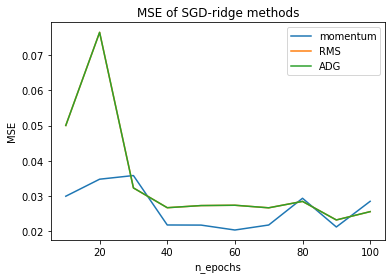

In [49]:
plt.plot(n_epochs_list, mse_test_mom_comp, label='momentum')
plt.plot(n_epochs_list, mse_test_rms_comp, label='RMS')
plt.plot(n_epochs_list, mse_test_adg_comp, label='ADG')
plt.legend()
plt.xlabel("n_epochs")
plt.ylabel("MSE")
plt.title("MSE of SGD-ridge methods")
plt.show()



In [51]:
n_epochs_list = np.arange(10,110,10)
batch_sizes = np.arange(10,90,10)
mse_test_mom_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
mse_test_adg_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
mse_test_rms_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
theta_j = 0
lr = 0
for i in range(len(batch_sizes)):
    batch_size = batch_sizes[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_rms = SGD_ridge(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "RMS", eta = 0.1)
        theta_mom,lr = SGD_ridge(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,decay = 1e-5,gamma = 0.9,algo = "MOM",eta=0.1)
        theta_adg = SGD_ridge(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADG",eta=0.1)



        z_pred_mom = X_test @ theta_mom
        z_pred_rms = X_test @ theta_rms
        z_pred_adg = X_test @ theta_adg

               
        mse_test_rms_size[i,j] = mean_squared_error(z_test,z_pred_rms)
        mse_test_mom_size[i,j] = mean_squared_error(z_test,z_pred_mom)
        mse_test_adg_size[i,j] = mean_squared_error(z_test,z_pred_adg)



In [52]:
epoch_list = []
num_minibatch = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
for i in range(len(batch_sizes)):
    num_minibatch.append("mini_batches = {}".format(int(320/batch_sizes[i])))
    
df_mse_heatmap_rms_size = pd.DataFrame(mse_test_rms_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_mom_size = pd.DataFrame(mse_test_mom_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_adg_size = pd.DataFrame(mse_test_adg_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_rms_size

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
mini_batches = 32,0.099869,0.040835,0.029554,0.037293,0.023931,0.045932,0.029001,0.029831,0.023766,0.023823
mini_batches = 16,0.062310,0.039524,0.037896,0.030972,0.025864,0.108190,0.028383,0.043686,0.029613,0.053623
mini_batches = 10,0.778325,0.037392,0.031381,0.045781,0.033009,0.049299,0.052431,0.043854,0.039573,0.029544
mini_batches = 8,0.152324,0.039766,0.030014,0.044601,0.025566,0.030452,0.025793,0.025969,0.038291,0.035986
mini_batches = 6,0.633346,0.046170,0.039472,0.036199,0.037582,0.091649,0.030317,0.050681,0.034171,0.062319
mini_batches = 5,0.125647,0.053323,0.045052,0.033438,0.043776,0.094152,0.112805,0.036795,0.086350,0.038024
mini_batches = 4,0.115512,0.053863,0.044654,0.040875,0.068876,0.216054,0.064240,0.052240,0.037508,0.398359
mini_batches = 4,0.115681,0.046813,0.184817,0.057260,0.061810,0.049916,0.050992,0.042456,0.080038,0.497372


Text(0.5, 1.0, 'Adagrad MSE number of mini batches and epochs')

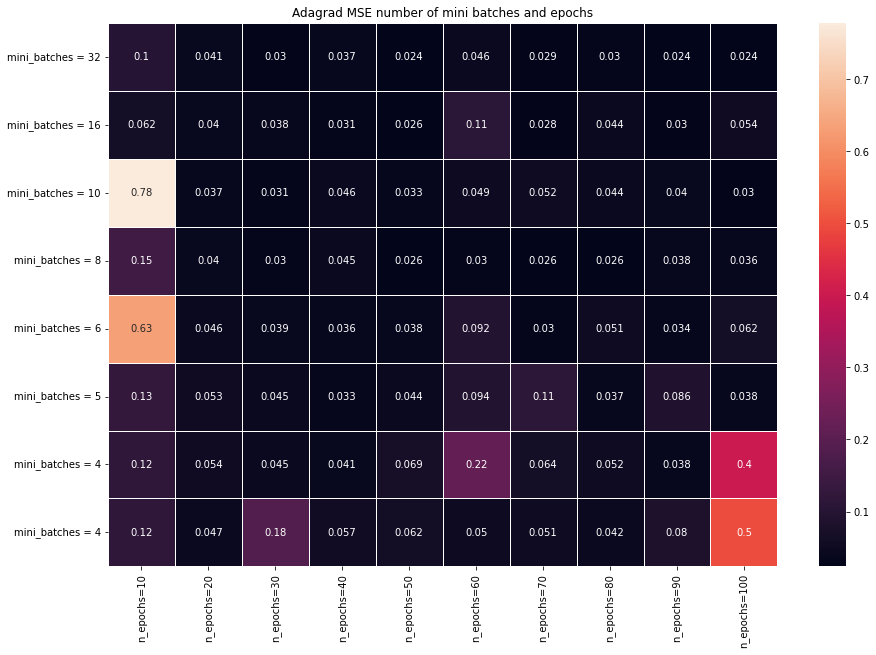

In [53]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adg_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("Adagrad MSE number of mini batches and epochs")

Text(0.5, 1.0, 'momentum MSE number of mini batches and epochs')

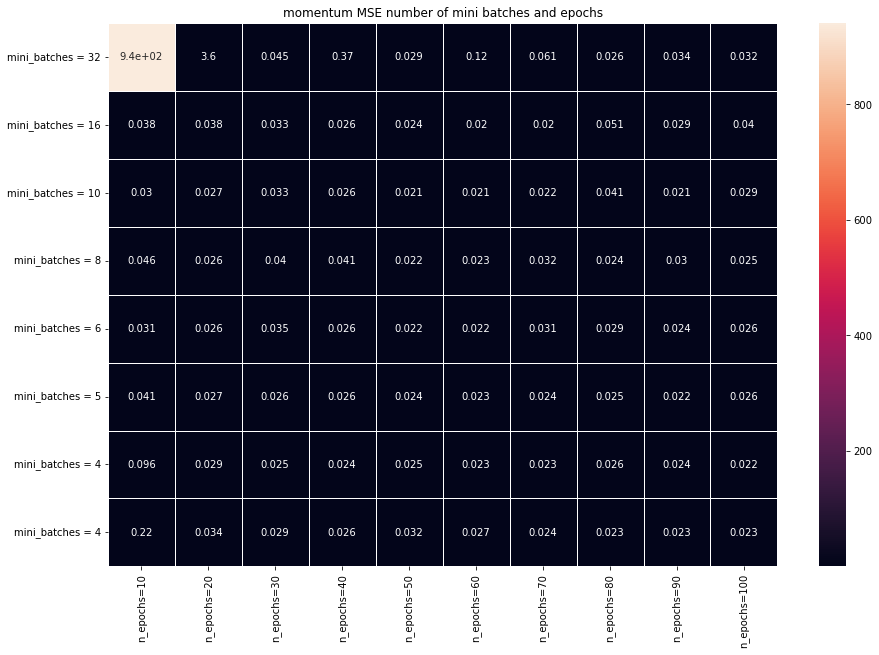

In [54]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_mom_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("momentum MSE number of mini batches and epochs")

Text(0.5, 1.0, 'RMS MSE number of mini batches and epochs')

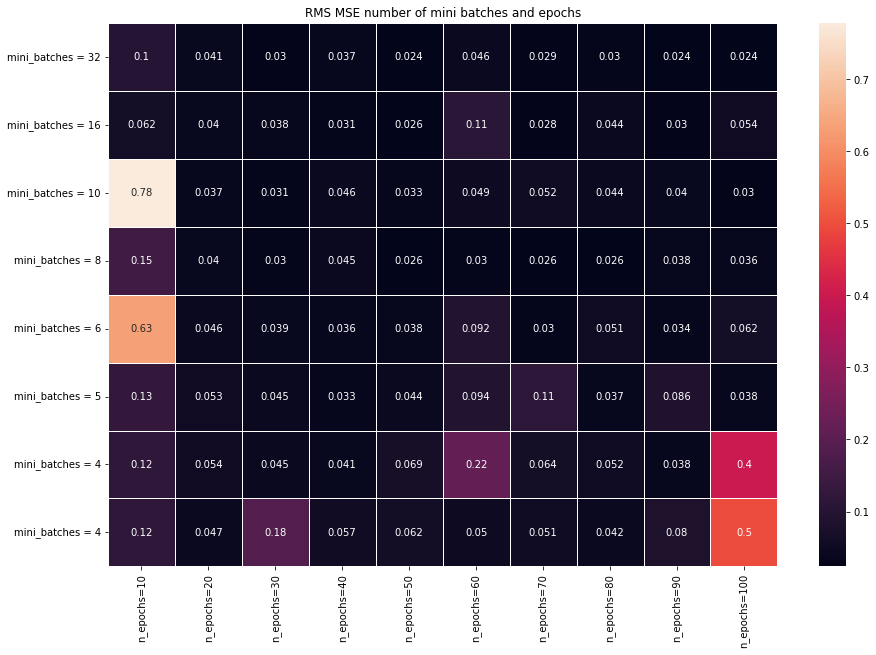

In [55]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_rms_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("RMS MSE number of mini batches and epochs")